In [1]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np

In [2]:
# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

In [3]:
# Preprocesado y modelado
# ==============================================================================
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
import statsmodels.formula.api as smf


In [4]:
# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [5]:
# Conexión a BD
# ==============================================================================
import pyodbc

In [6]:
# Configuración de BD y conexión
# ==============================================================================
direccion_servidor = 'LAPTOP-2R1SCPJG\SQLEXPRESS'
nombre_bd = 'BDVirunet'
nombre_usuario = 'sa'
password = '123456'

try:
    conexion = pyodbc.connect('DRIVER={ODBC Driver 17 for SQL Server};SERVER=' + 
                              direccion_servidor+';DATABASE='+nombre_bd+';UID='+nombre_usuario+';PWD=' + password)
    print("Conexión exitosa")
    
except Exception as e:
    print("Ocurrió un error al conectar a SQL Server: ", e)

Conexión exitosa


# Recolección de datos

## Plagas

In [7]:
dFechaInicio = '2019-01-01'
dFechaFin = '2019-12-31'

In [8]:
try:
    with conexion.cursor() as cursor:
            consulta = "exec STP_OBTENER_TOTALIZADO_PLAGAS ?,?,?,?"
            cursor.execute(consulta, (dFechaInicio, dFechaFin, 1,1))

            rows = cursor.fetchall()
            
            cols = []
            
            for i,_ in enumerate(cursor.description):
                cols.append(cursor.description[i][0])

            pd.DataFrame(np.array(rows), columns = cols)
            
            df = pd.DataFrame(columns =['Evaluador','Fecha','Fundo','Filtrado','Turno','Lote','Grupo_Plaga','Plaga','Caracteristica','Suma','Grado','Promedio','Porcentaje'] )
            for i in range(len(rows)):
                df.loc[i] = list(rows[i])
except Exception as e: 
    print(e)

## Clima

In [9]:
data_weather = pd.ExcelFile('D:/bibliografia de tesis/Datos/Datos Climaticos Viru Palto.xlsx')
df_weather = data_weather.parse('TABLA')  
data_weather.close()

In [10]:
df_weather = df_weather[df_weather['Año'] == 2019]

In [11]:
df_weather.reset_index(drop = True, inplace = True)

In [12]:
df_weather = df_weather[['Fecha','ET(mm).','Tº MIN/DIA (°C)','Tº MAX/DIA (°C)','Rad. Solar Prom.','HUMEDAD PROM.', 'T° Prom/Día (°C)']]
df_weather = df_weather.rename(columns = {'ET(mm).' : 'ET', 
                                      'Tº MIN/DIA (°C)' : 'T_MIN',
                                     'Tº MAX/DIA (°C)': 'T_MAX',
                                     'Rad. Solar Prom.' : 'RS_PROM',
                                     'HUMEDAD PROM.': 'HM_PROM',
                                      'T° Prom/Día (°C)': 'TMP_PROM'})

In [13]:
arrFiltrados = df['Filtrado'].unique()

### Relación entre las variables

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


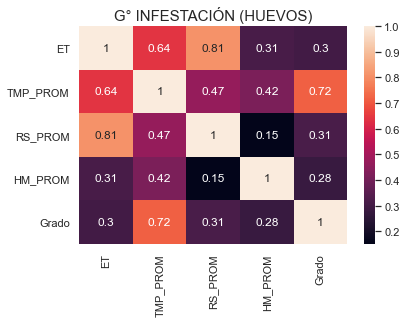

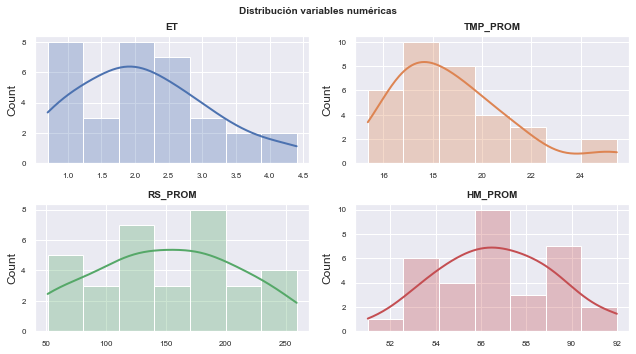

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


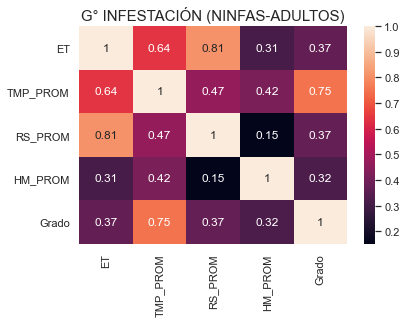

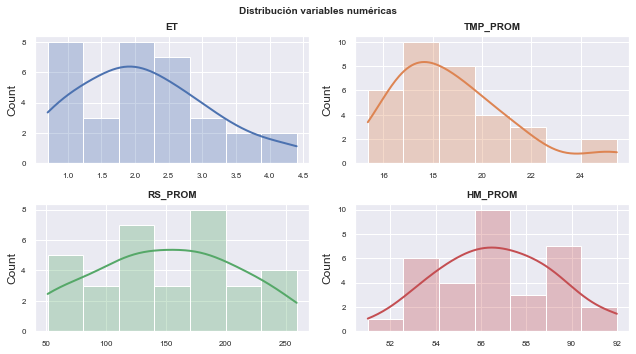

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1028
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


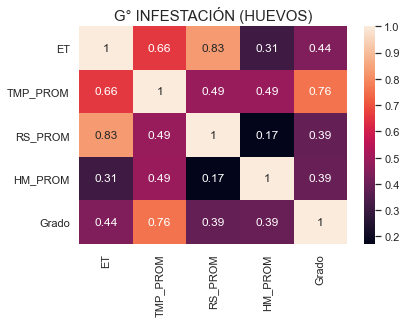

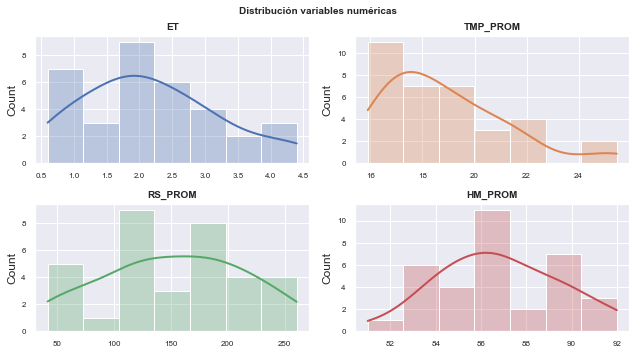

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1028
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


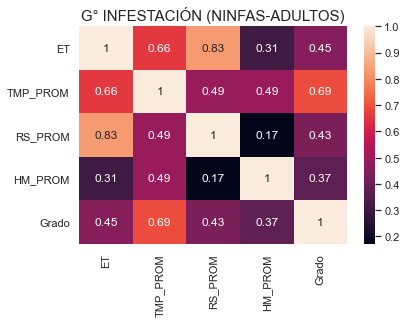

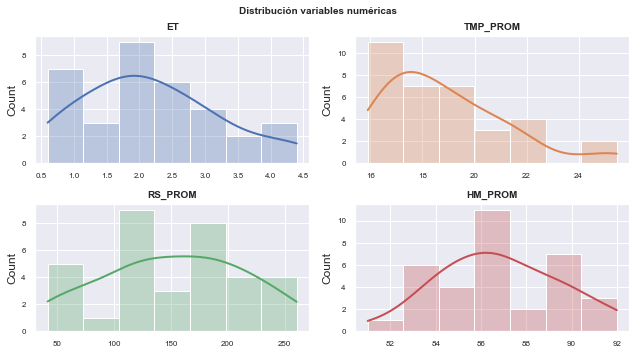

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


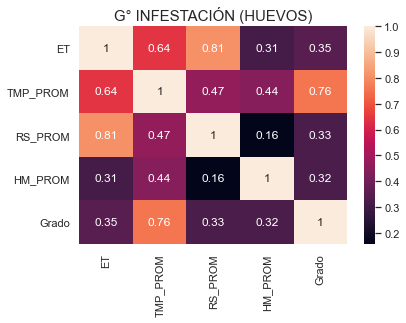

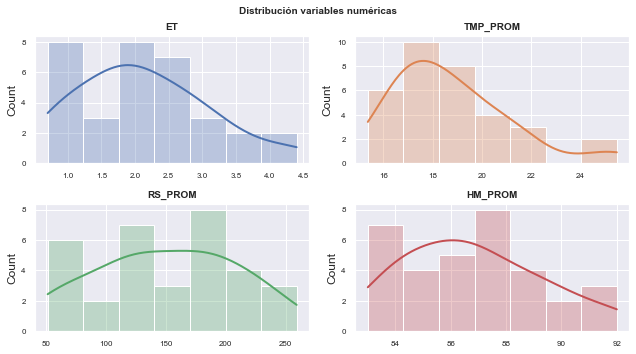

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


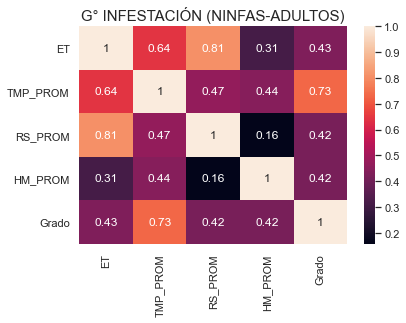

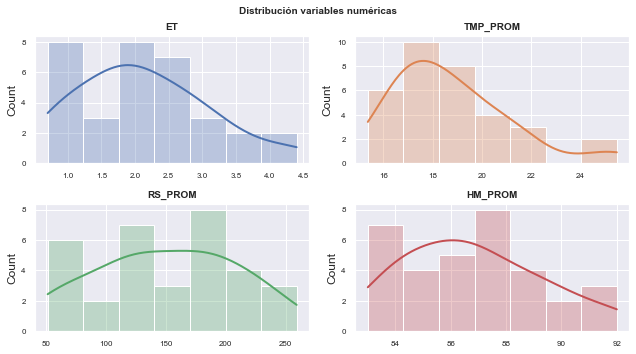

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


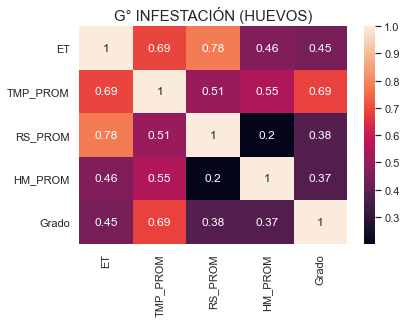

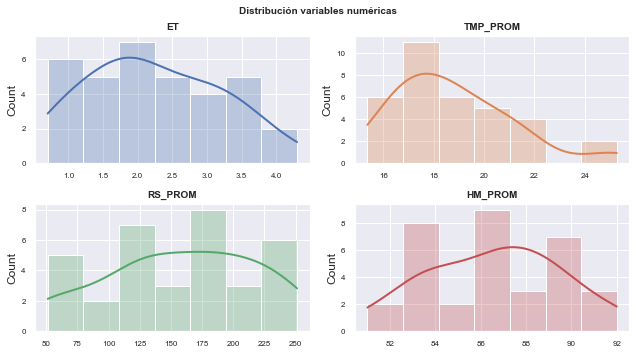

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


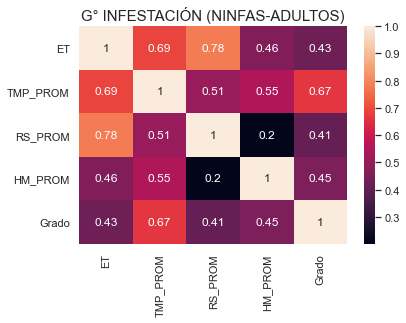

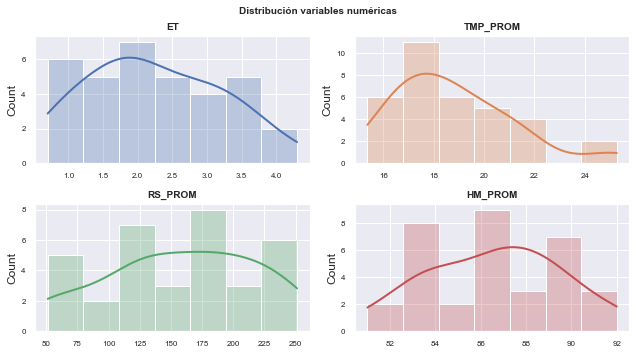

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1029
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


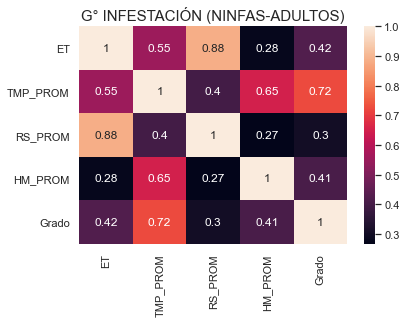

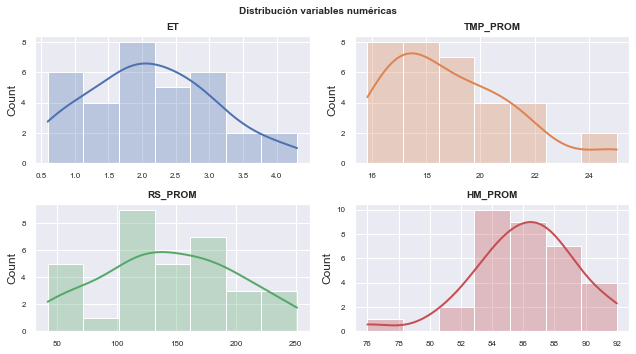

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1029
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


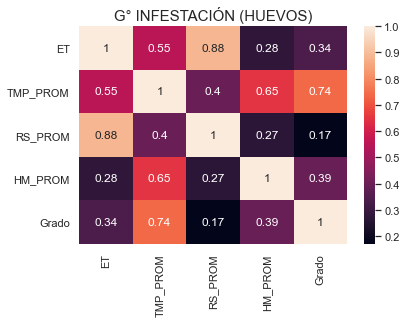

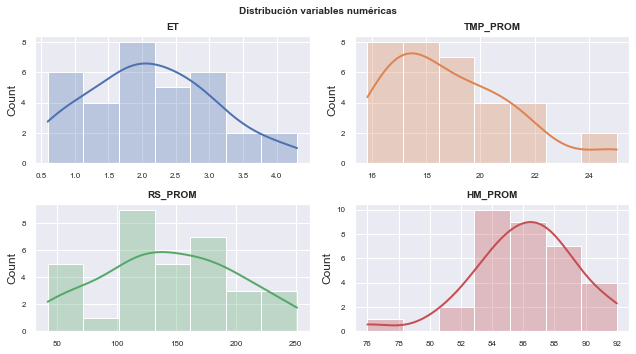

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1016
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


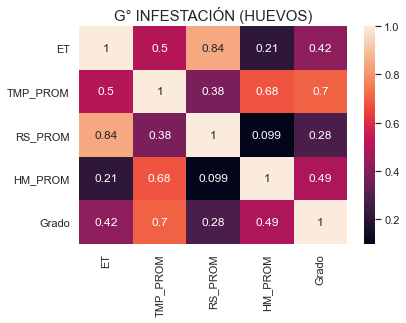

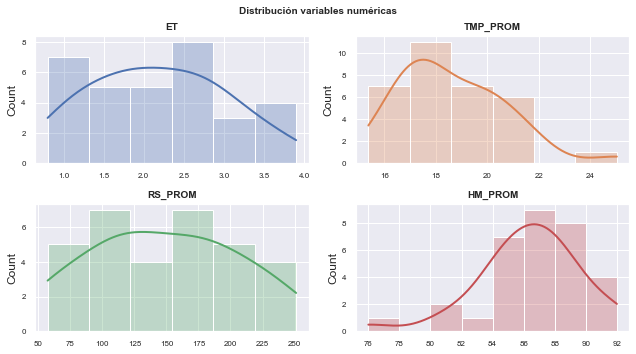

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1017
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


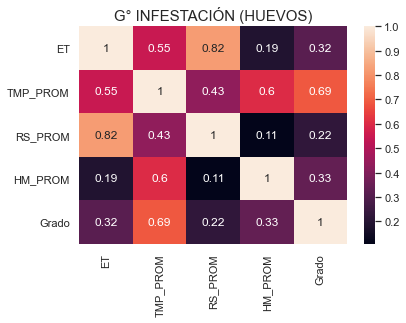

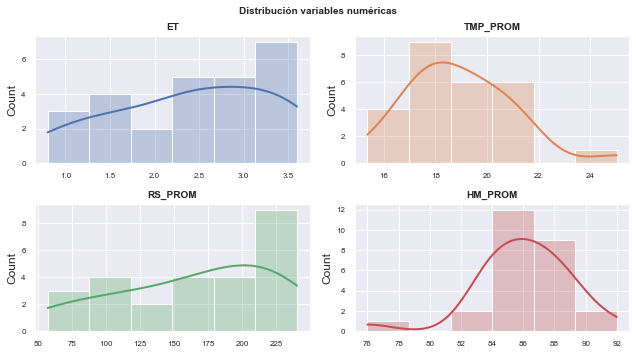

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1017
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


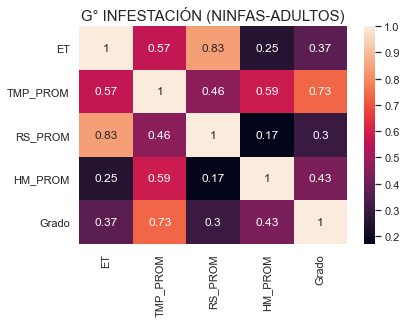

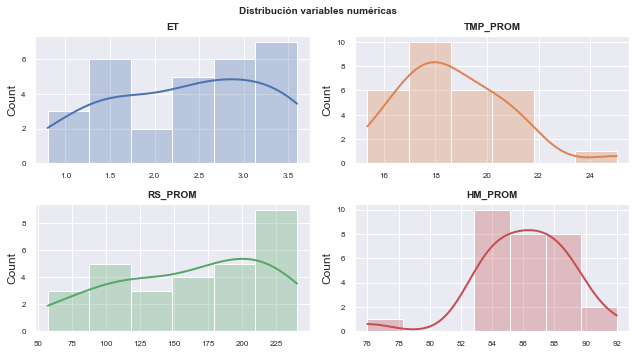

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


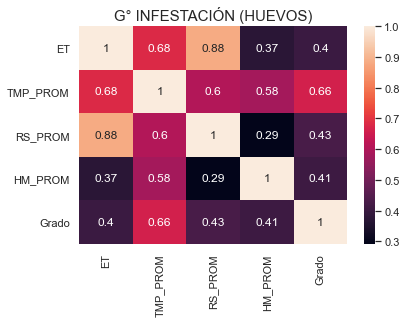

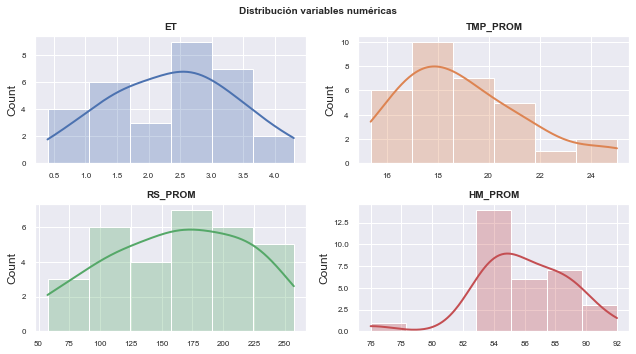

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


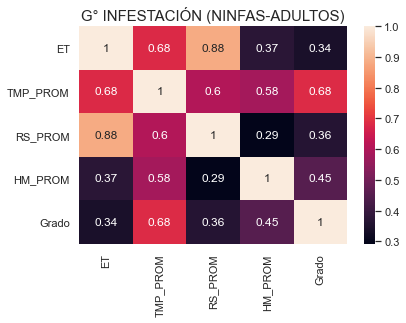

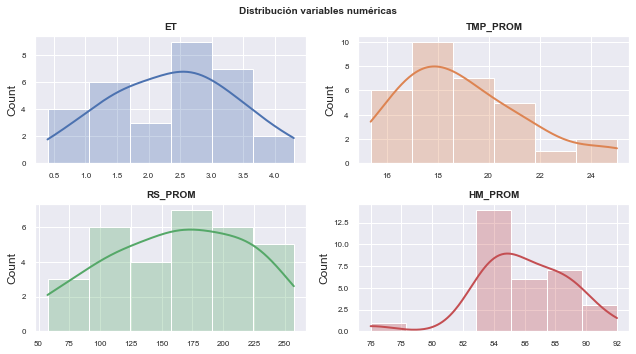

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


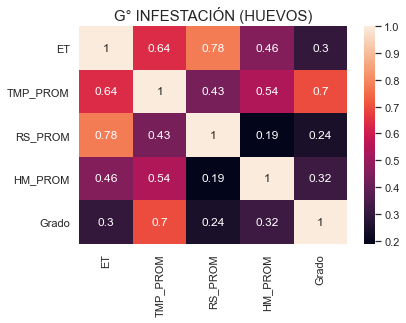

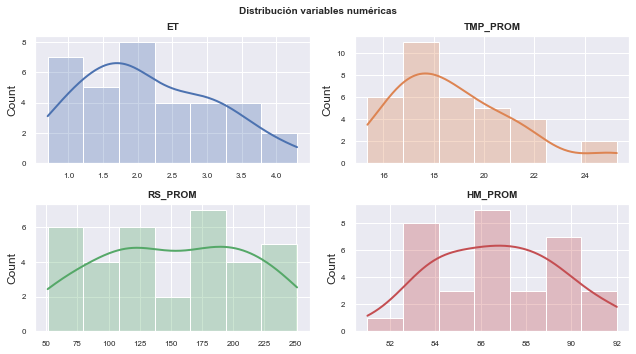

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


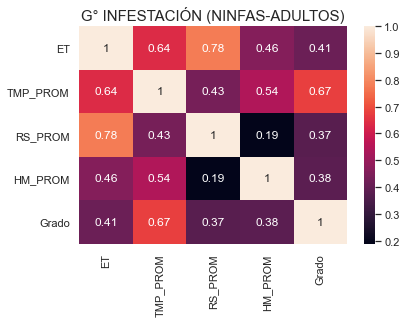

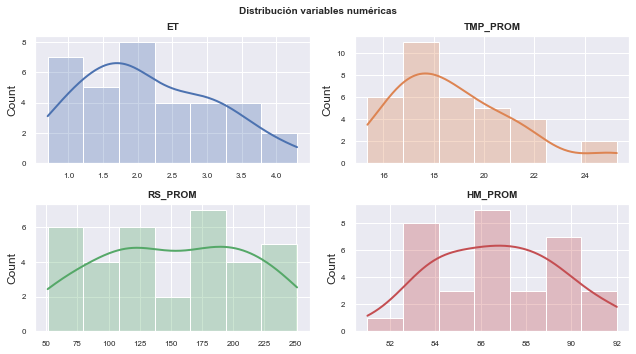

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1030
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


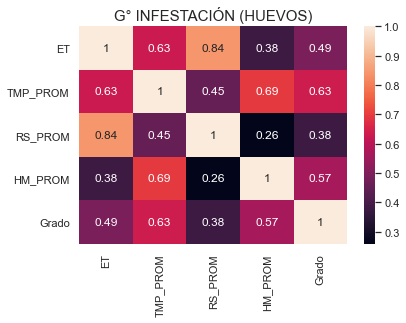

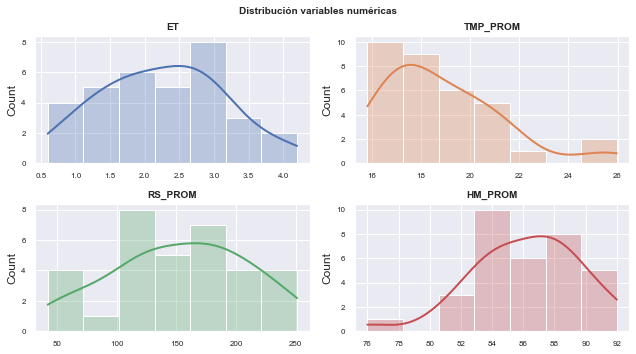

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1030
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


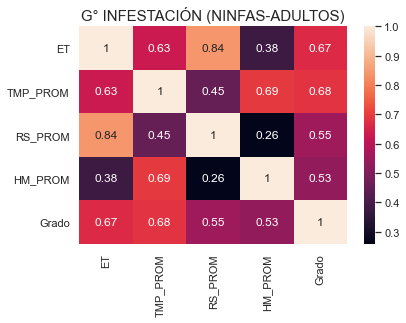

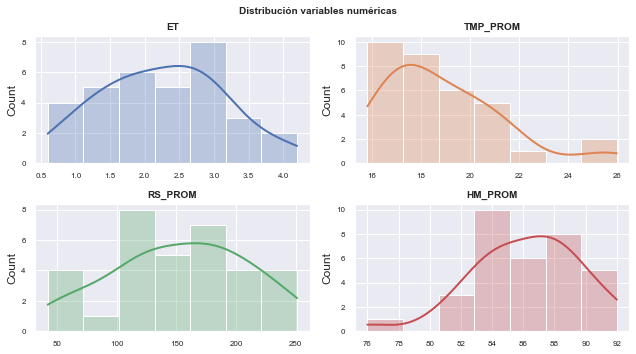

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


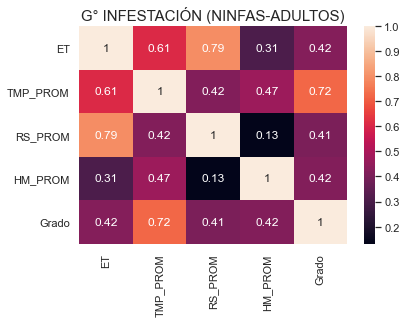

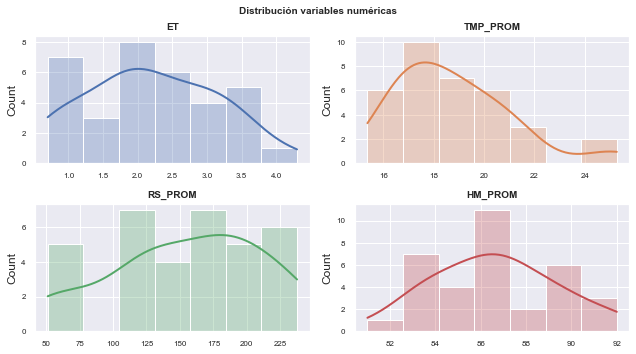

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


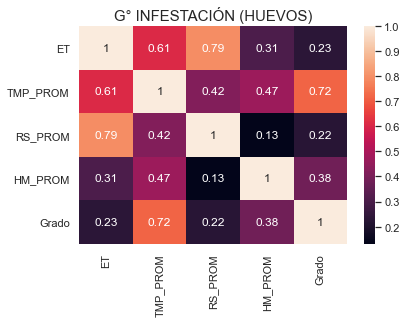

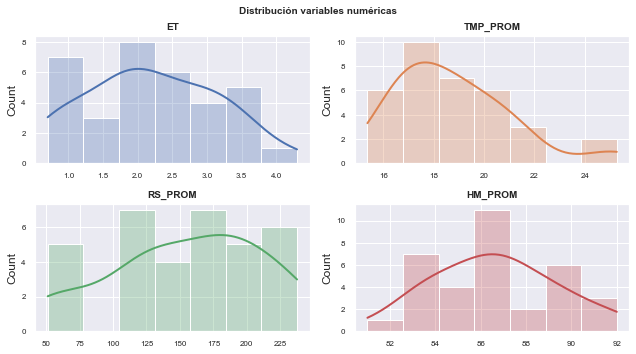

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


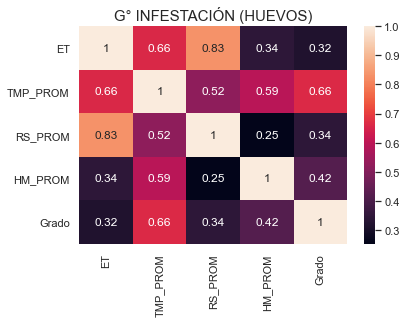

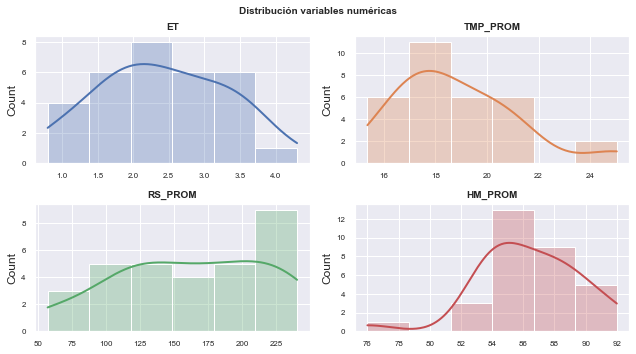

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


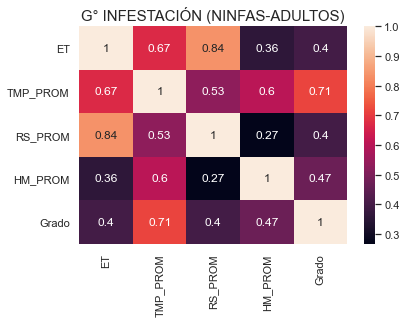

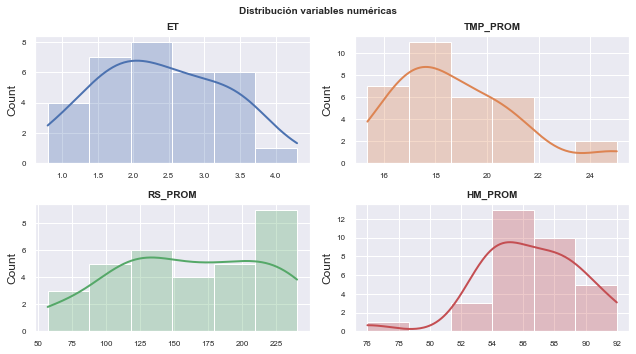

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1011
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


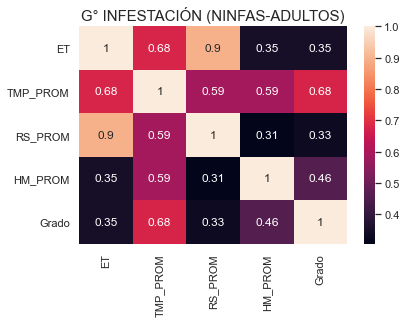

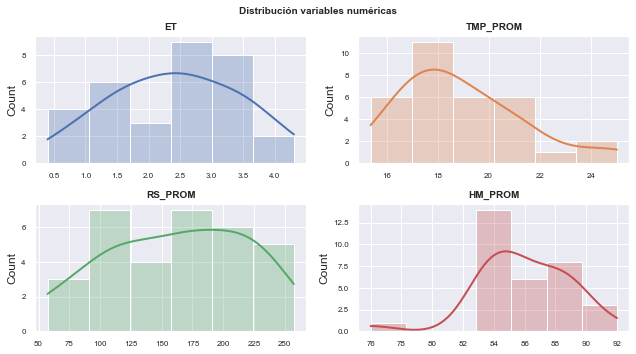

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1006
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


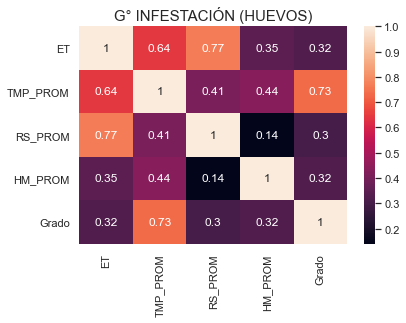

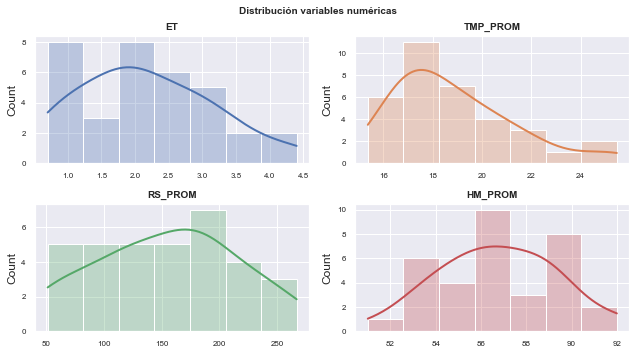

------------------------------------------------------------
Lugar: Filtrado 10N - Turno F10N - Lote 1006
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


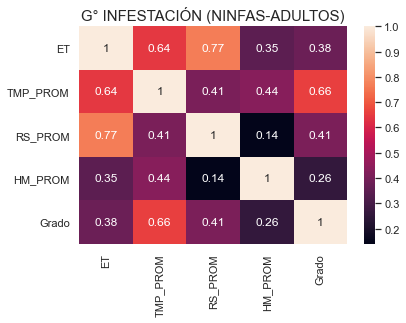

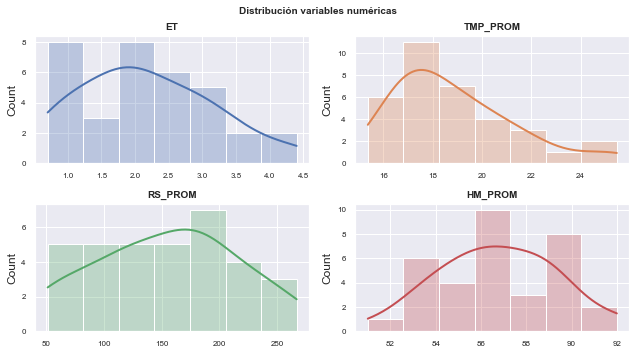

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1139
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


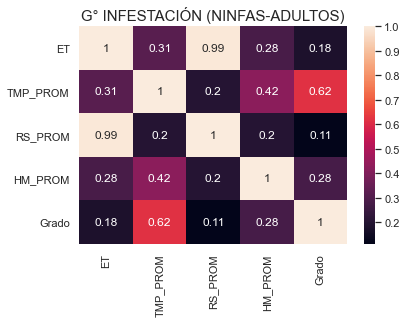

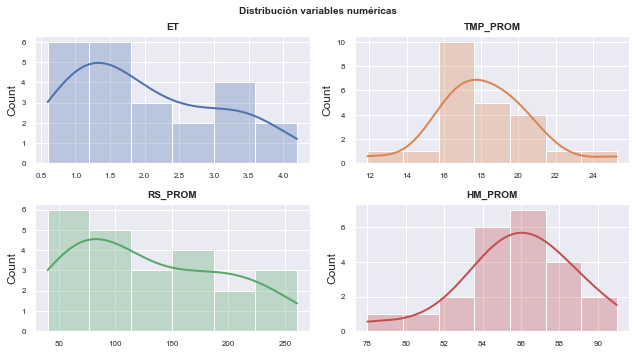

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1158
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


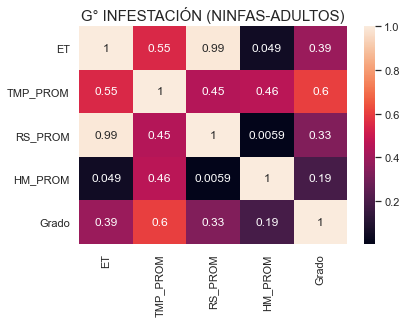

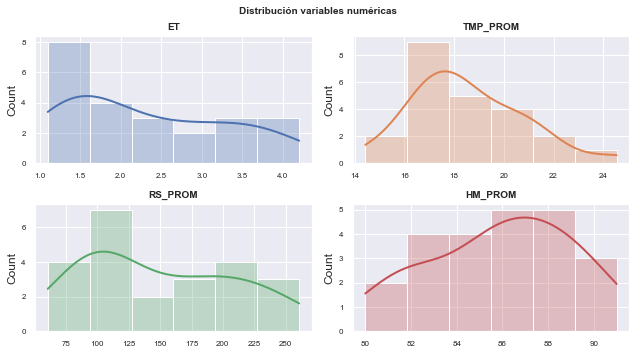

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1157
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


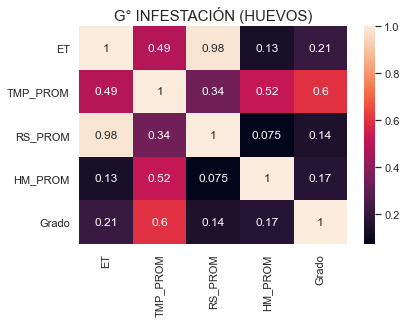

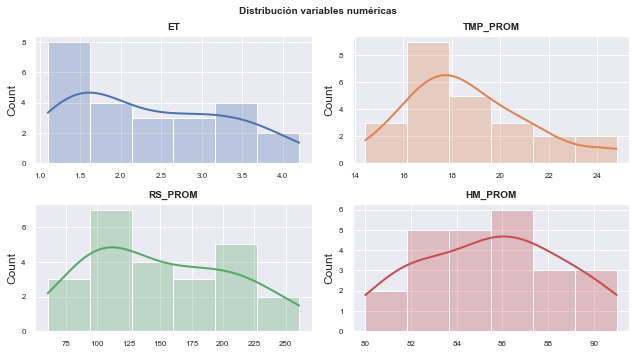

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1146
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


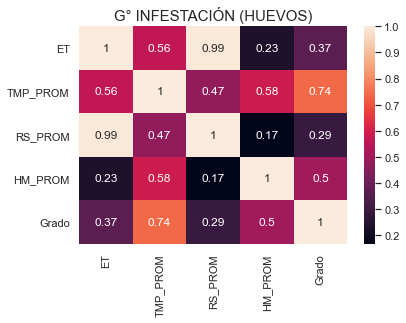

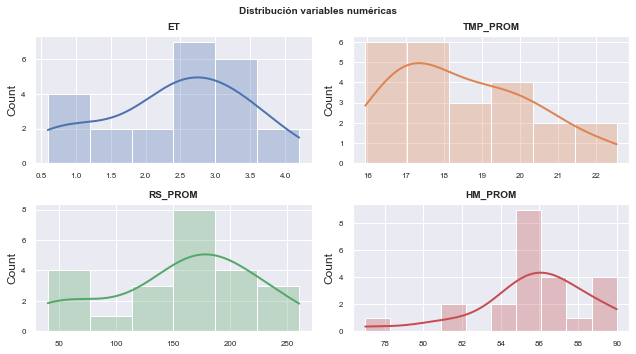

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1146
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


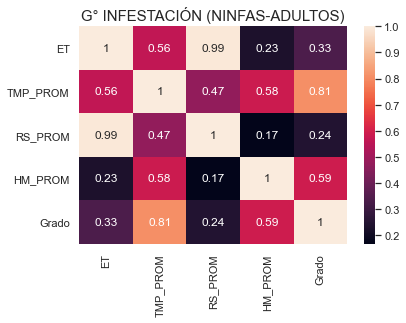

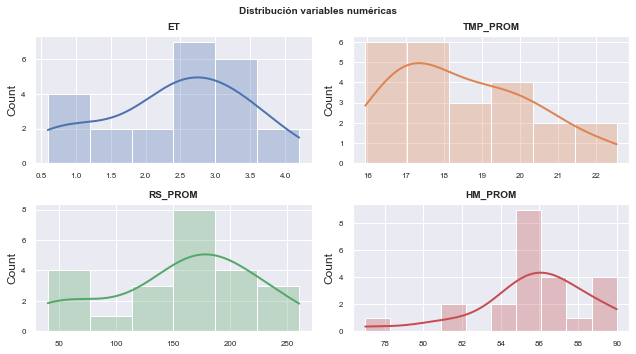

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1155
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


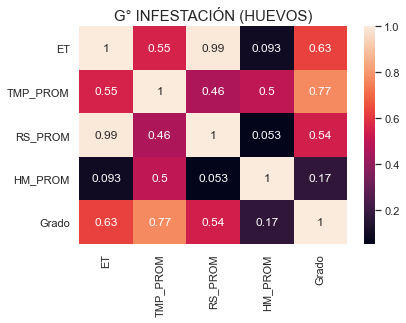

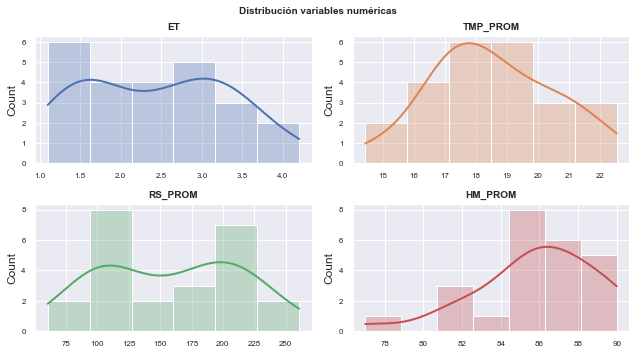

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1155
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


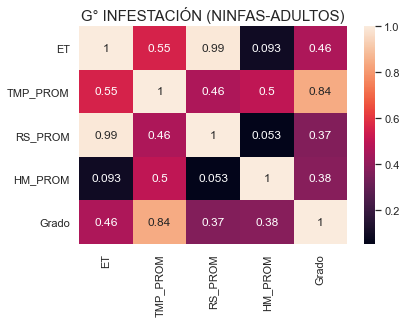

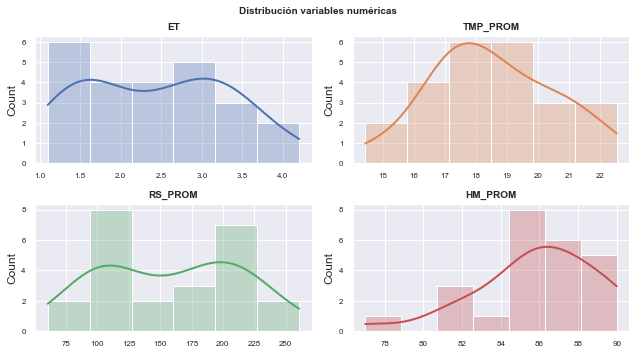

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1160
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


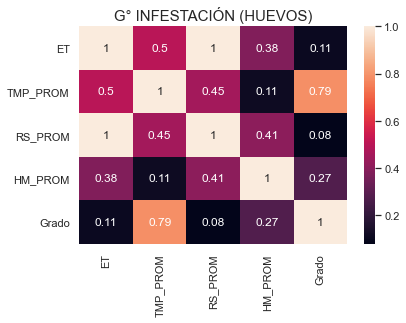

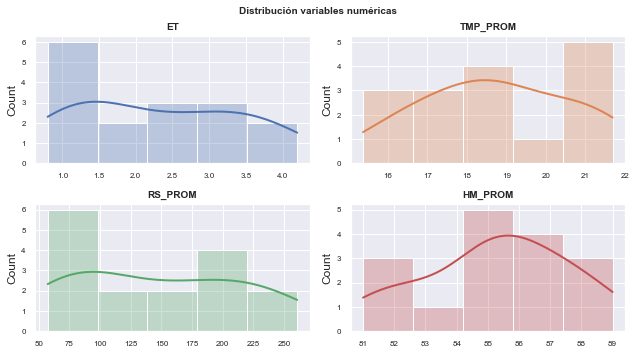

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1144
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


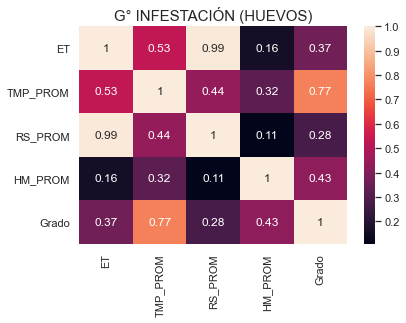

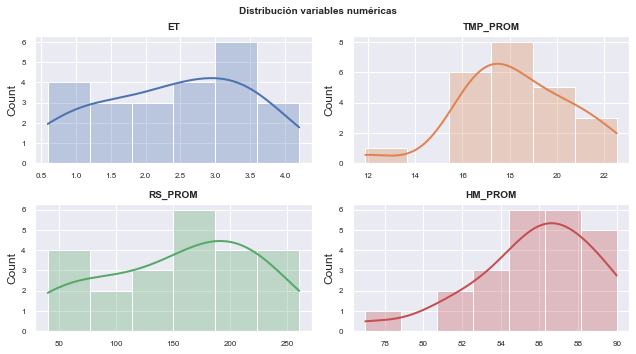

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1144
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


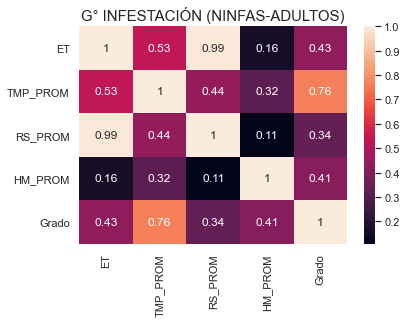

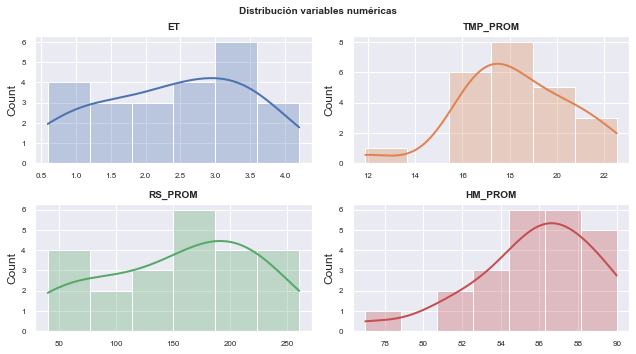

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1147
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


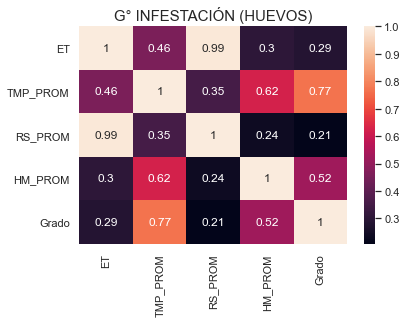

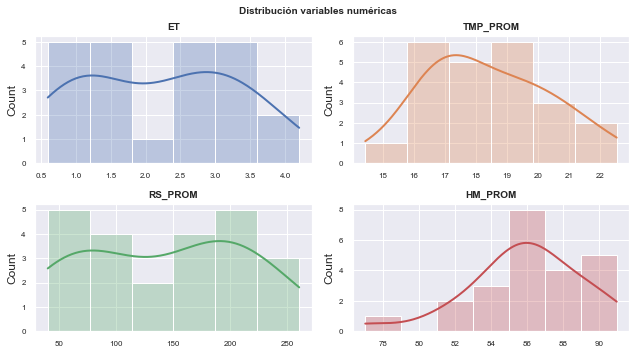

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1147
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


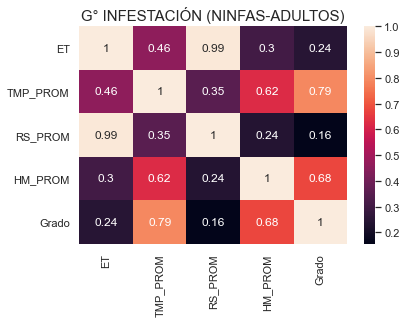

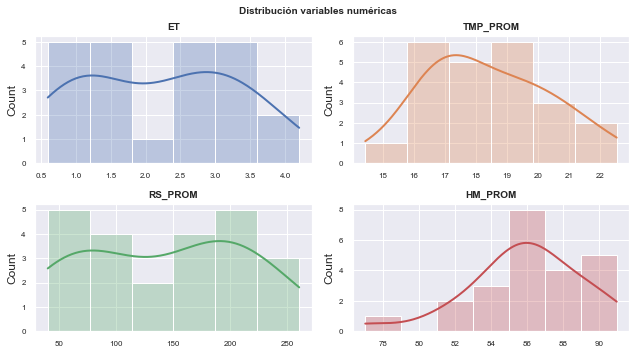

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1143
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


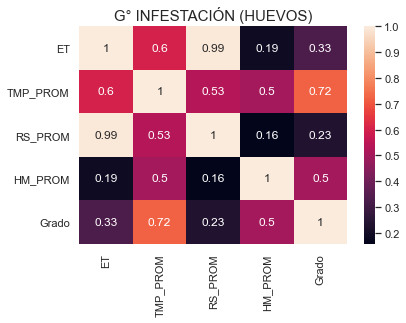

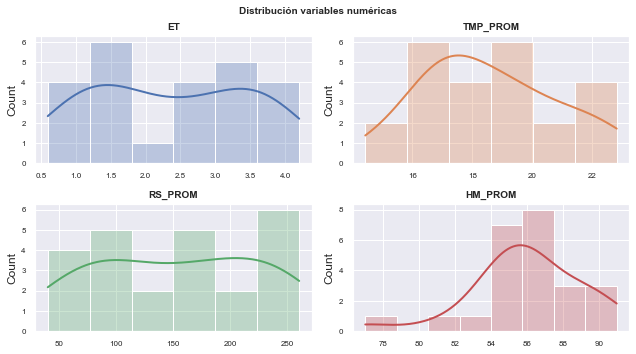

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1143
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


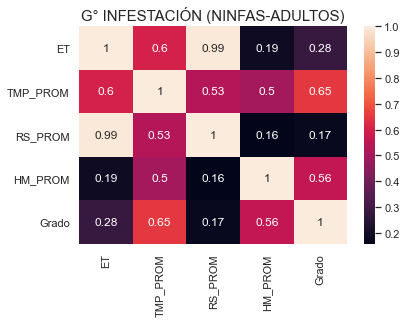

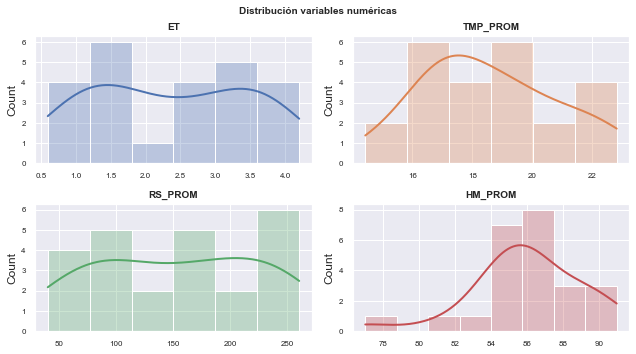

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1145
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


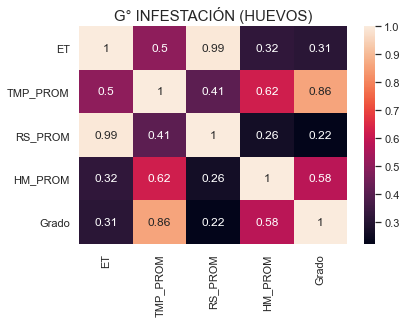

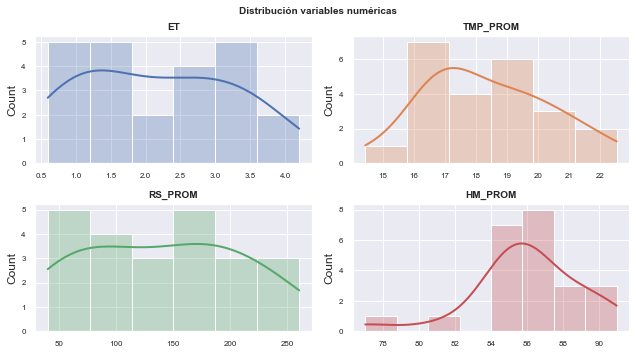

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1145
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


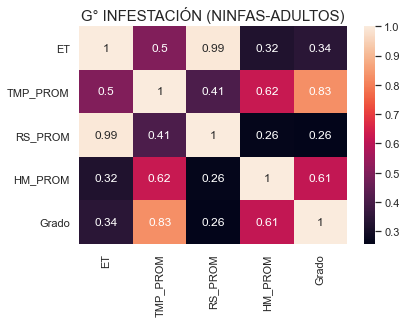

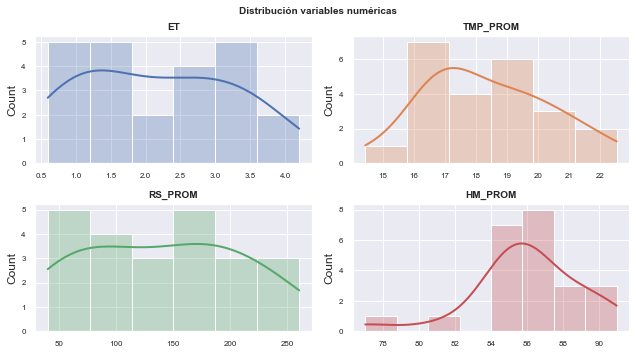

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1148
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


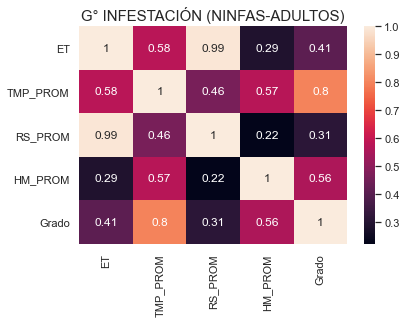

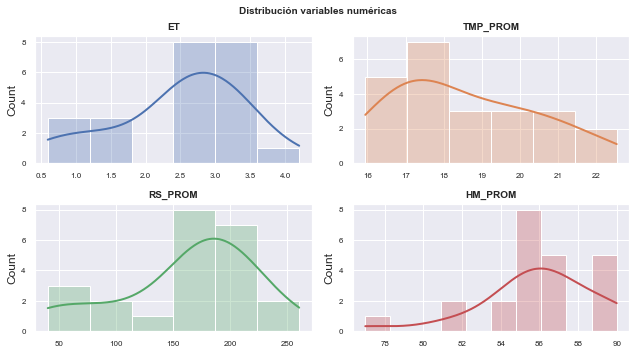

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1148
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


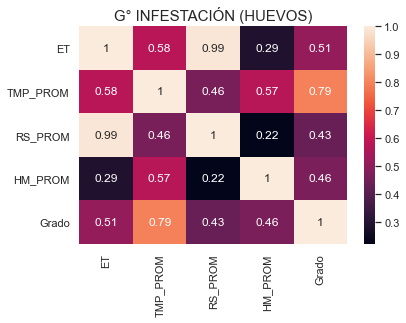

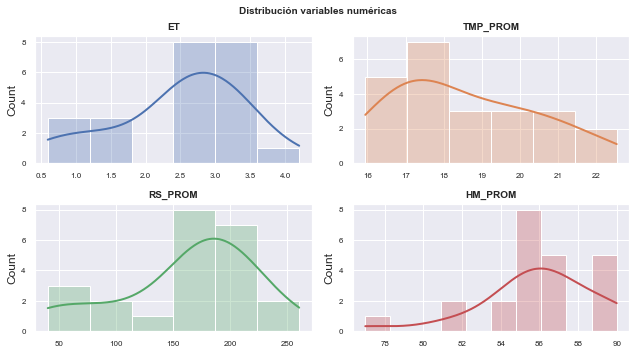

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1156
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


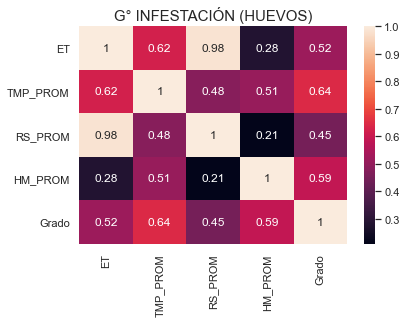

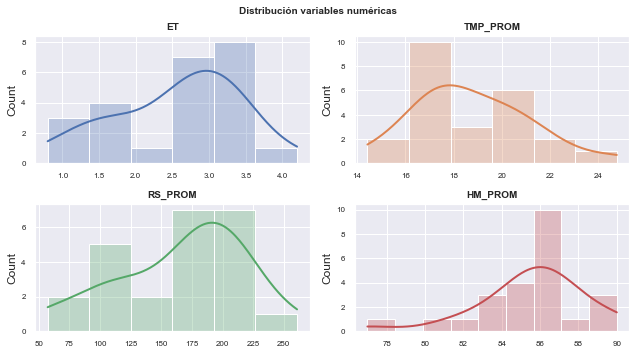

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1151
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


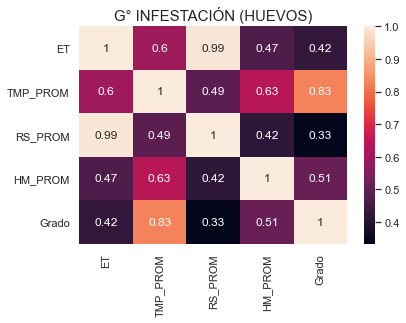

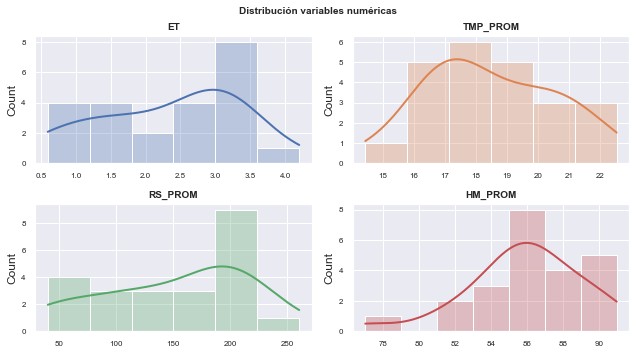

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1151
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


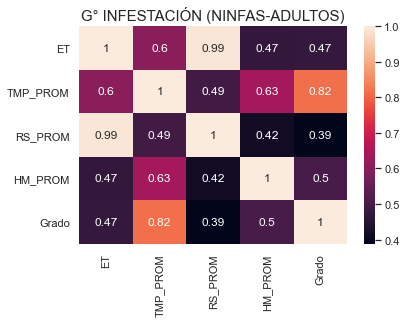

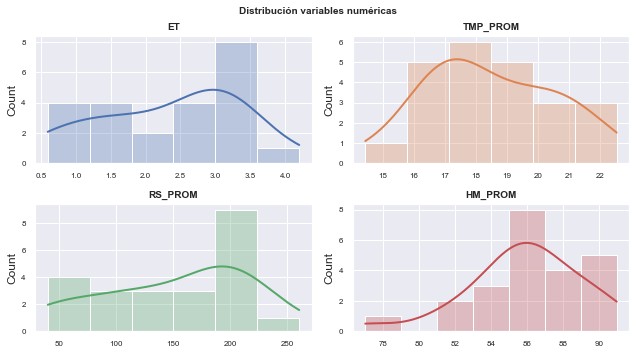

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1159
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


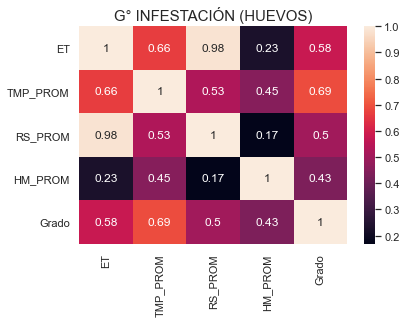

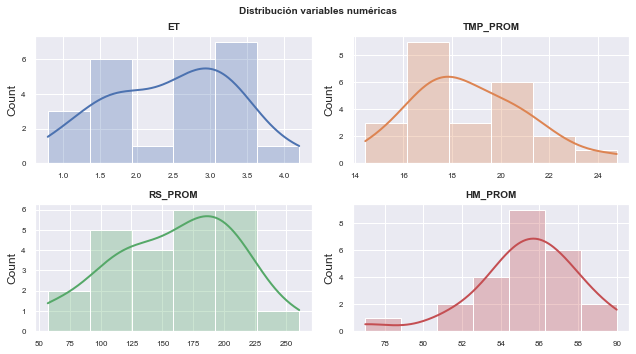

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1154
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


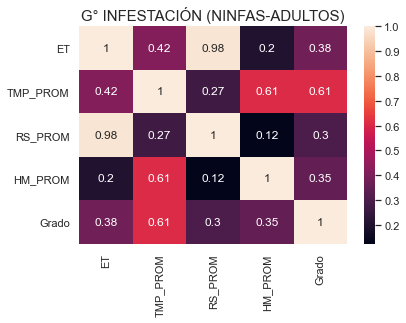

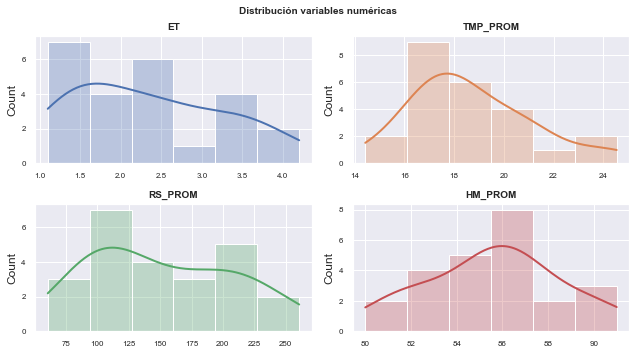

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1153
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


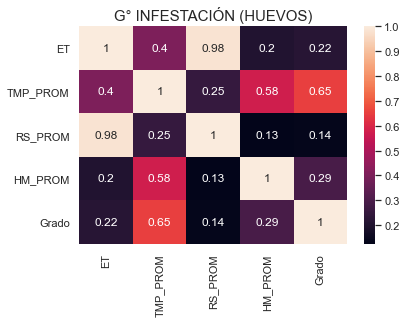

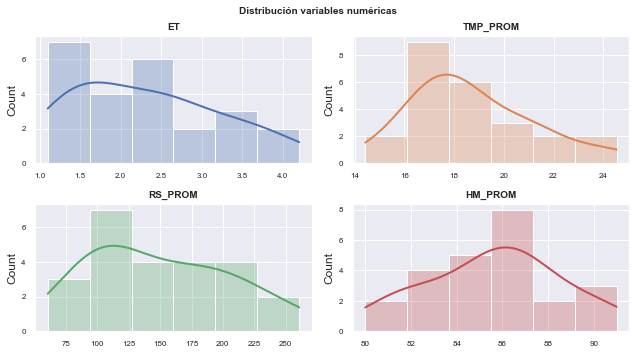

------------------------------------------------------------
Lugar: Filtrado 11N - Turno T00 - Lote 1152
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


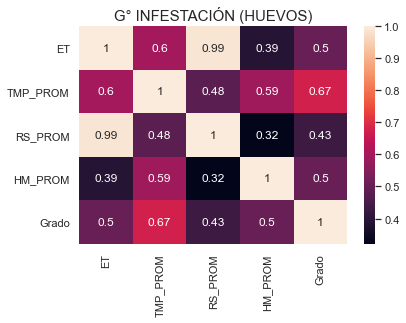

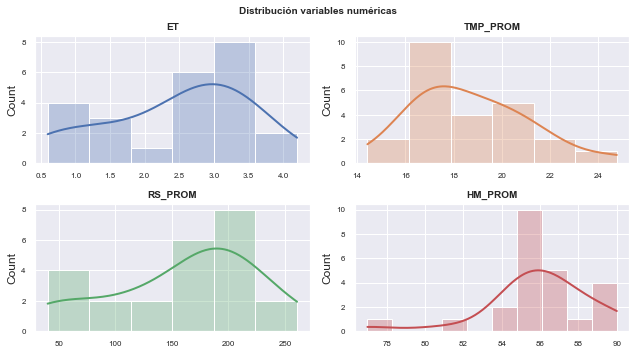

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1301
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


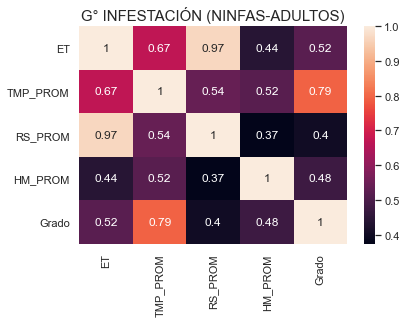

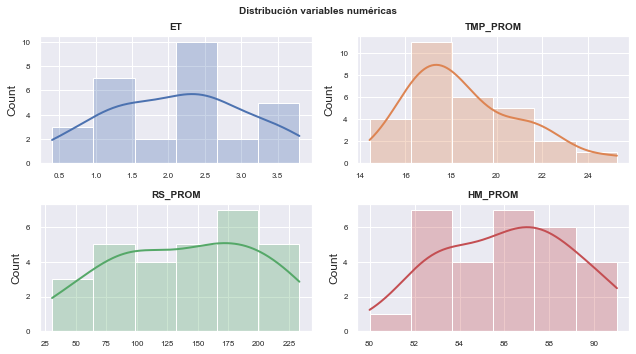

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1301
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


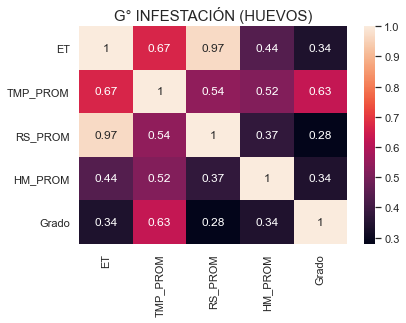

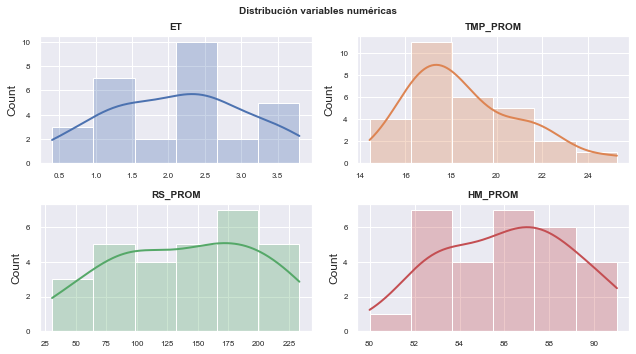

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1320
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


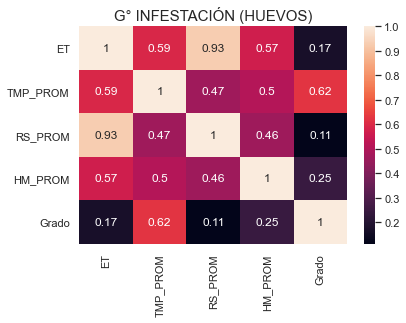

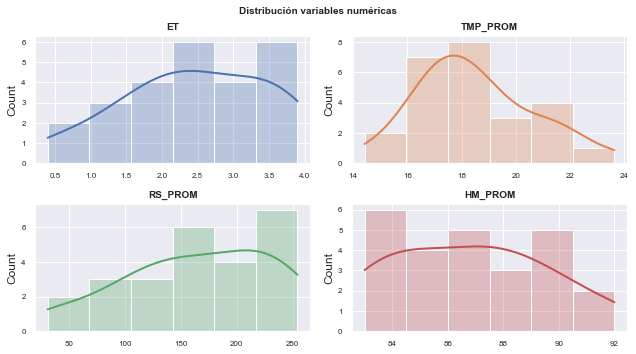

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1320
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


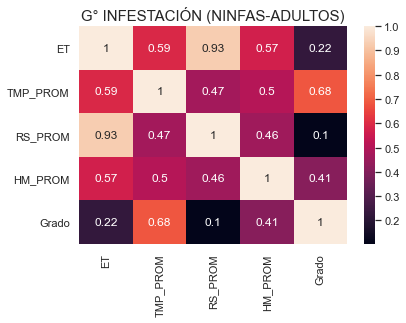

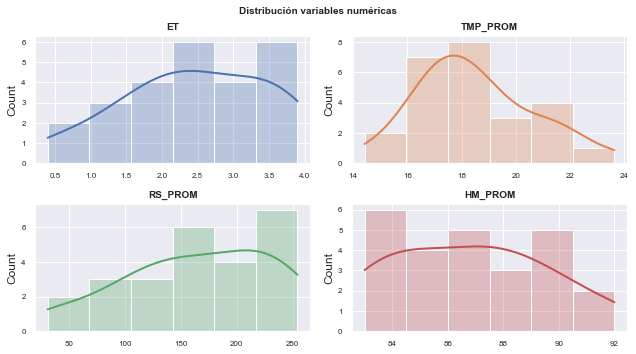

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1315
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


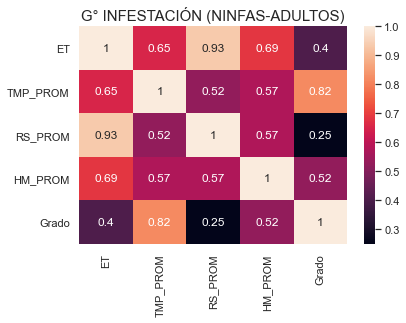

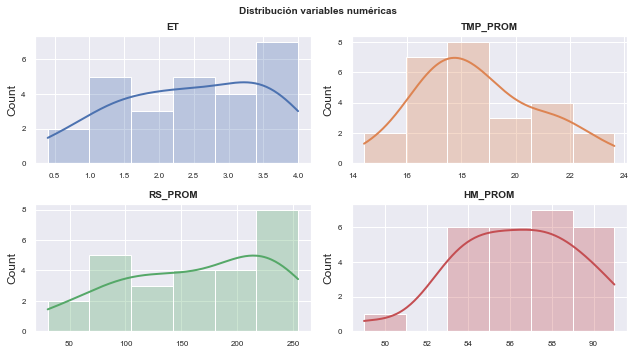

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1315
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


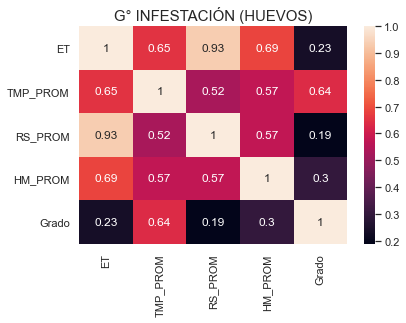

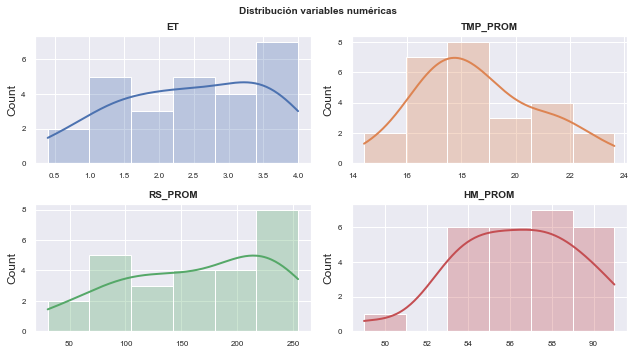

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1310
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


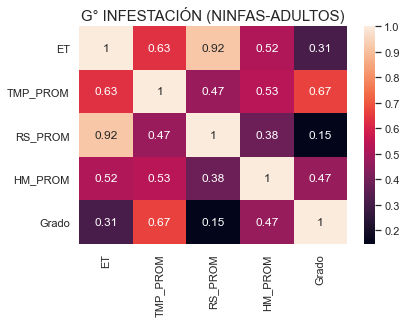

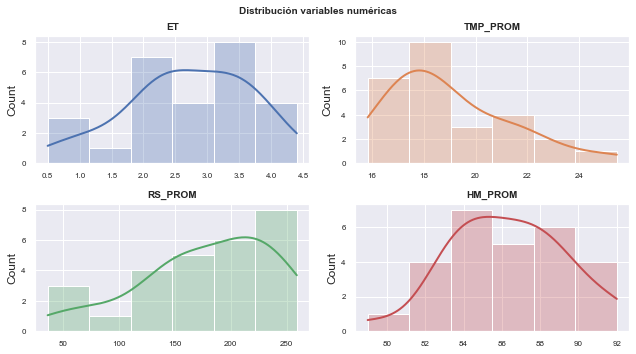

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1313
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


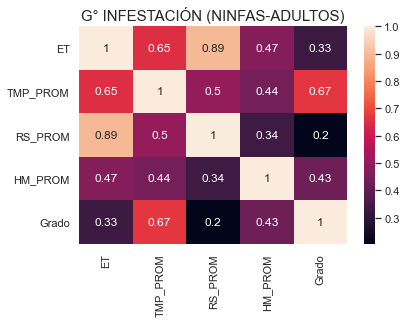

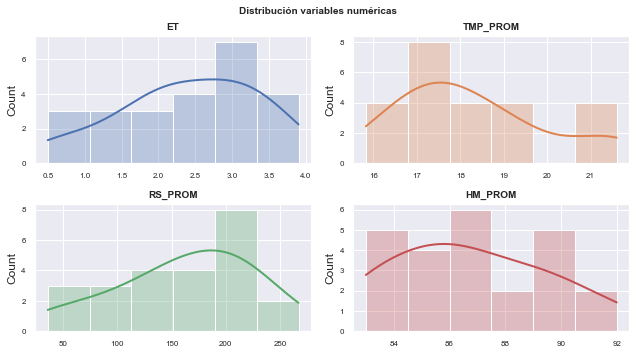

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1309
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


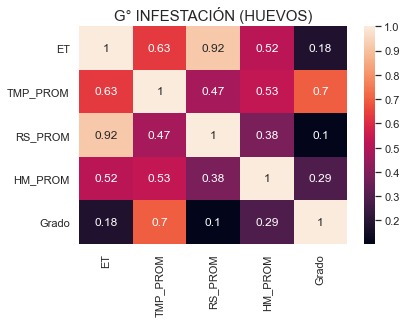

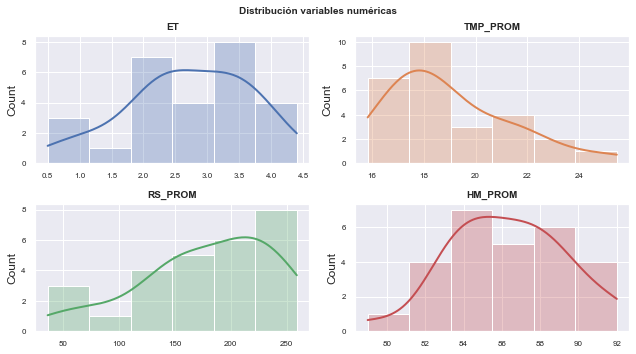

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1309
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


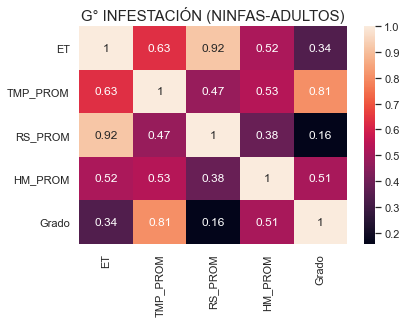

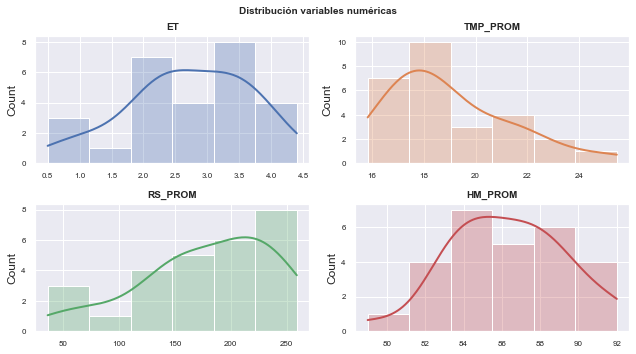

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1304
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


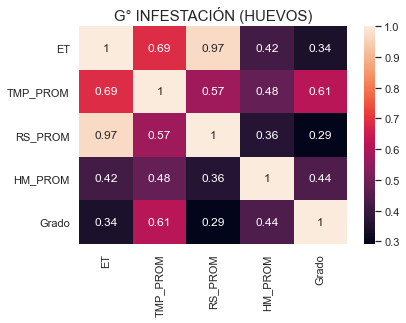

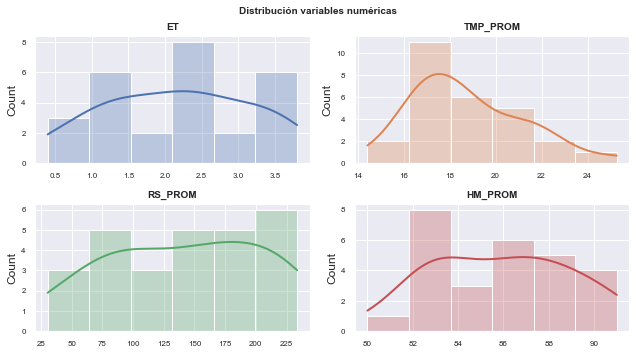

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1304
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


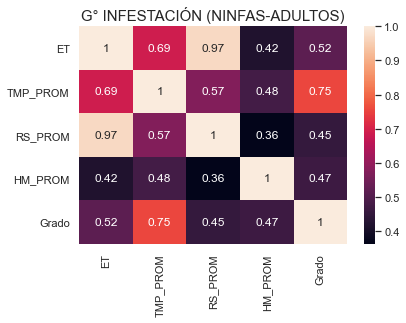

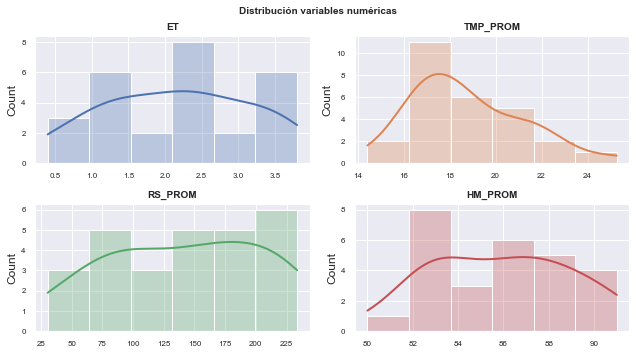

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1312
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


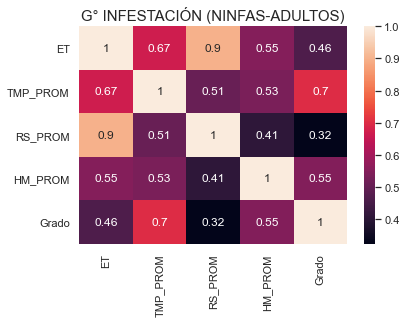

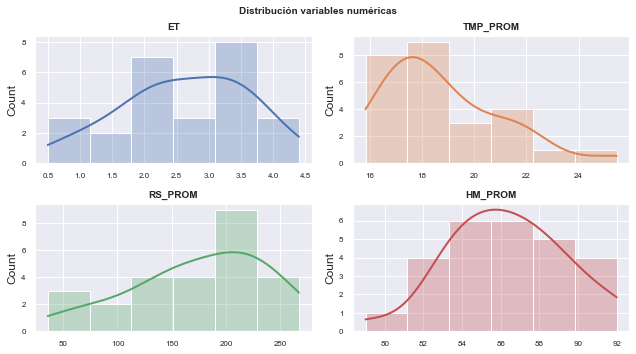

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1317
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


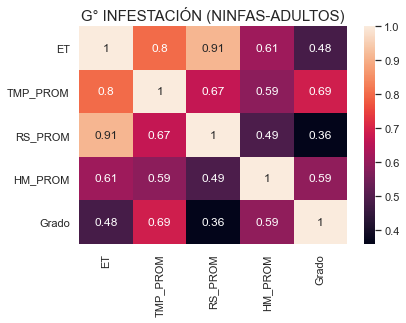

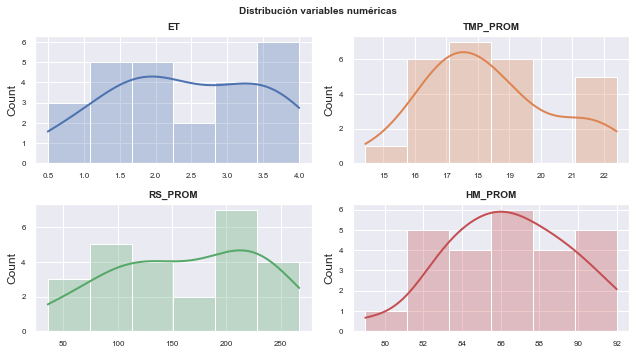

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1307
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


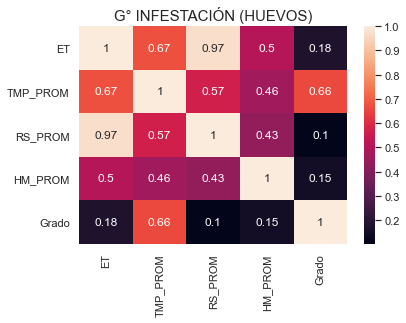

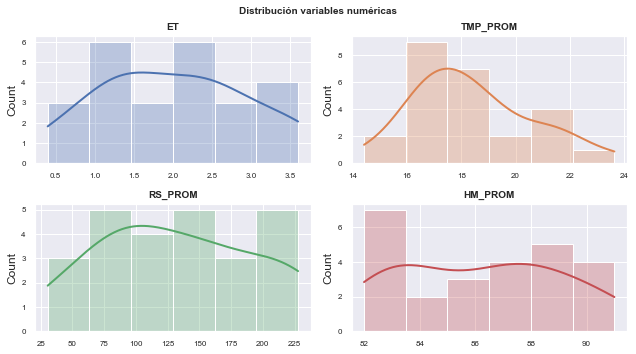

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1307
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


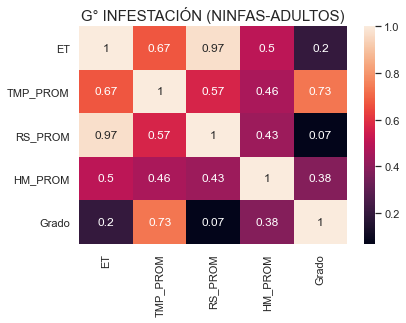

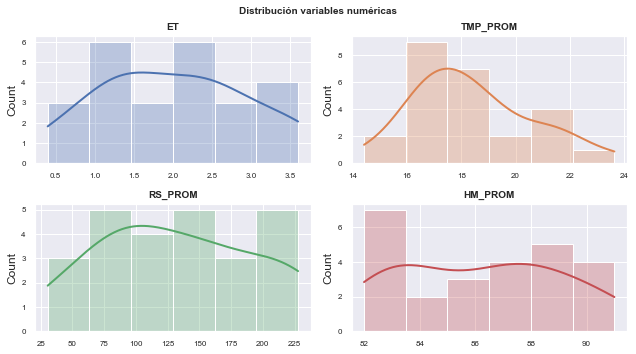

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1302
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


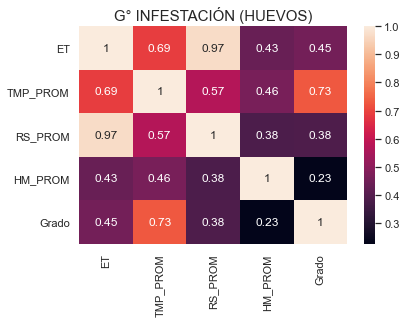

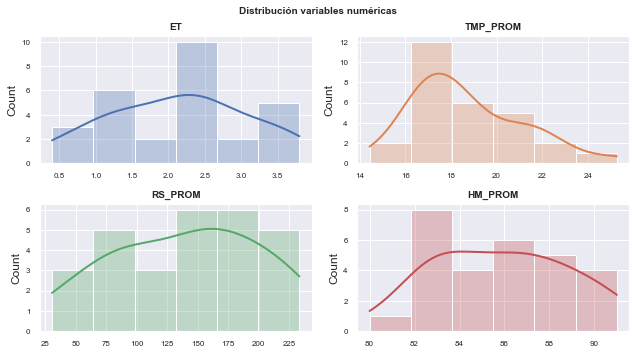

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1302
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


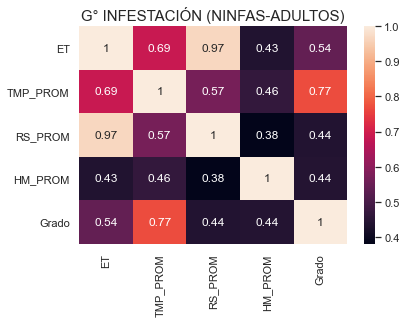

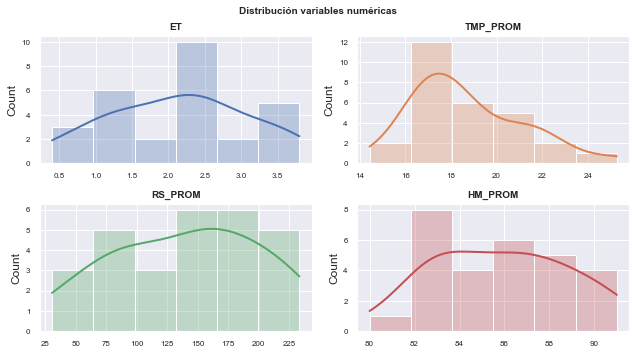

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1303
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


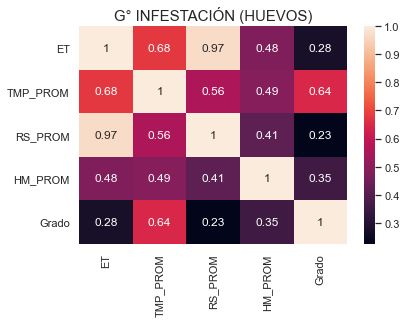

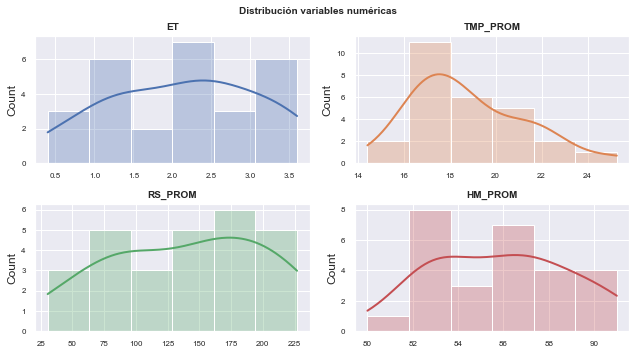

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1303
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


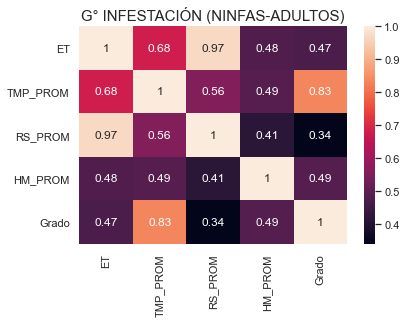

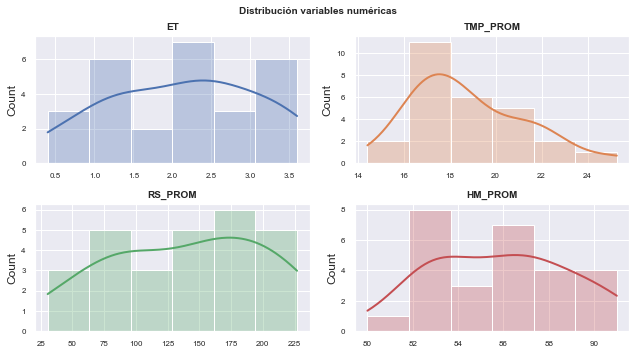

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1321
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


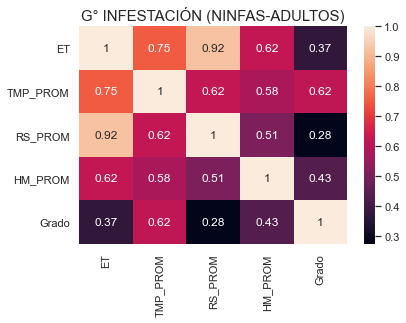

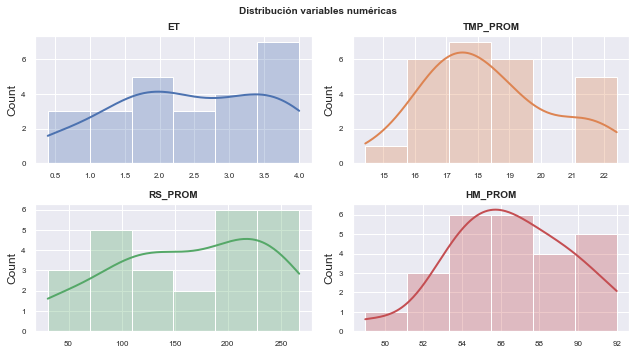

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1305
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


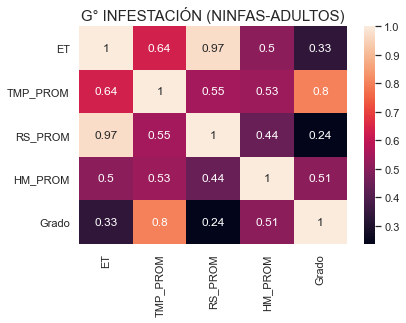

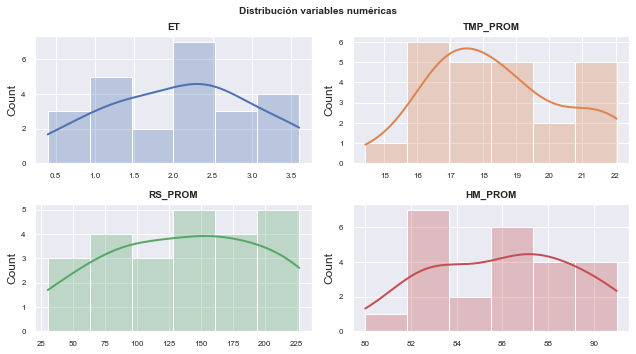

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1308
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


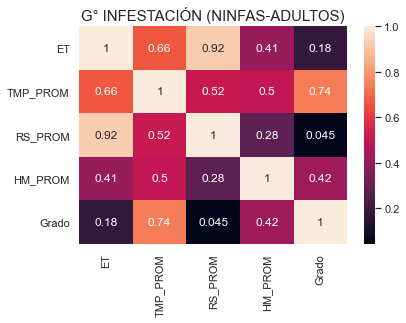

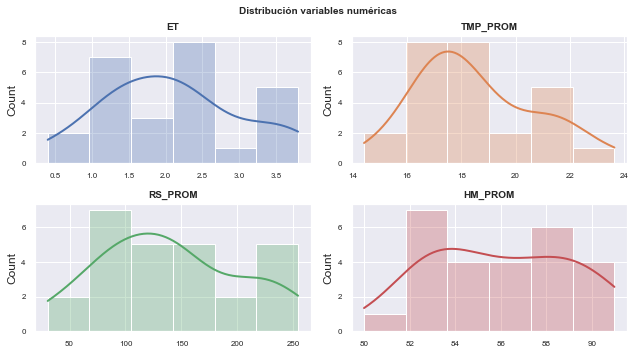

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1316
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


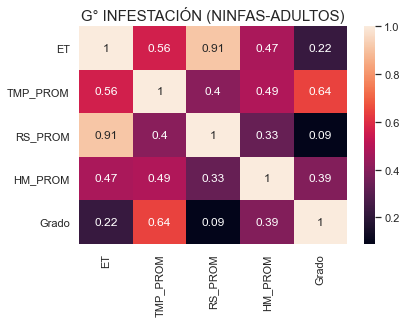

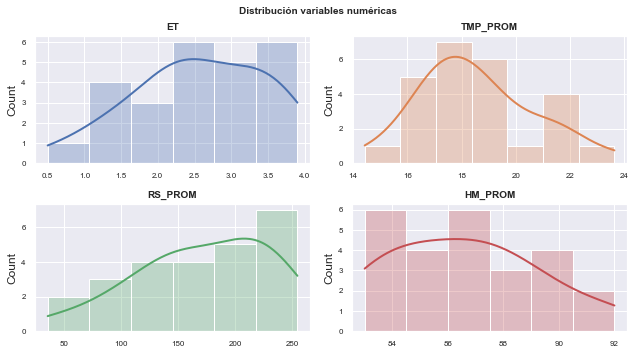

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1319
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


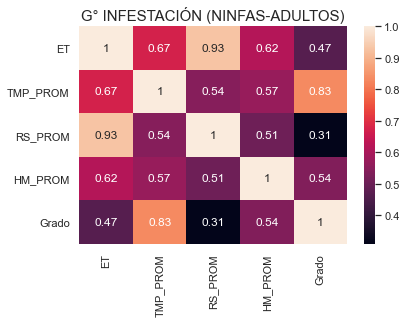

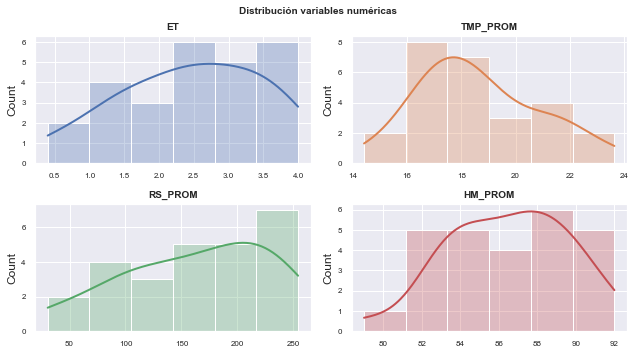

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1306
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


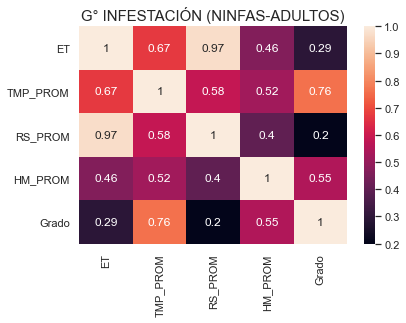

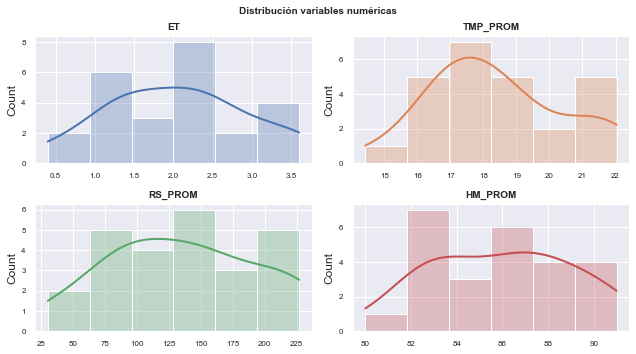

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1314
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


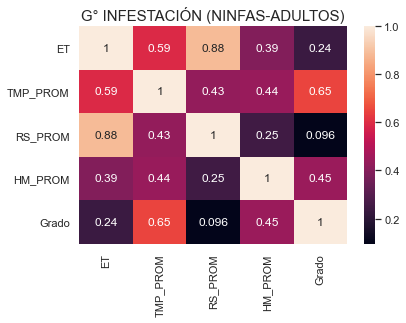

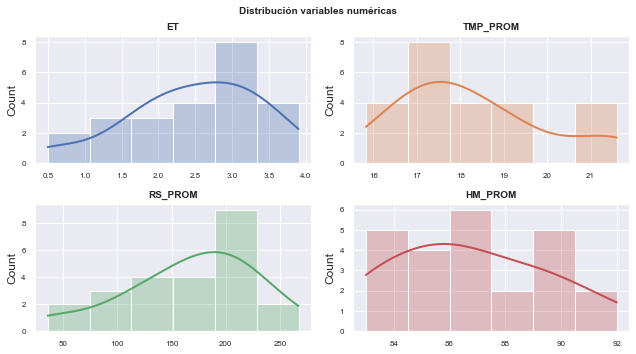

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1311
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


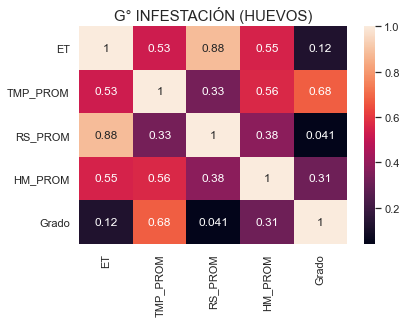

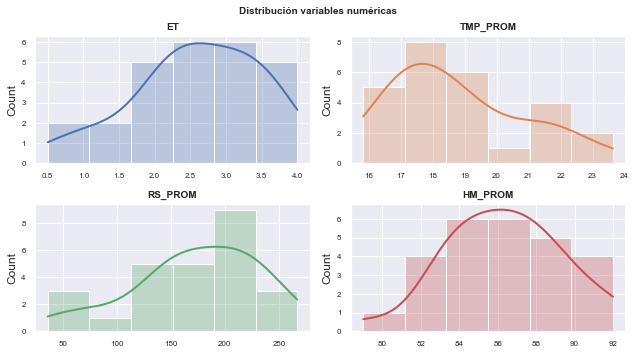

------------------------------------------------------------
Lugar: Filtrado 13 - Turno F13 - Lote 1311
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


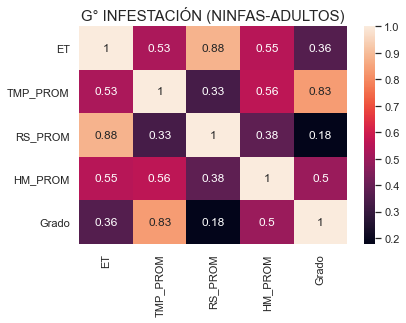

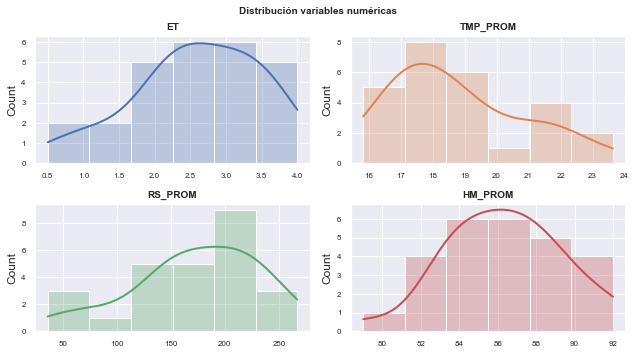

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2926
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


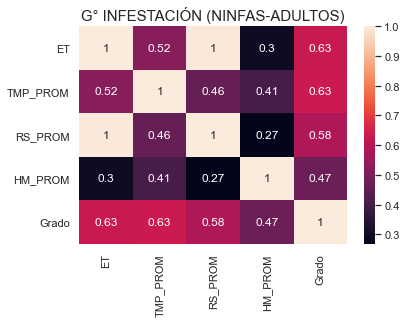

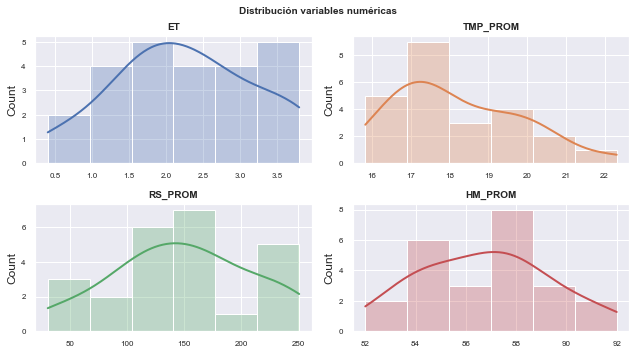

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2926
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


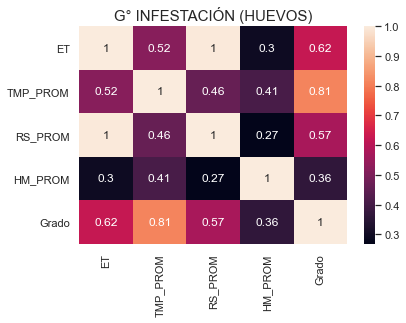

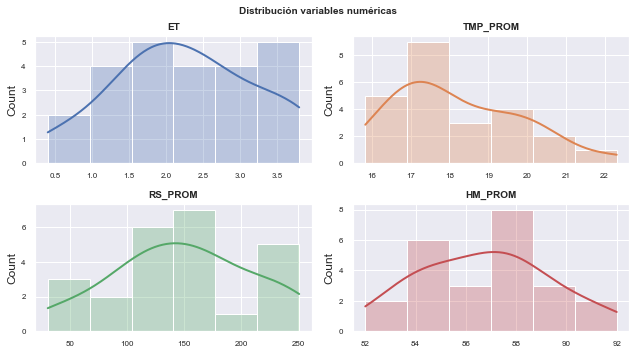

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2940
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


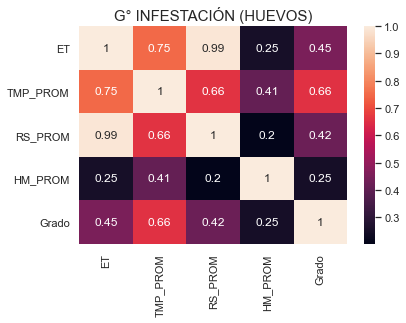

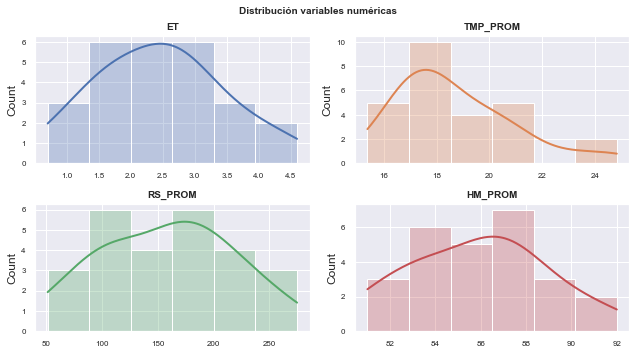

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2908
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


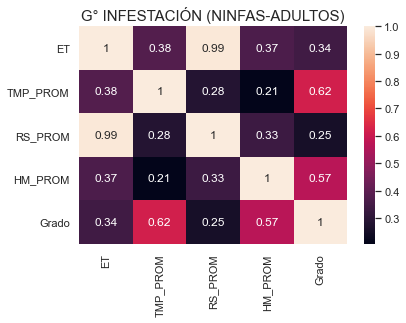

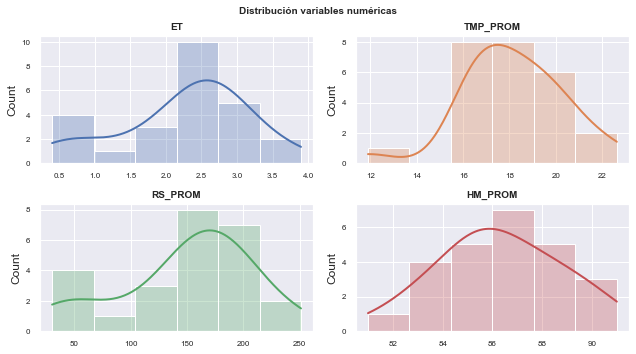

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2908
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


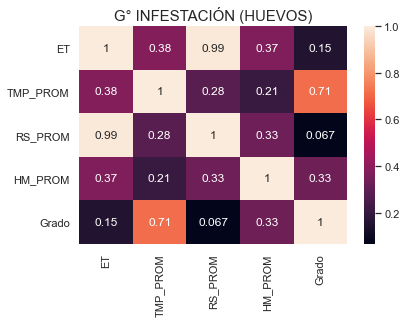

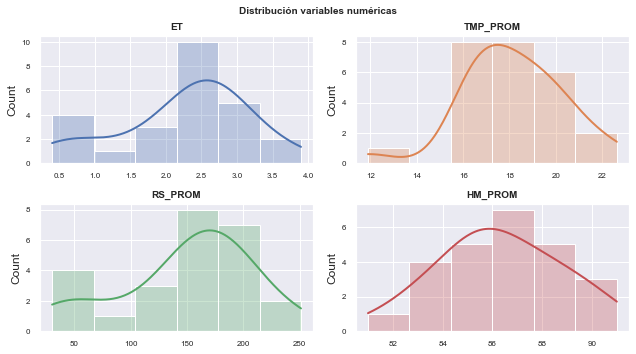

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2914
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


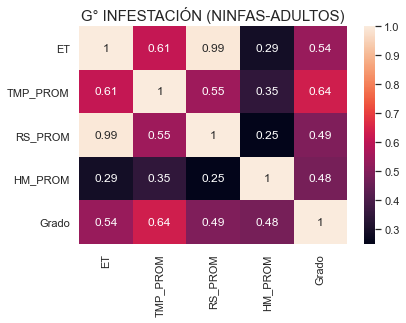

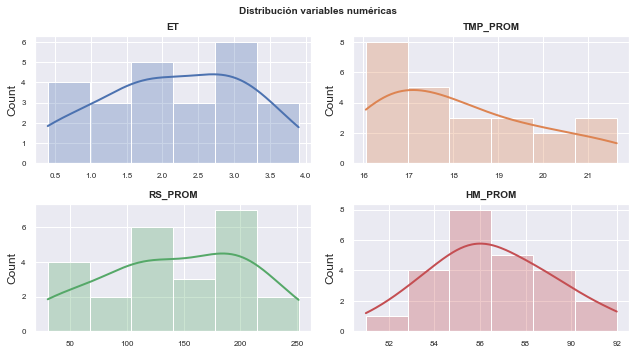

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2914
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


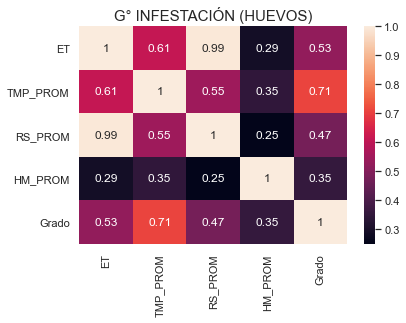

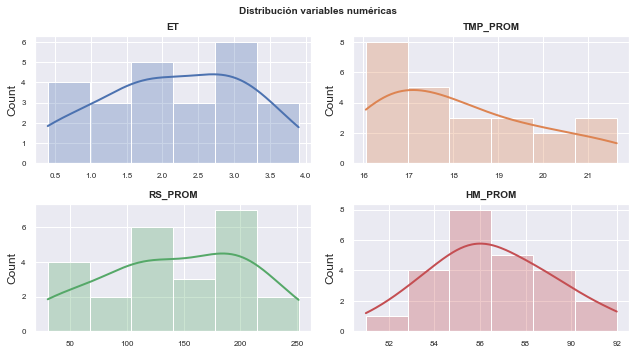

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2918
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


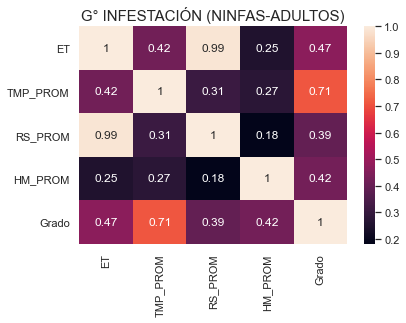

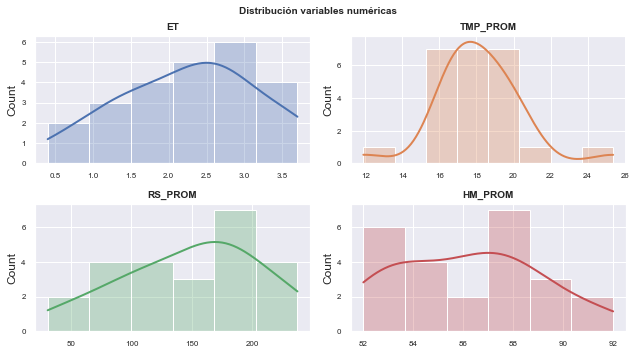

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2918
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


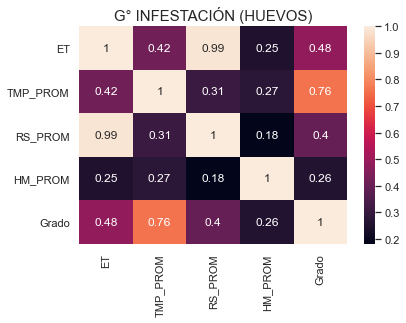

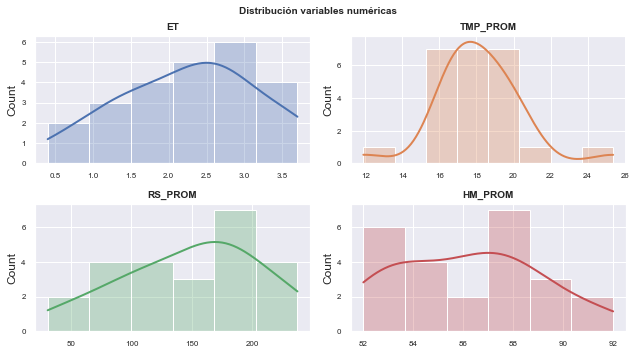

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2927
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


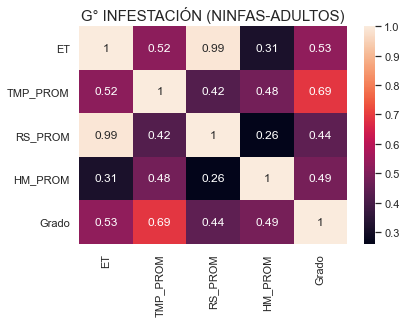

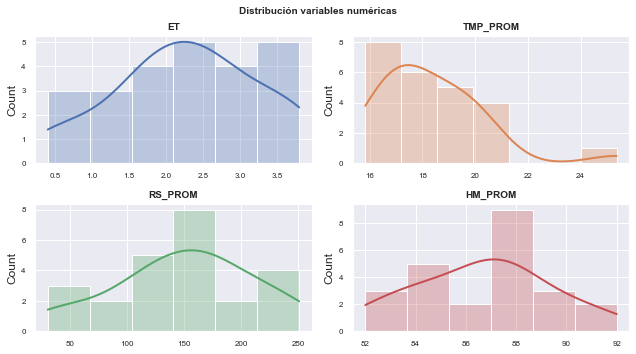

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2927
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


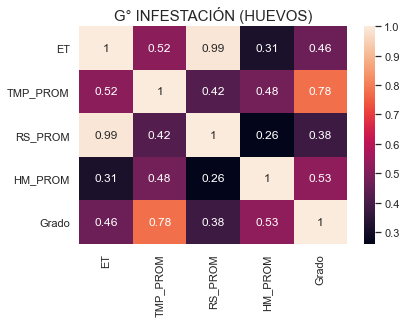

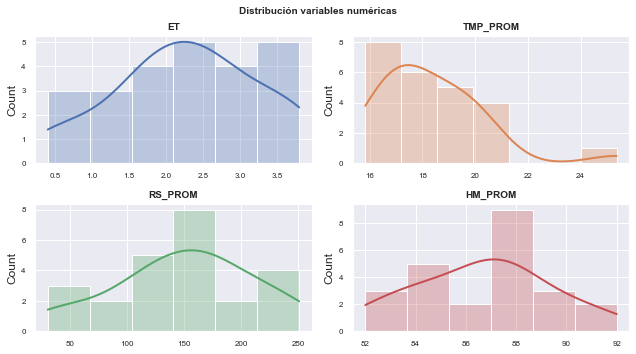

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2939
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


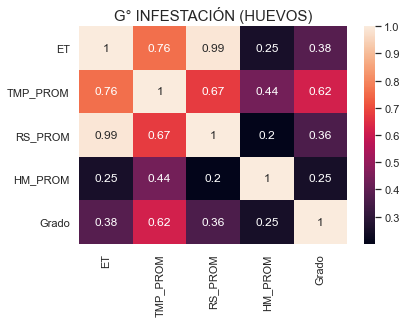

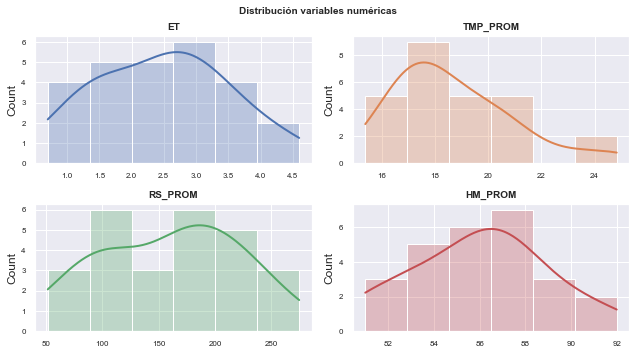

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2907
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


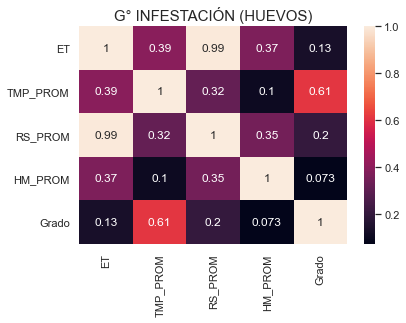

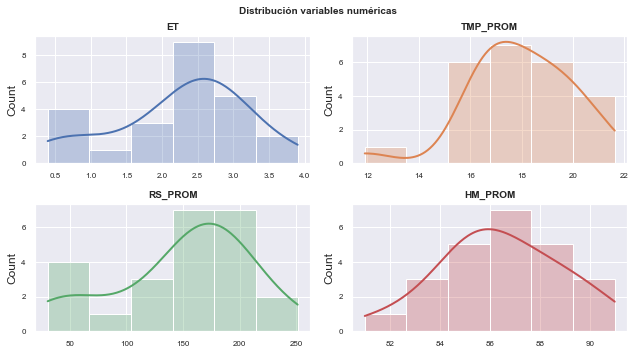

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2928
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


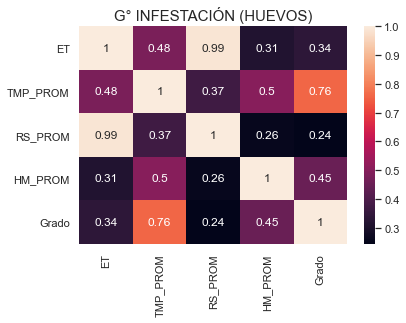

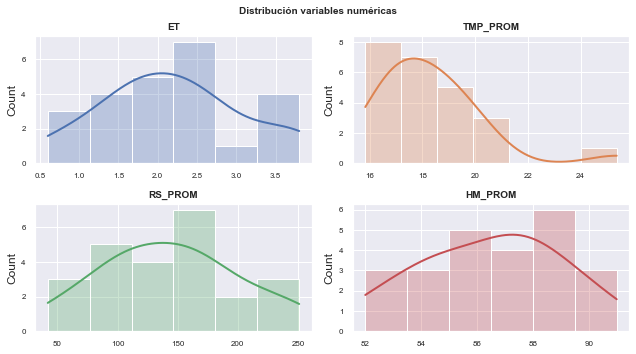

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2928
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


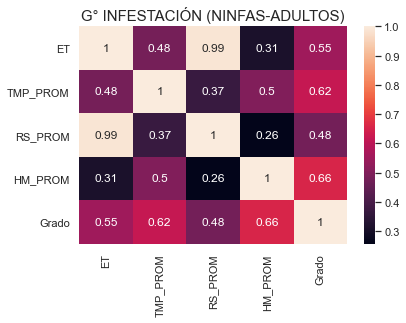

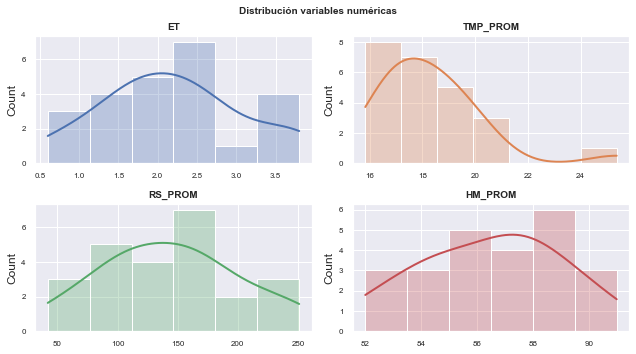

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2921
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


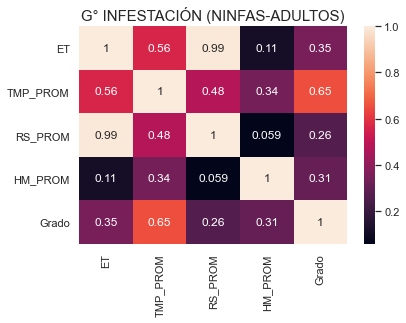

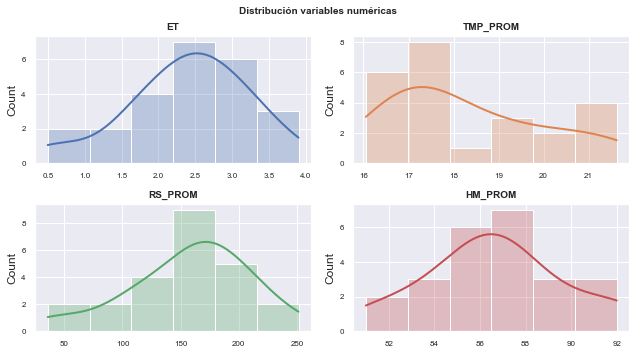

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2921
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


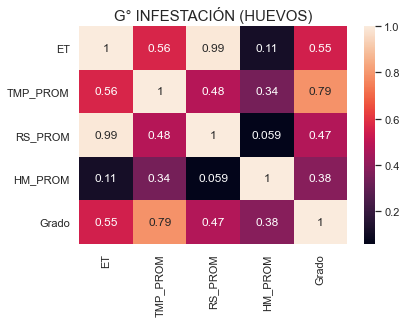

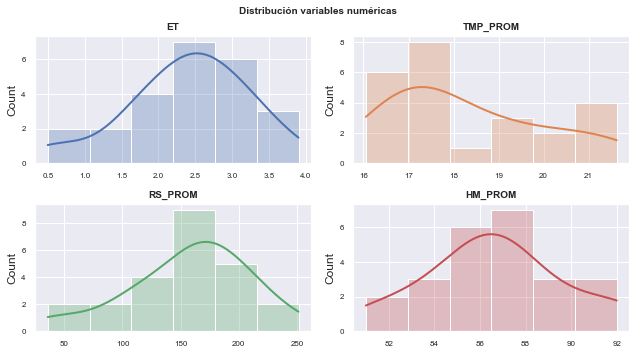

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2934
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


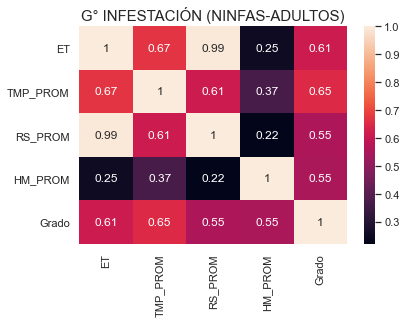

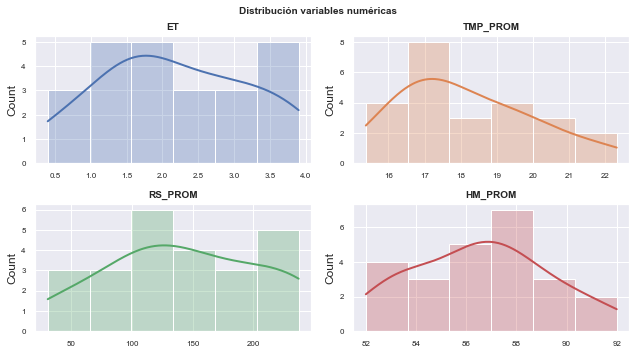

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2934
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


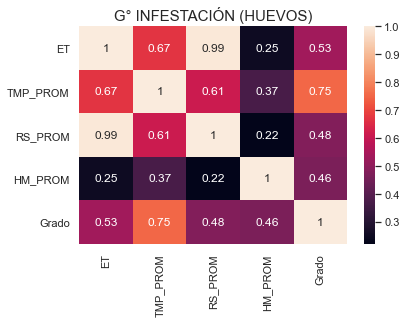

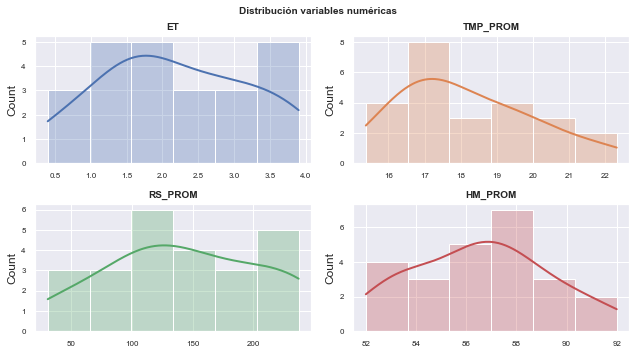

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2929
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


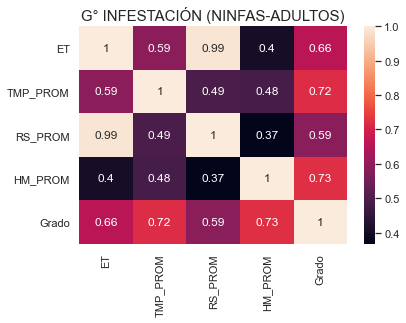

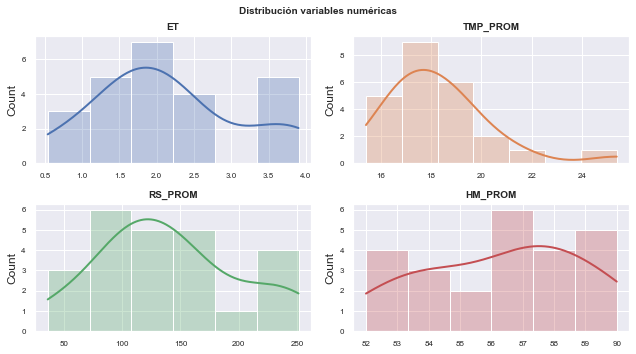

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2929
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


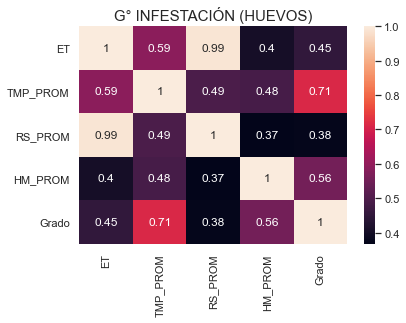

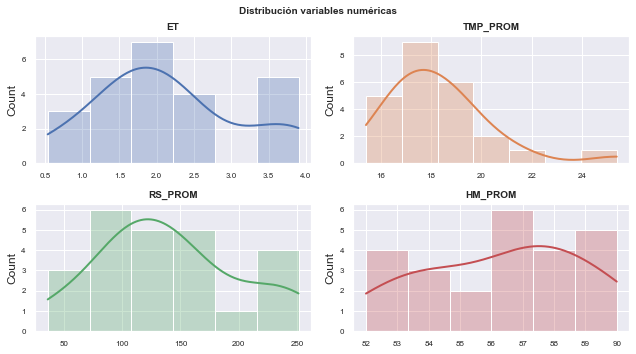

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2935
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


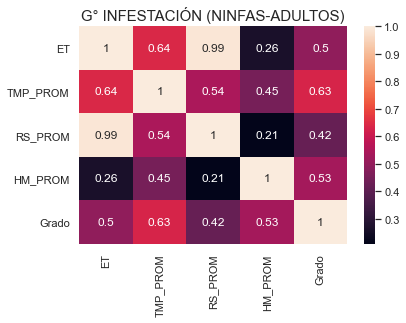

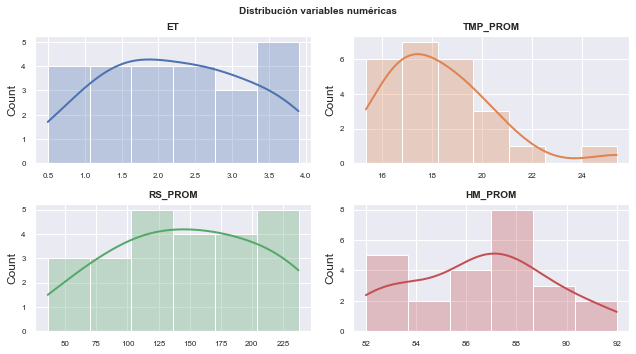

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2935
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


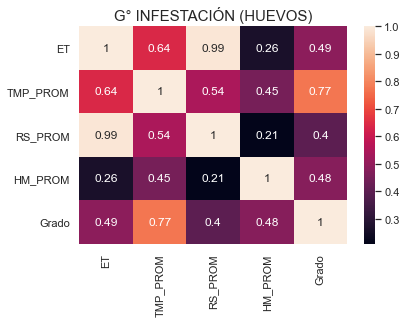

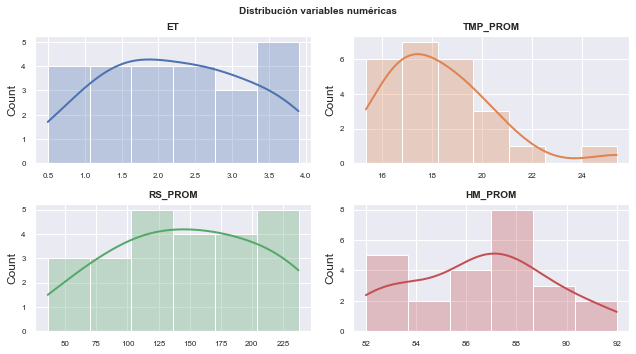

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2931
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


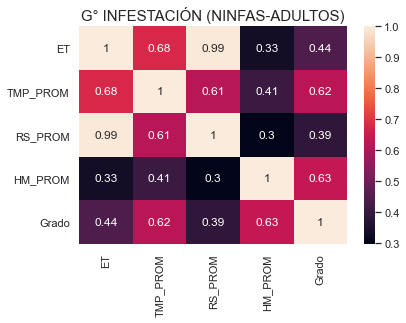

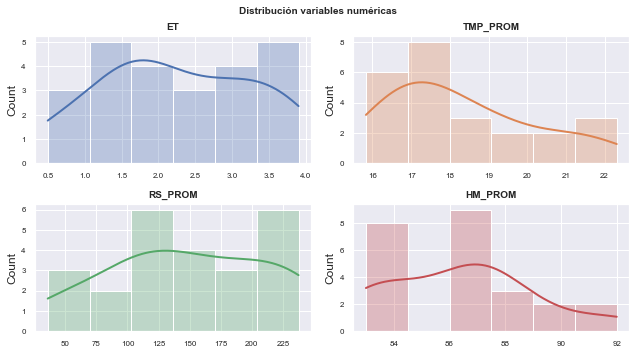

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2931
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


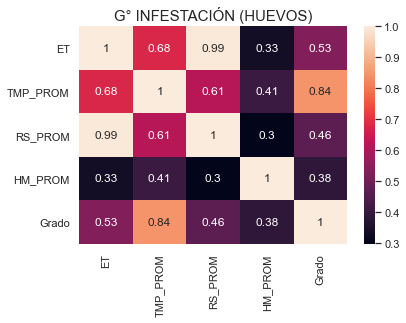

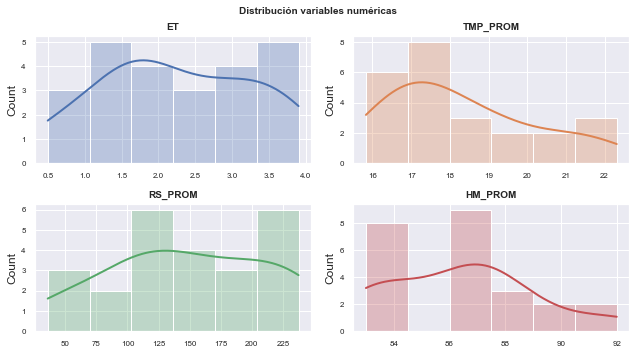

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2923
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


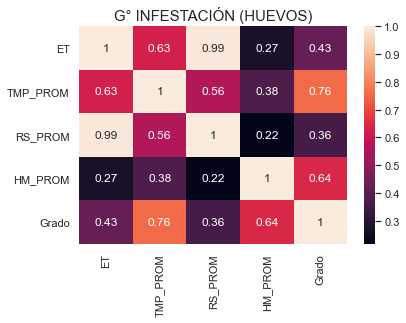

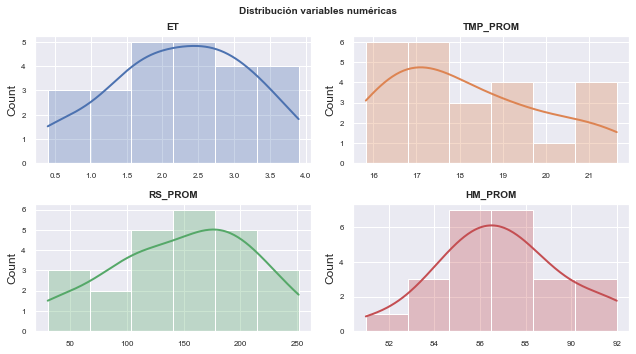

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2923
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


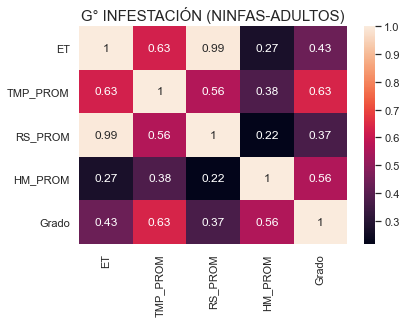

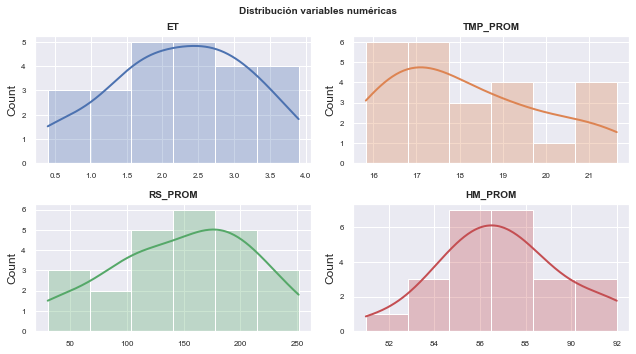

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2936
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


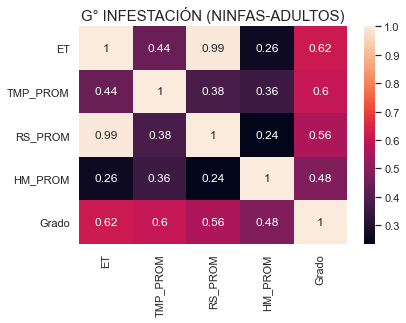

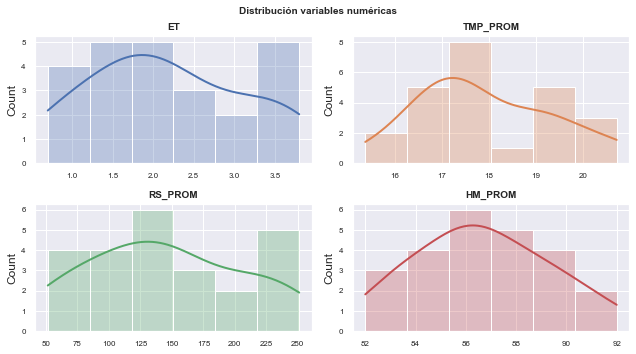

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2936
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


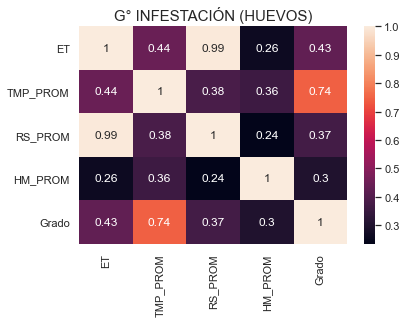

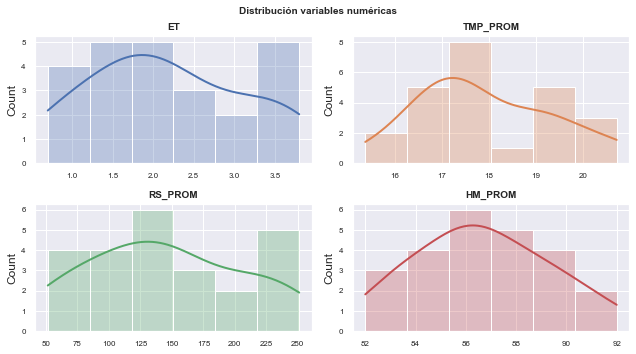

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2910
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


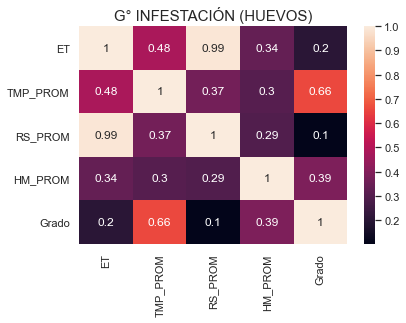

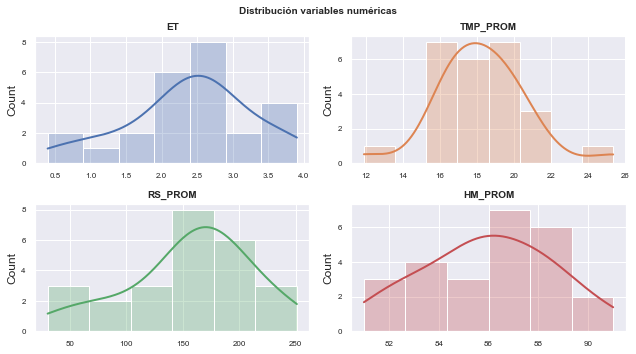

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2910
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


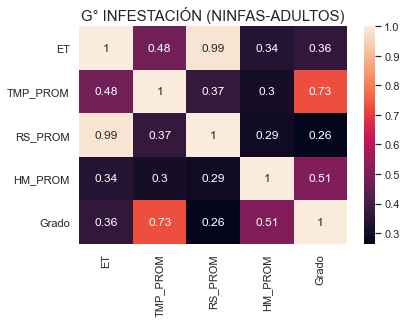

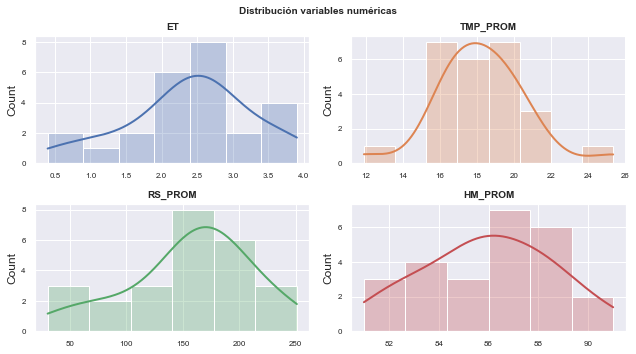

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2906
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


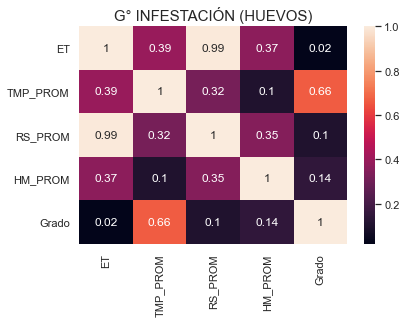

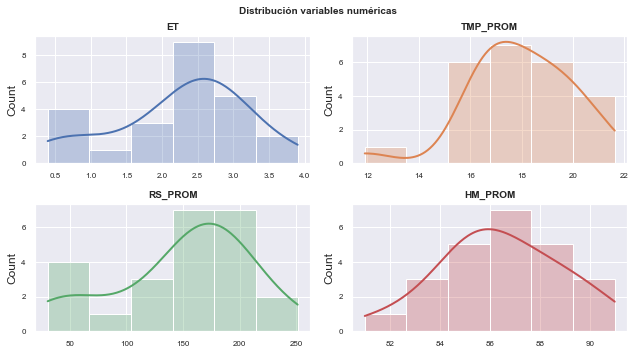

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2906
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


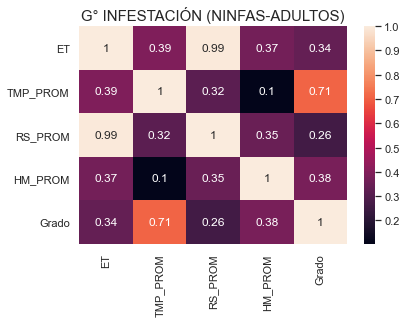

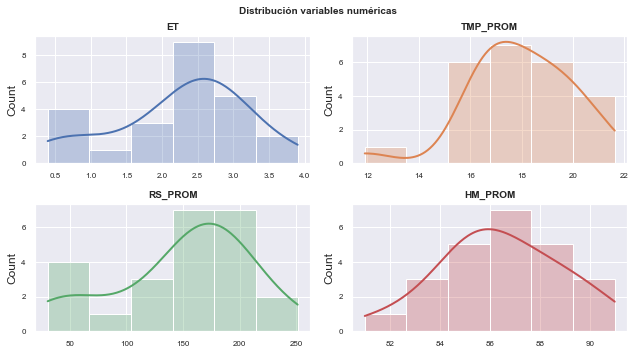

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2938
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


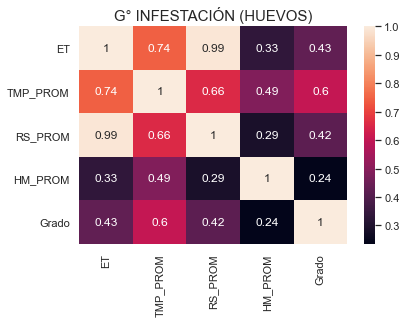

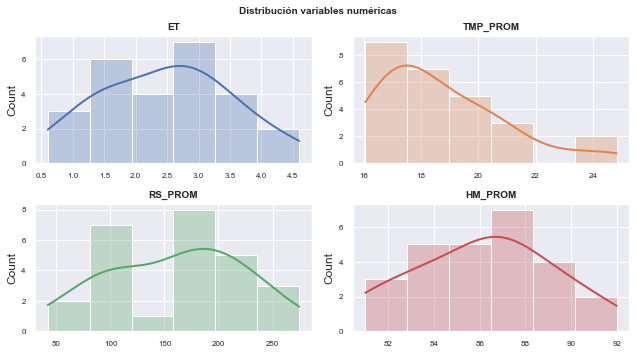

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2912
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


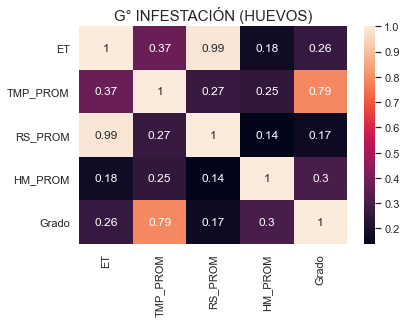

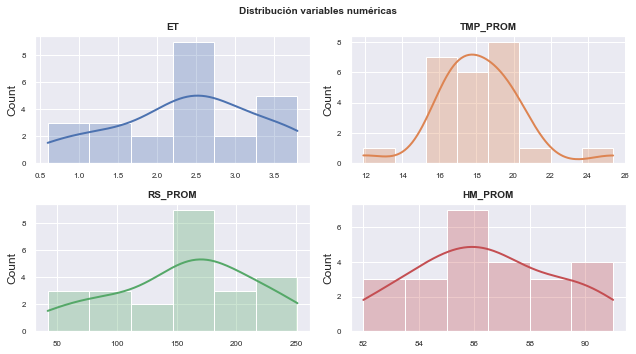

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2912
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


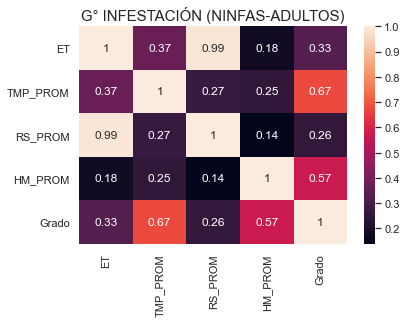

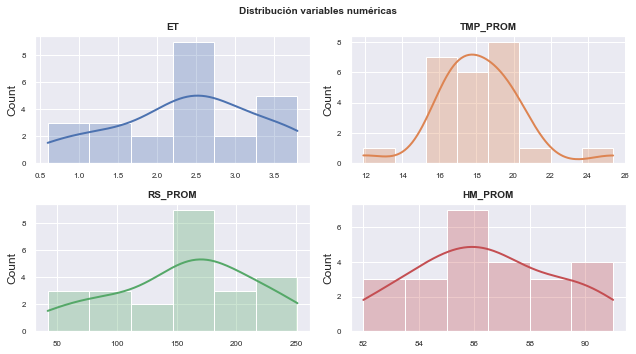

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2922
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


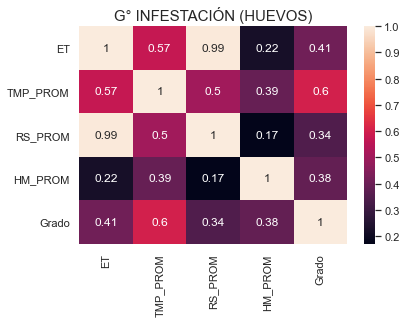

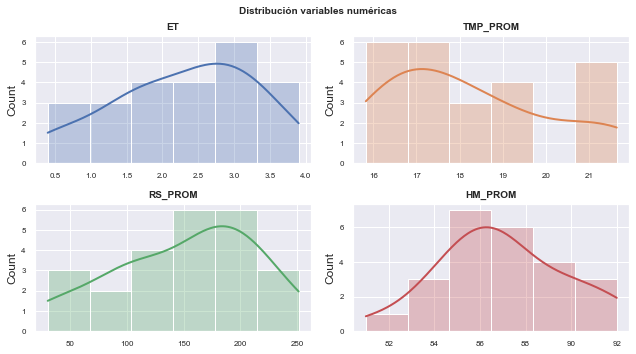

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2932
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


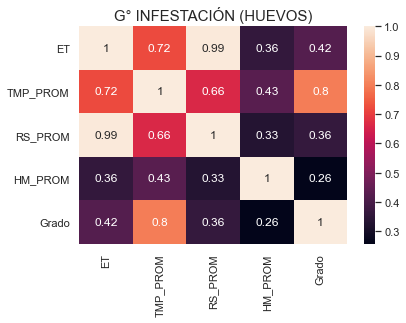

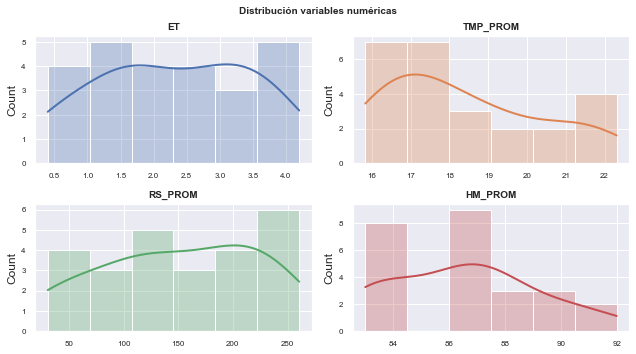

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2932
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


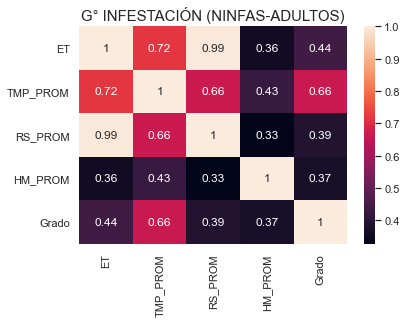

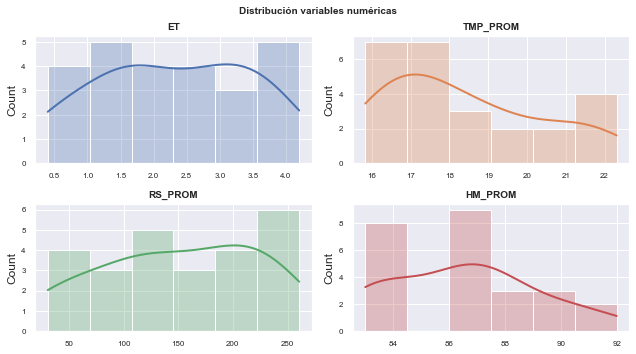

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2933
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


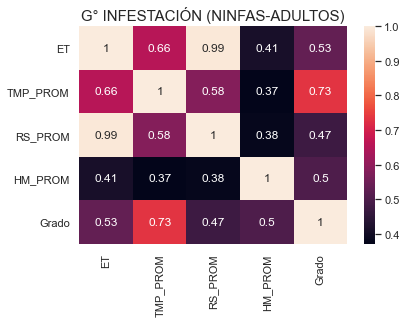

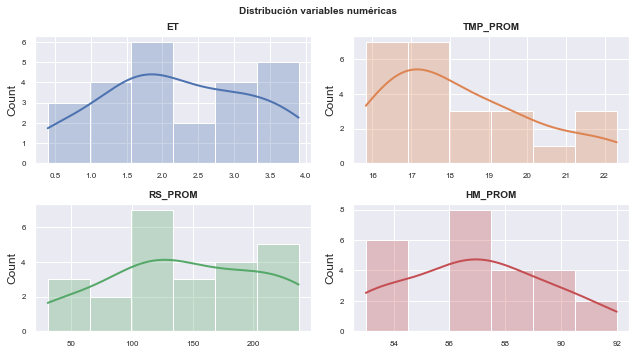

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2933
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


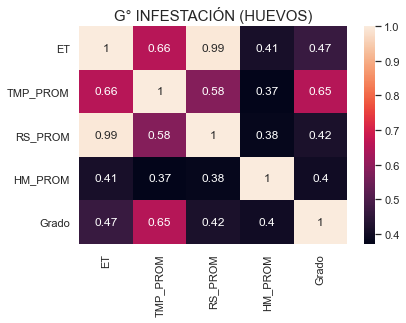

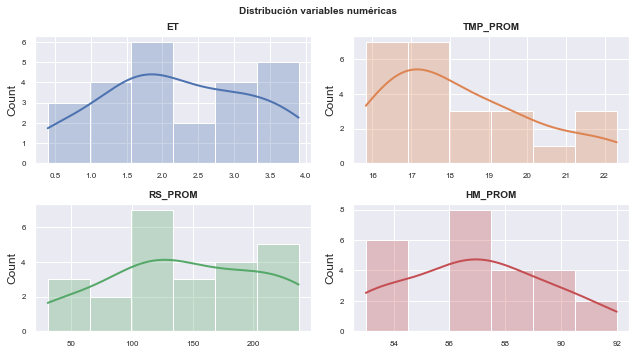

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2911
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


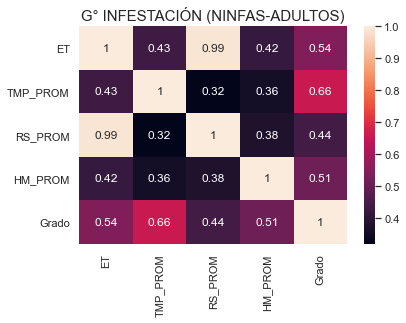

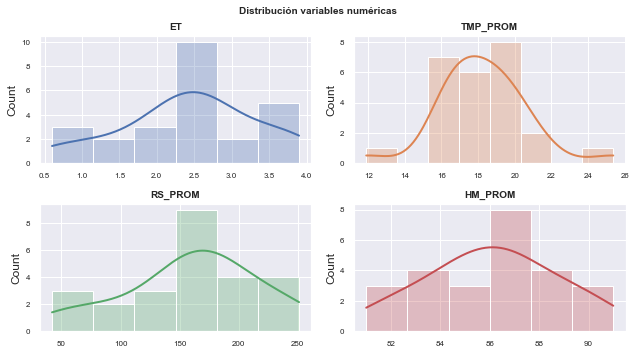

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2911
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


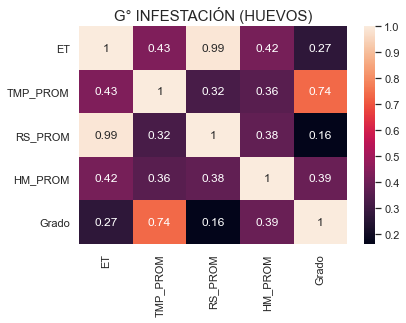

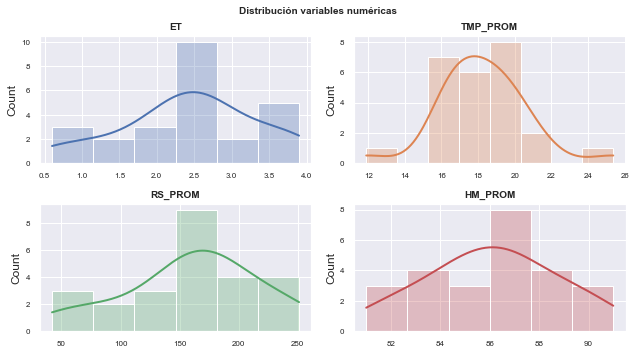

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2924
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


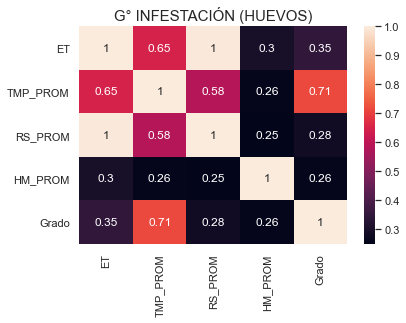

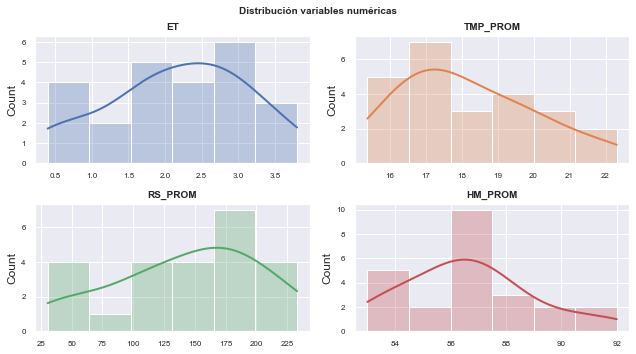

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2913
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


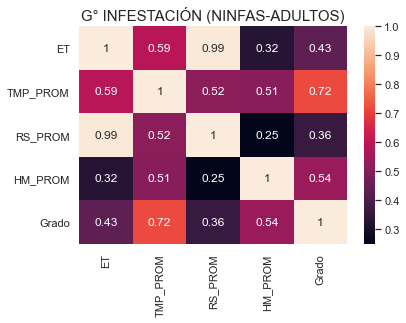

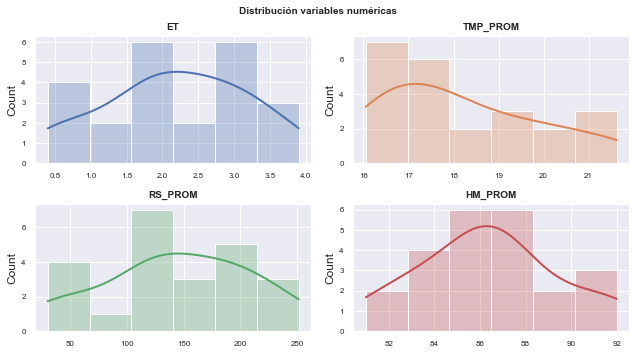

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2913
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


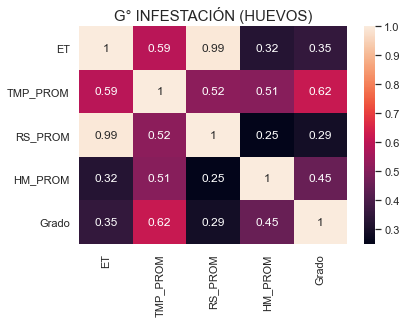

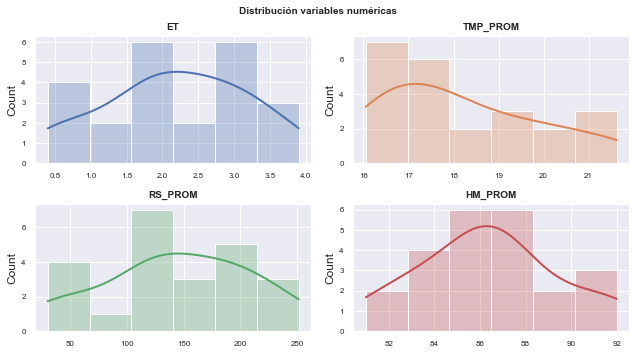

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2916
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


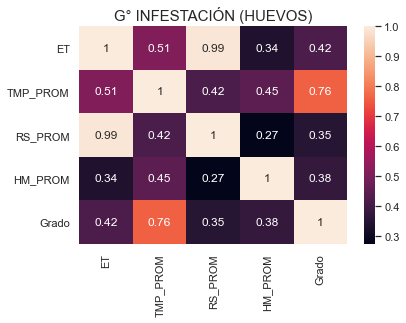

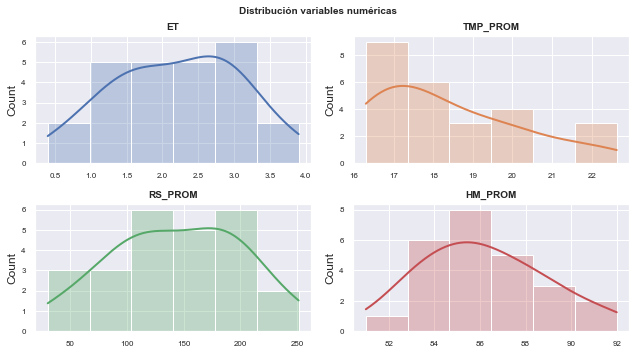

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2916
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


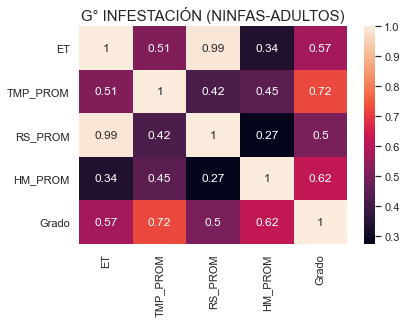

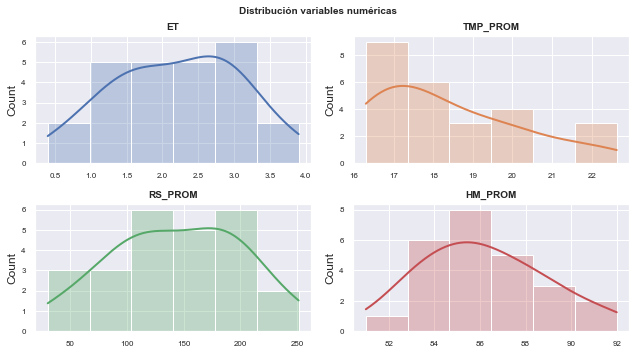

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2917
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


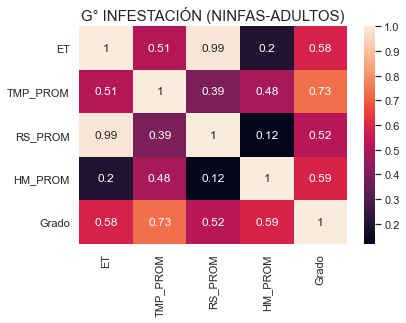

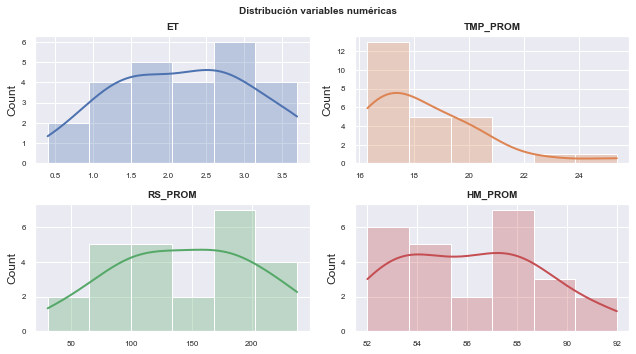

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2917
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


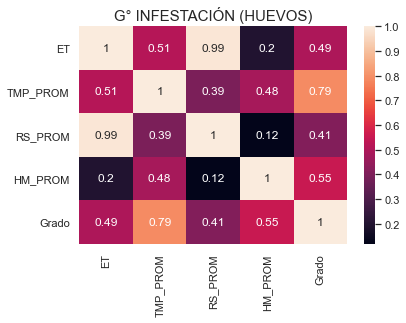

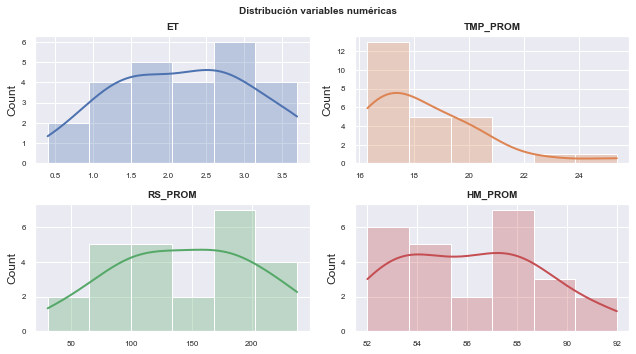

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2919
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


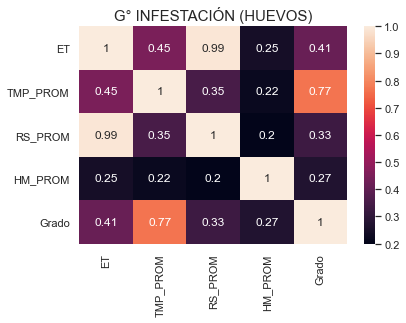

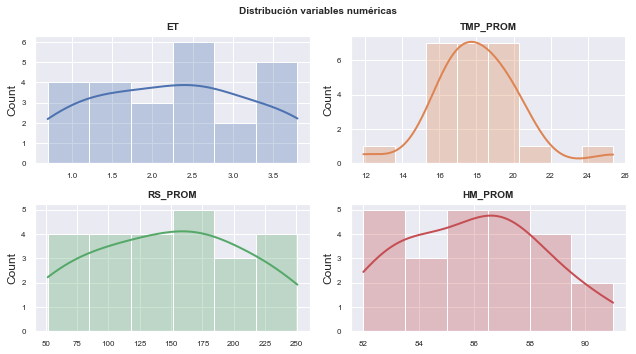

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2919
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


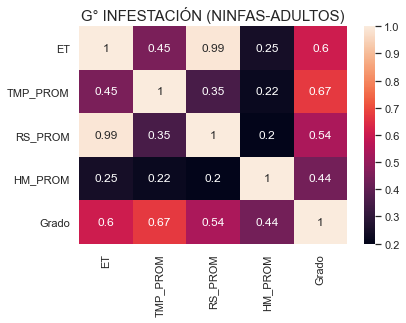

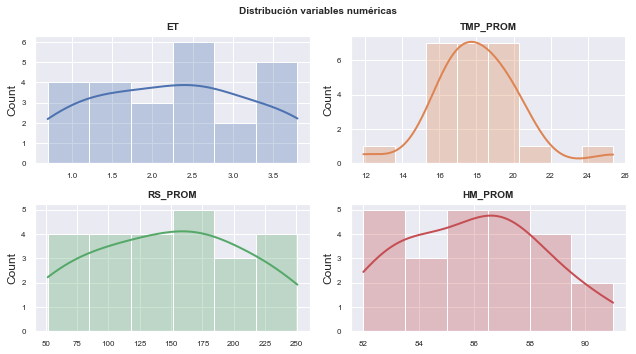

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2920
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


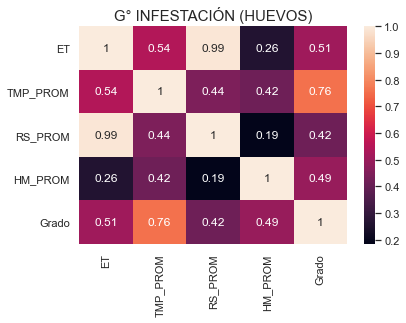

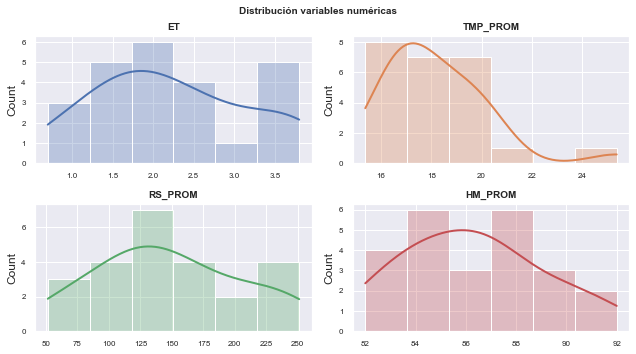

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2920
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


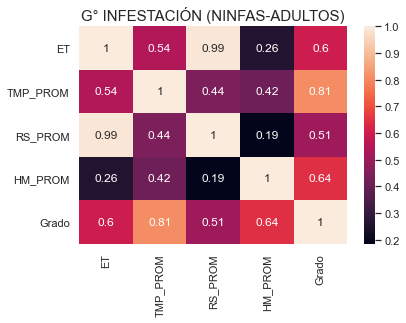

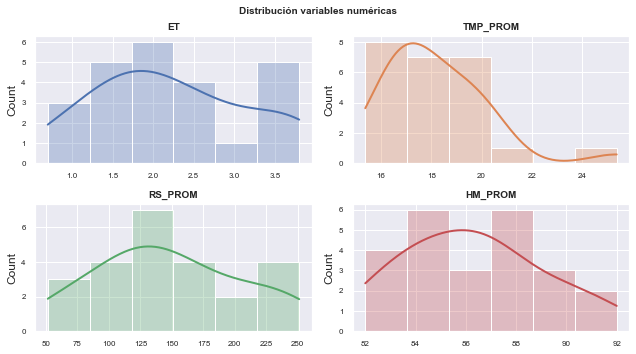

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2909
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


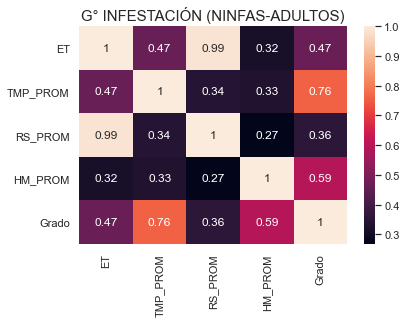

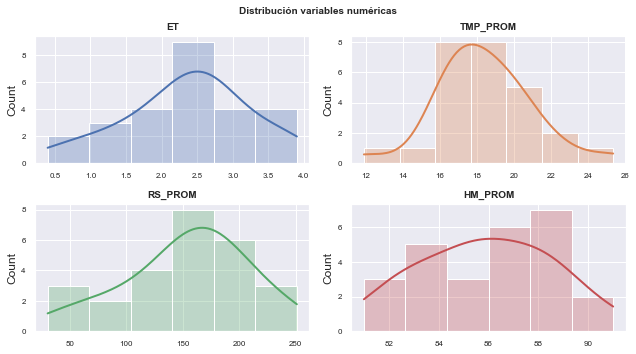

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2909
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


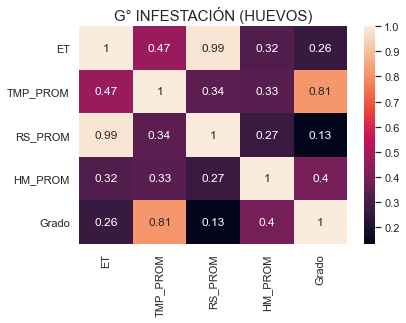

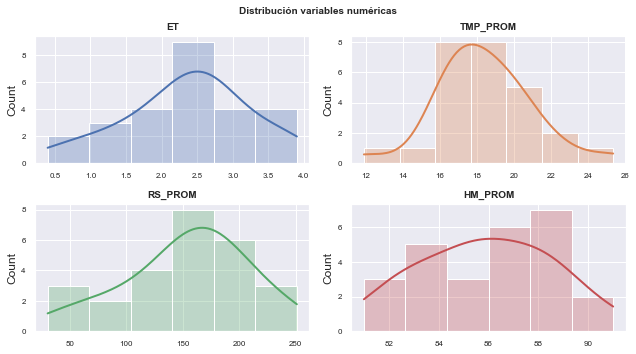

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2915
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


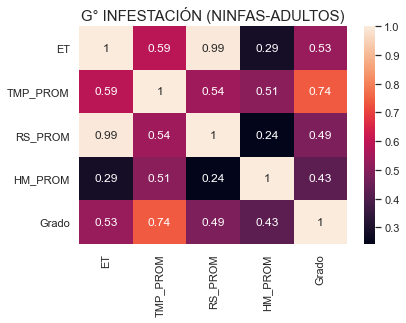

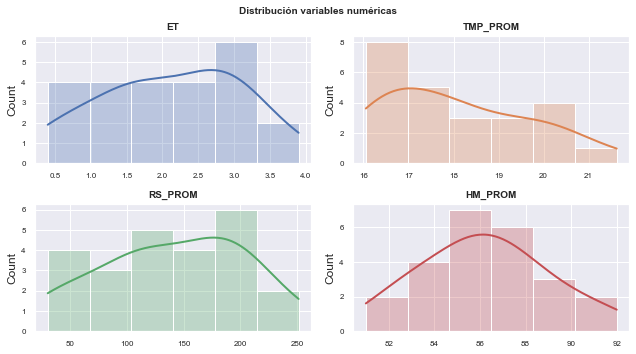

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2915
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


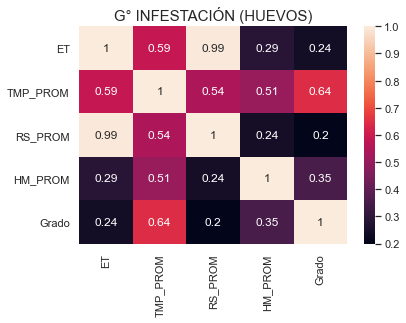

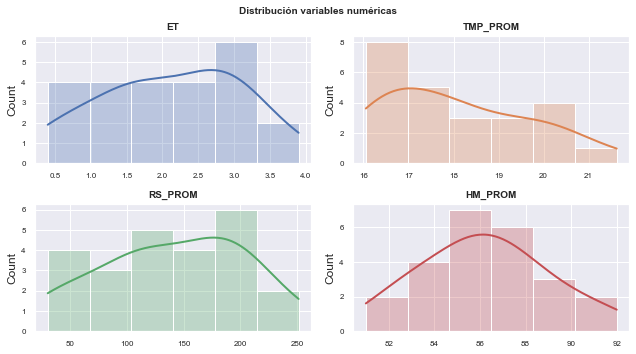

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2925
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


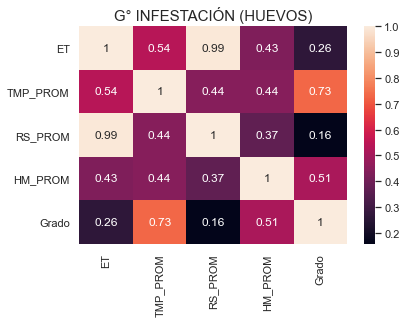

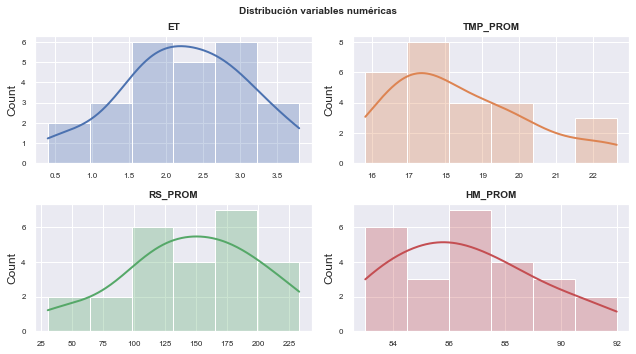

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2925
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


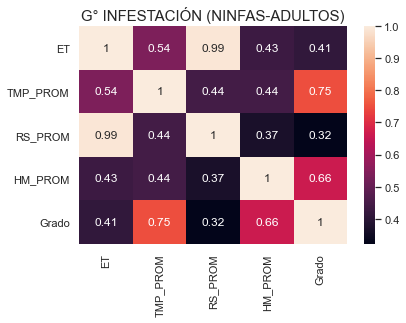

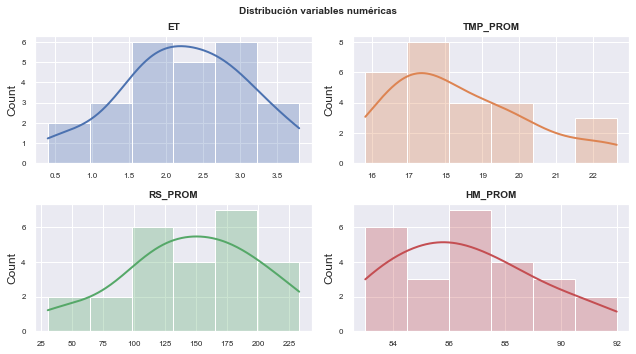

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2937
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


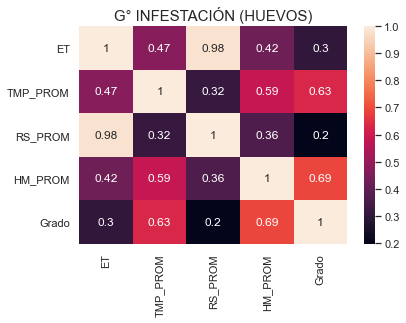

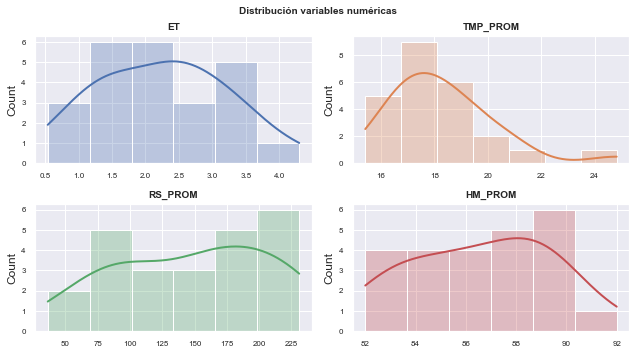

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2937
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


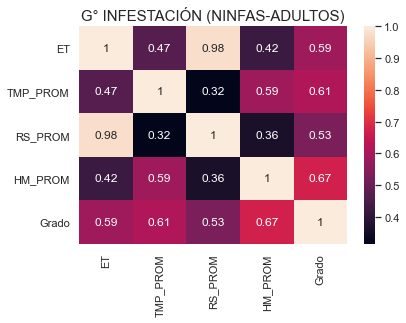

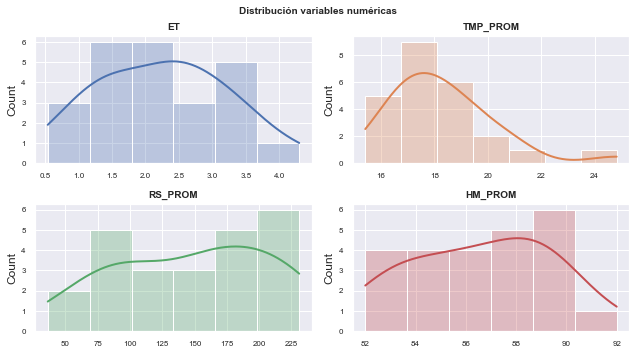

------------------------------------------------------------
Lugar: Filtrado 29 - Turno F29 - Lote 2930
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


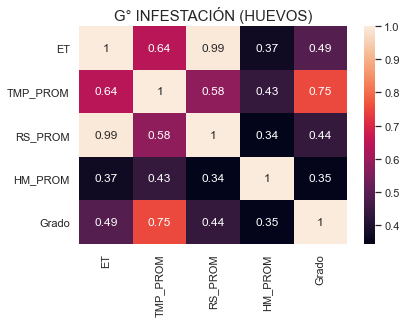

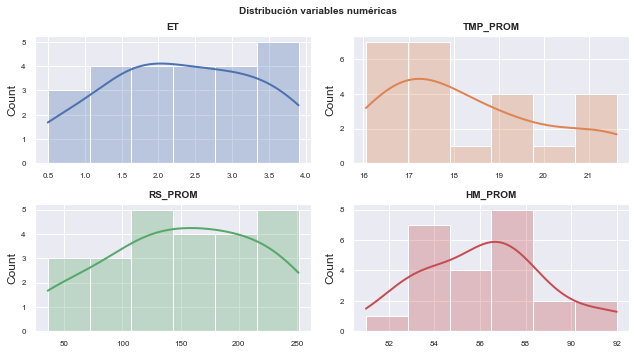

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


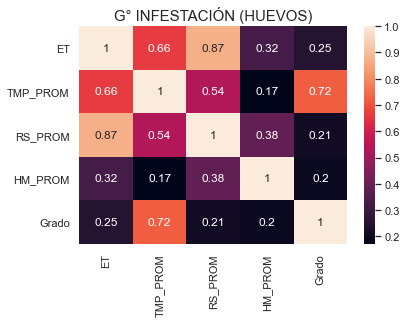

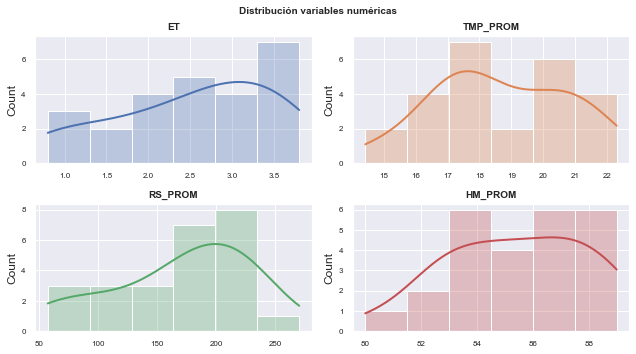

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


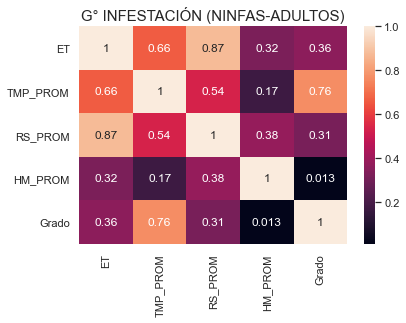

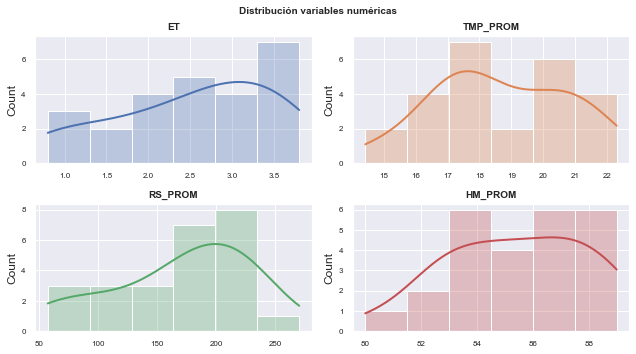

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3008
Plaga:  BEMISIA TABACI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


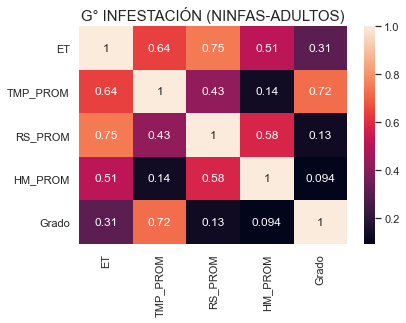

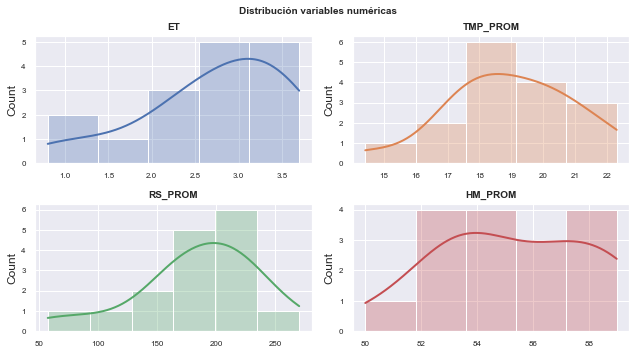

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


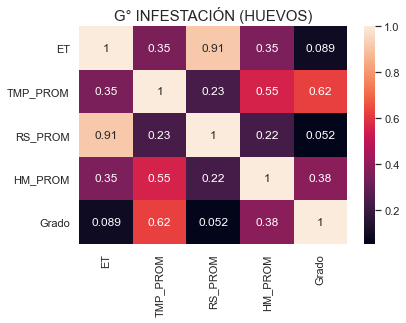

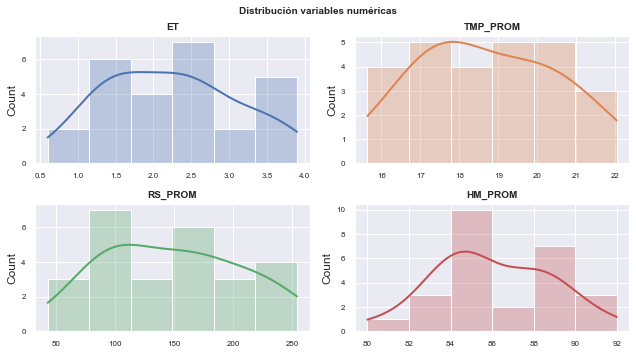

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


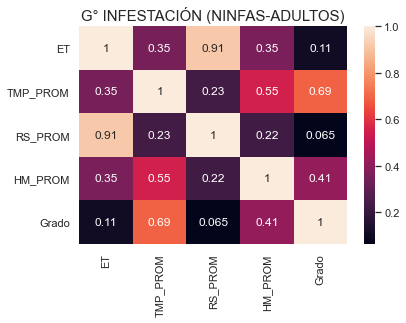

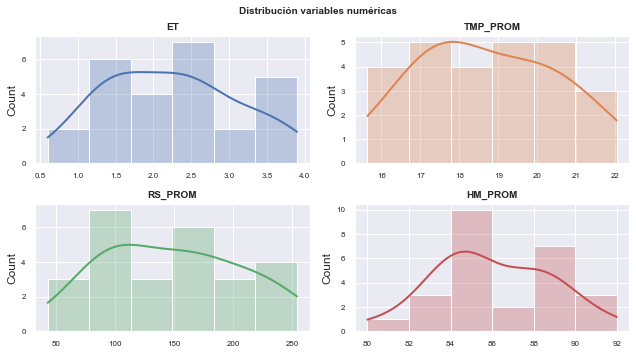

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


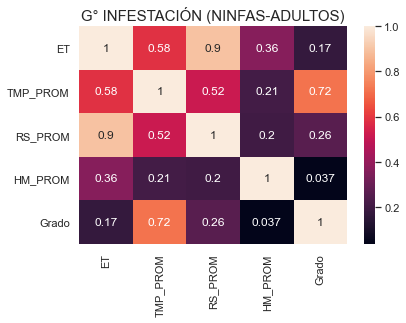

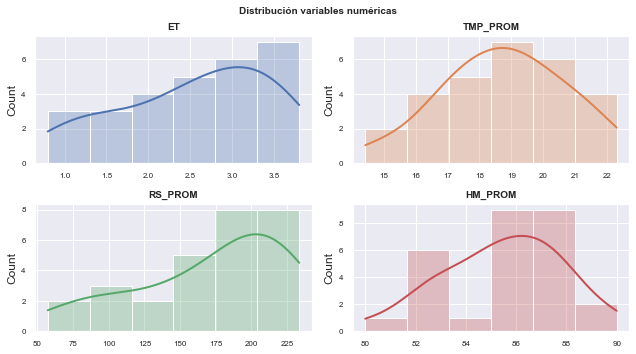

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


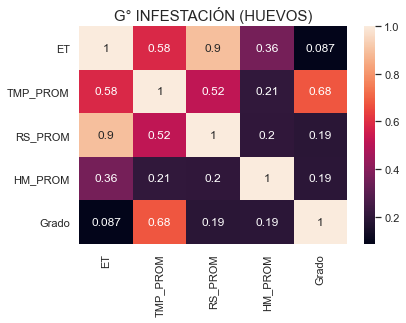

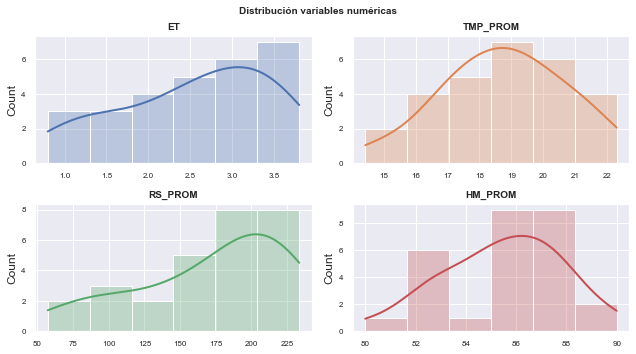

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3007
Plaga:  BEMISIA TABACI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


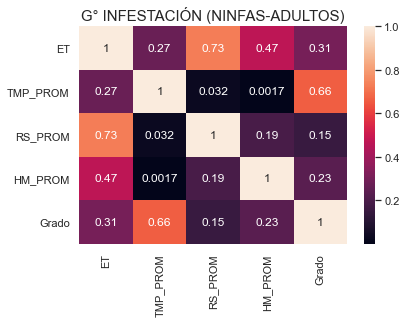

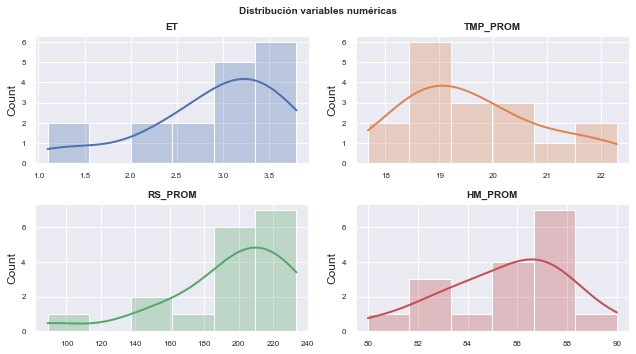

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


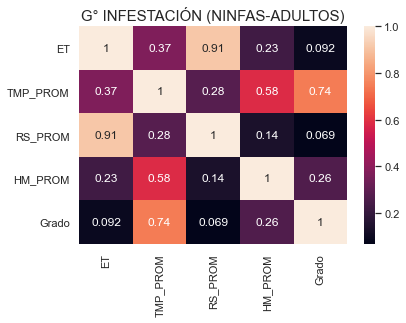

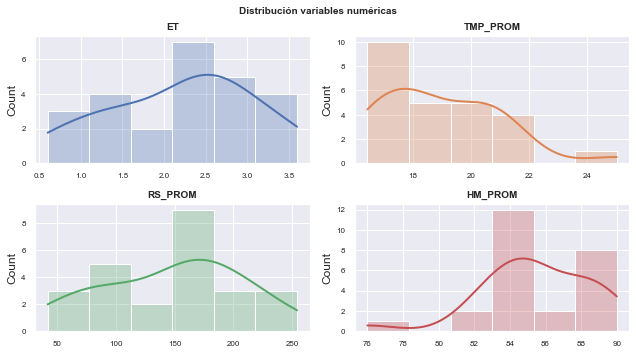

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


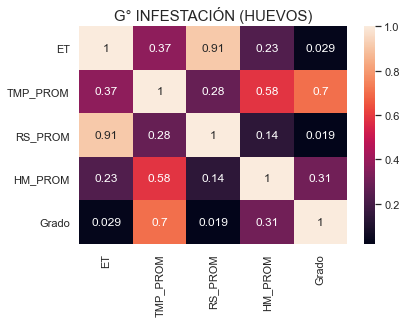

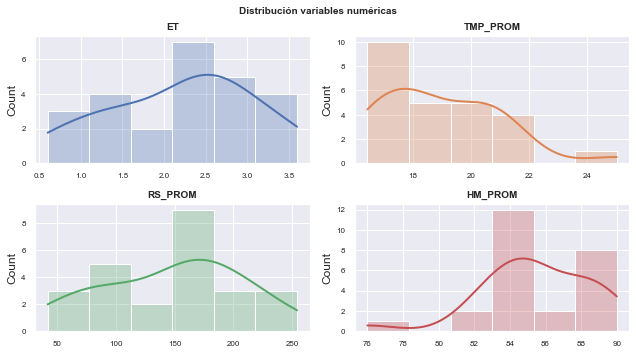

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3018
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


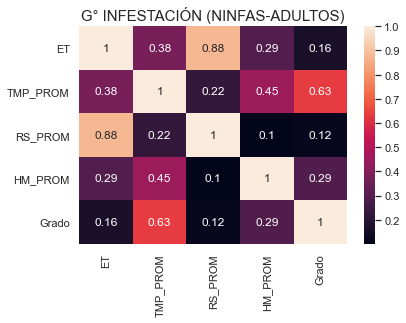

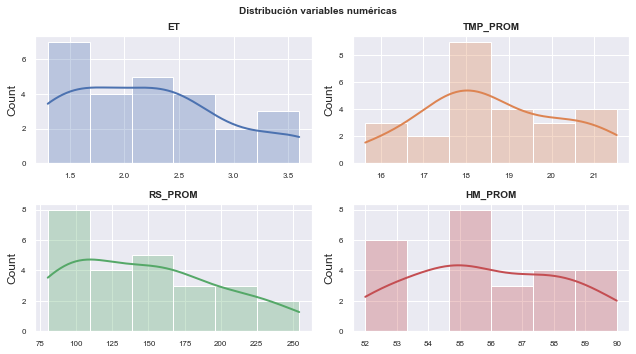

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3018
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


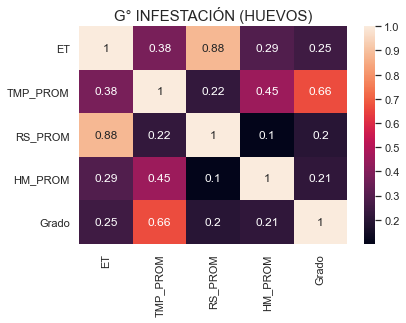

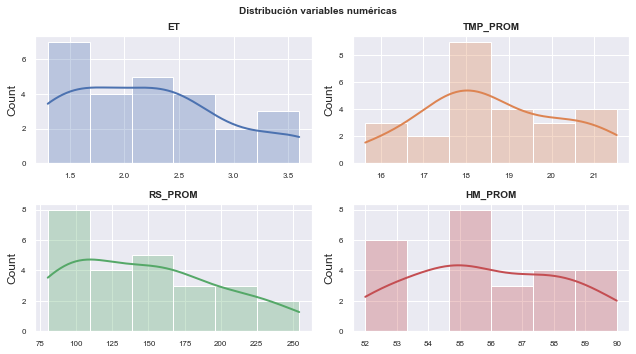

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3003
Plaga:  BEMISIA TABACI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


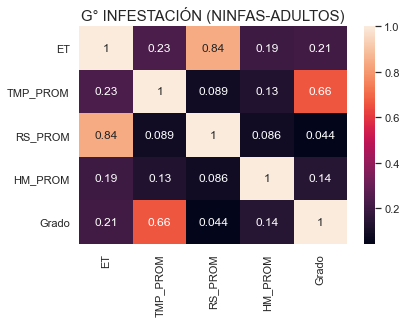

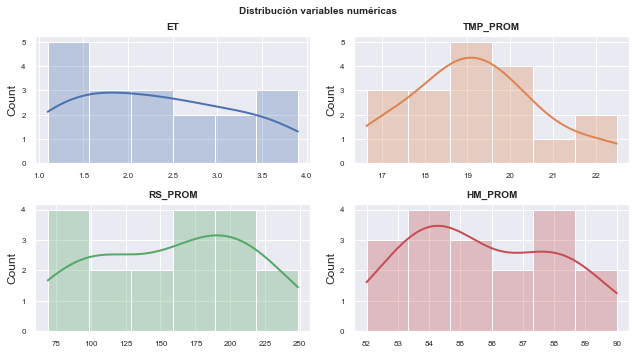

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3031
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


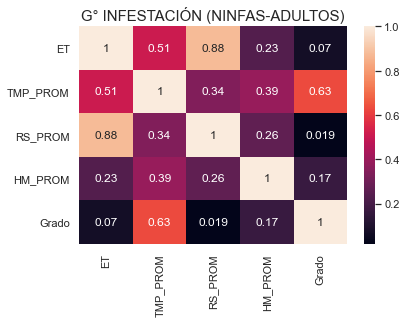

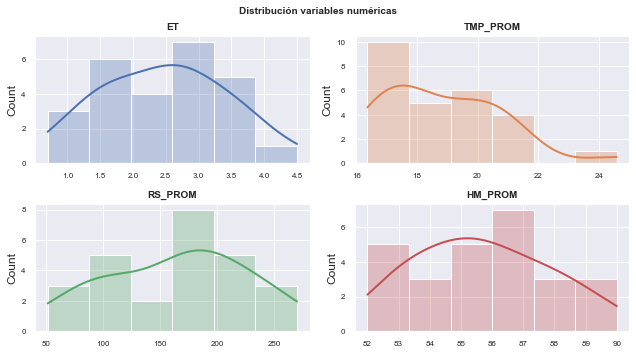

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3016
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


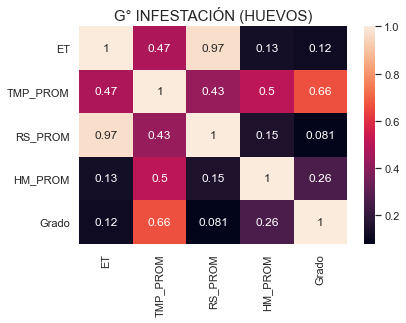

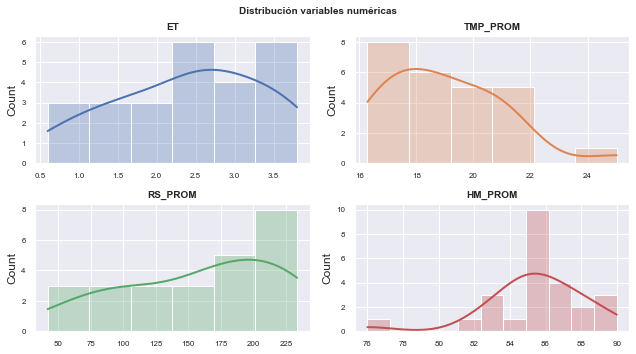

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3001
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


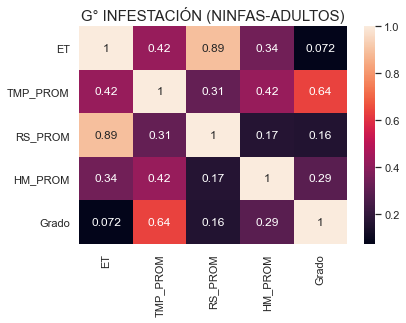

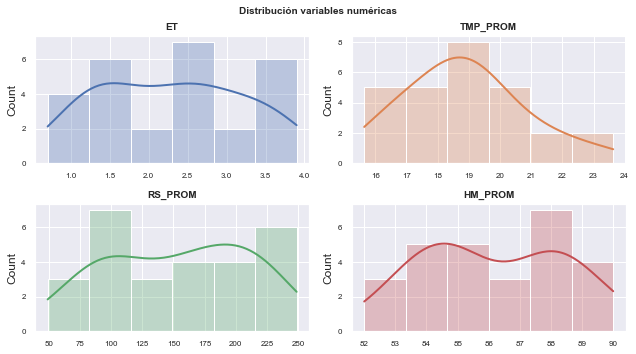

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3001
Plaga:  BEMISIA TABACI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


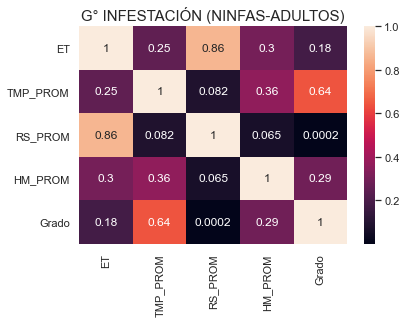

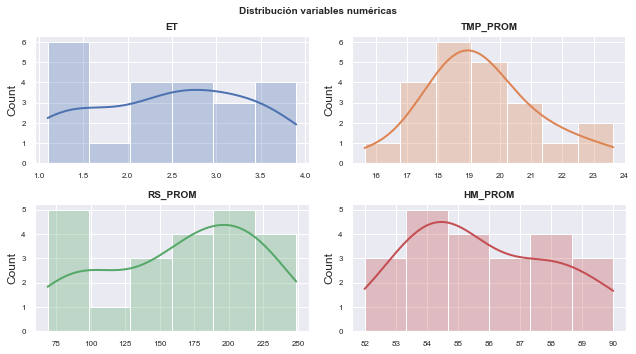

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3019
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


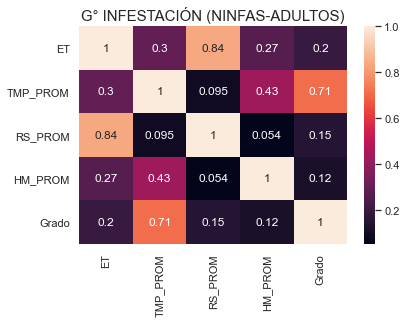

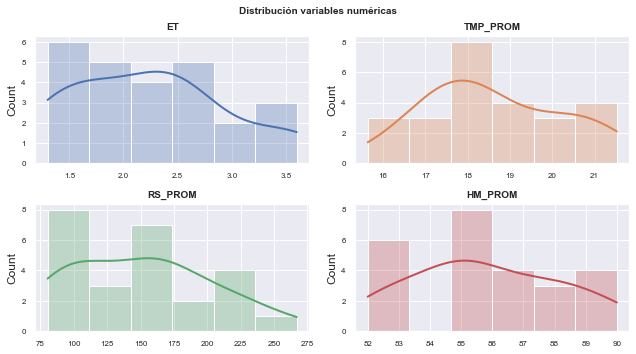

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3019
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


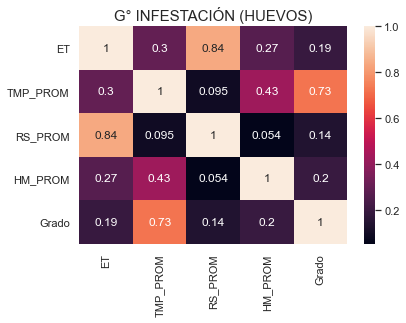

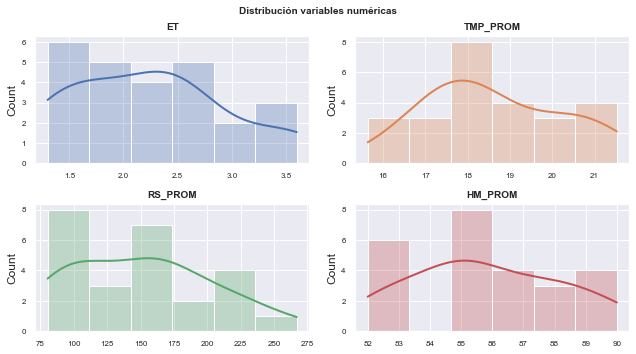

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3011
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


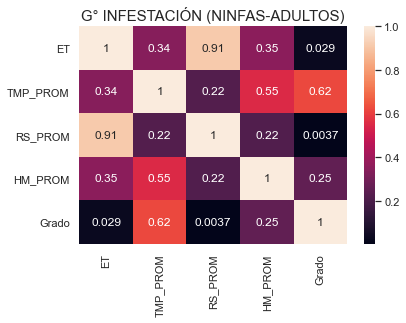

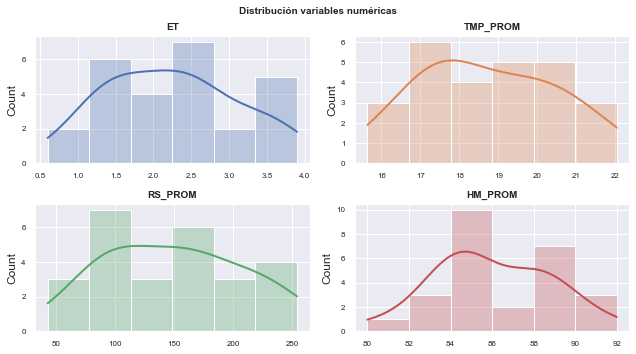

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3013
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


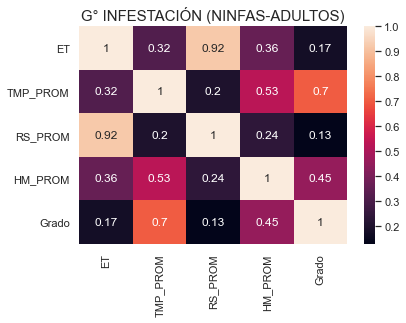

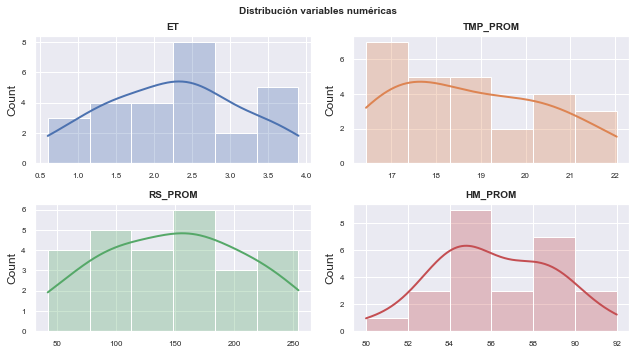

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3013
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


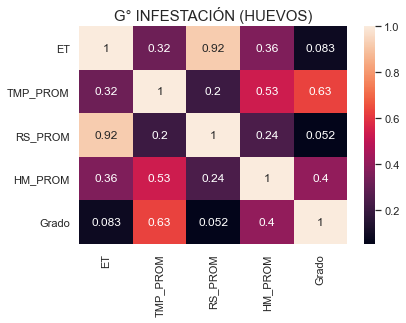

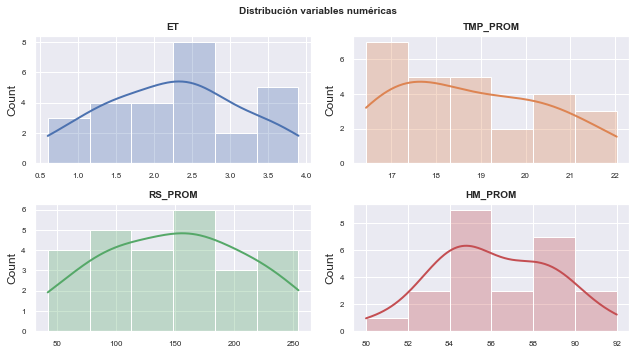

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


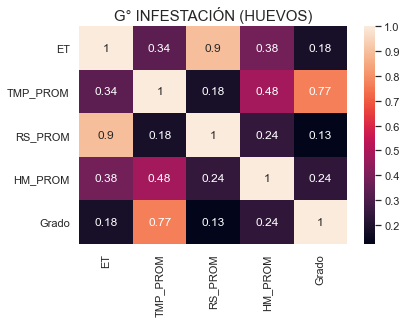

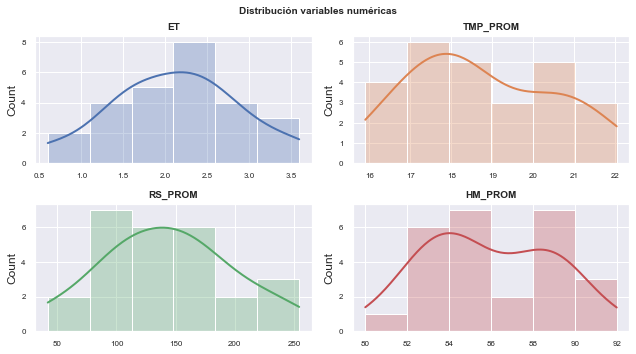

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


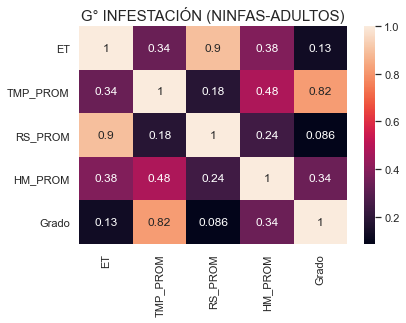

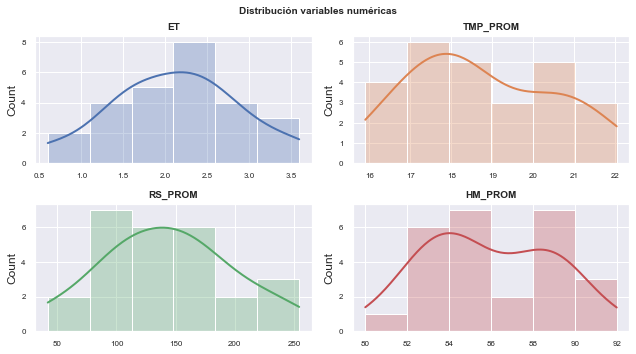

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3026
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


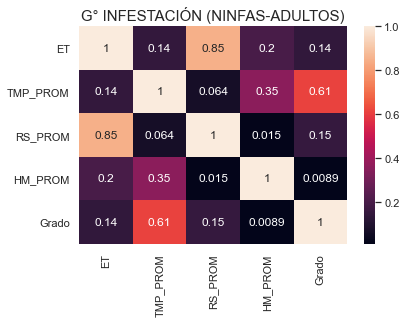

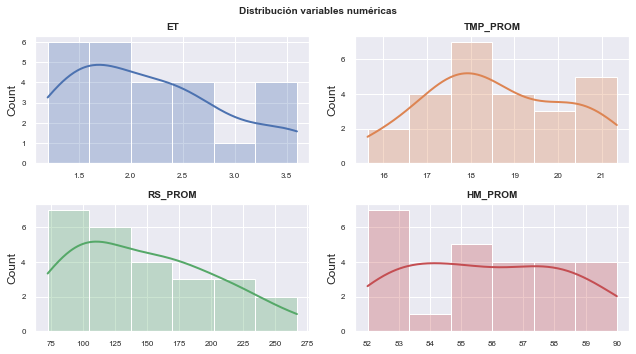

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3023
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


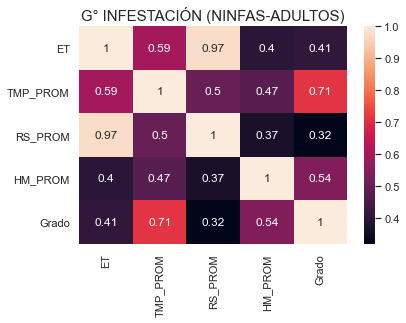

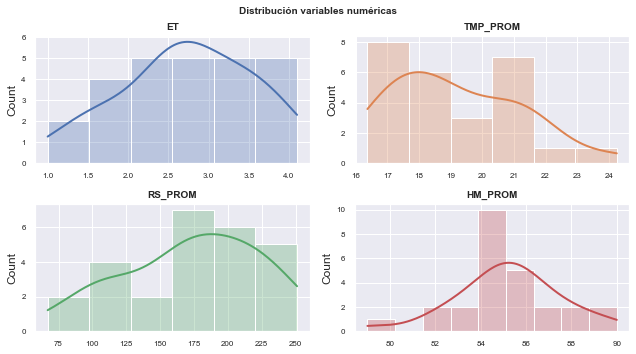

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3024
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


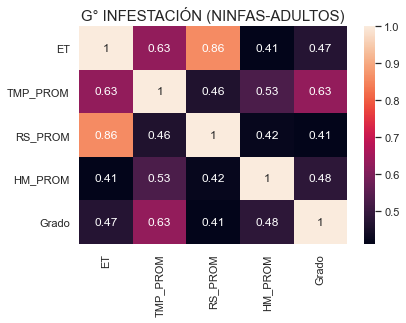

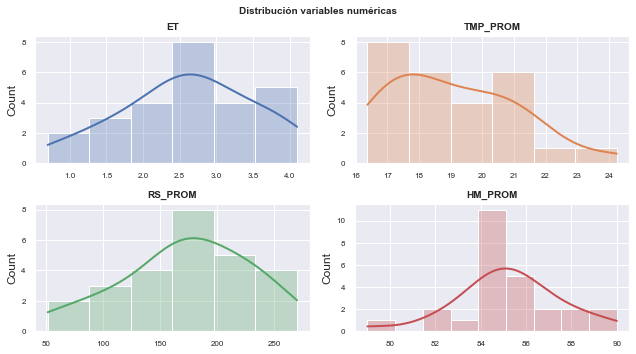

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


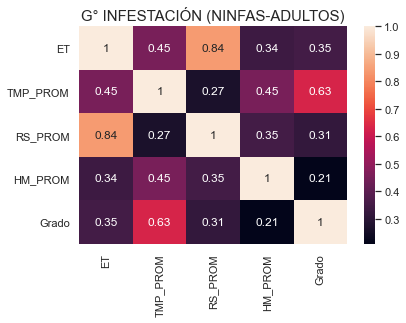

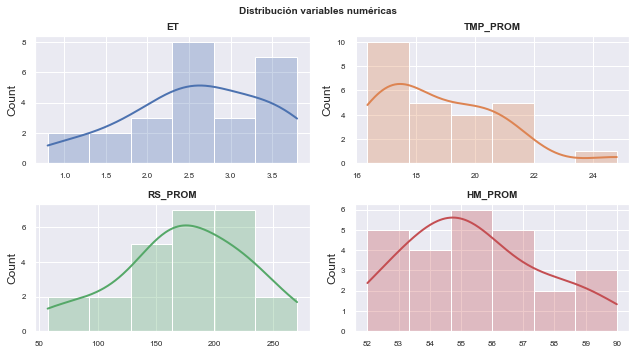

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


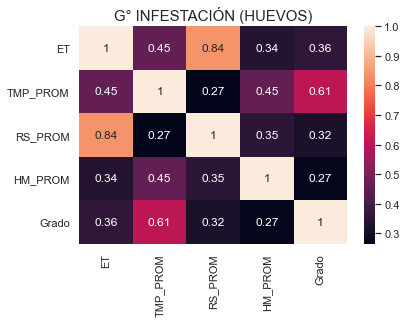

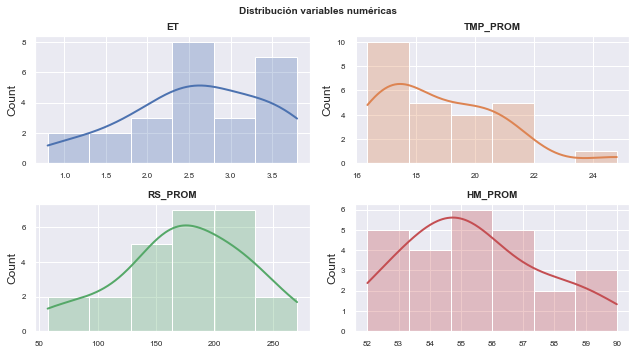

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3005
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


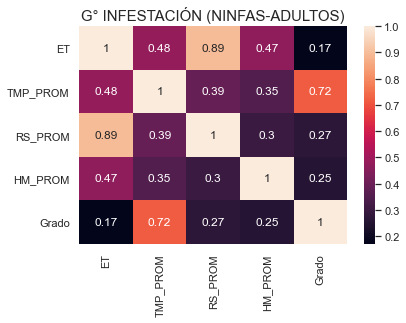

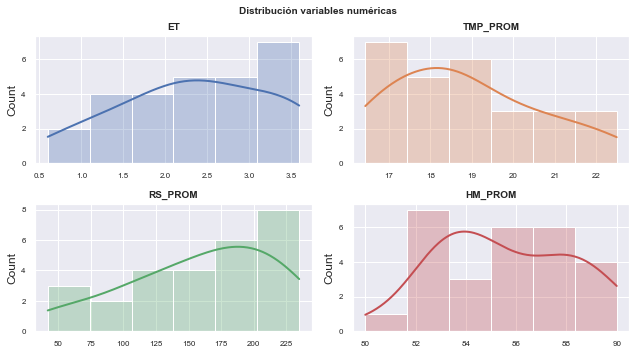

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3005
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


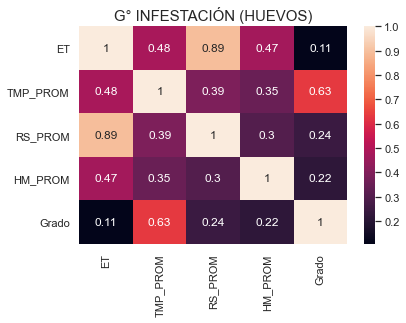

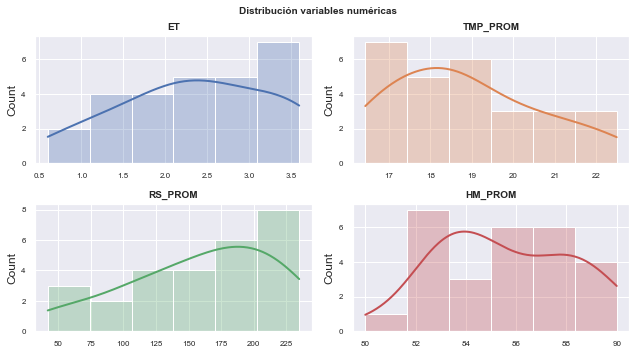

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3005
Plaga:  BEMISIA TABACI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


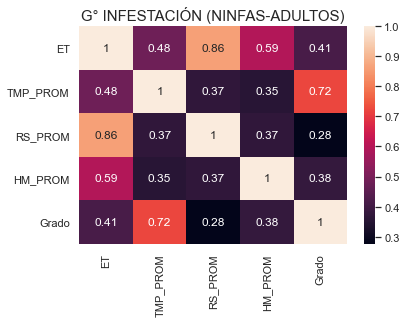

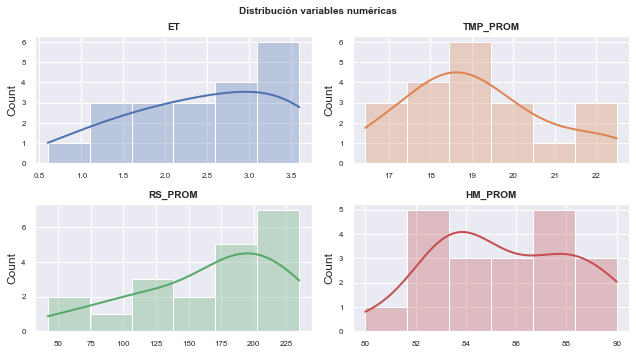

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


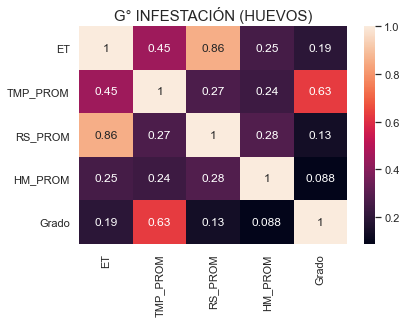

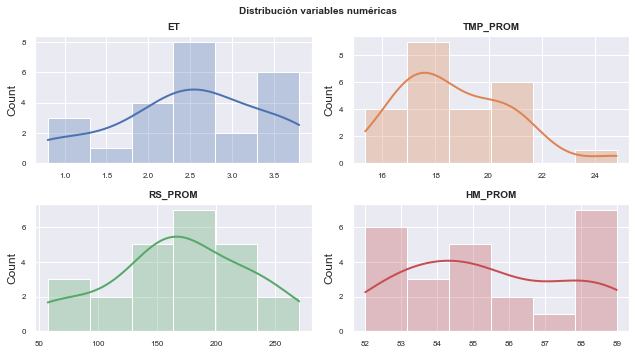

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


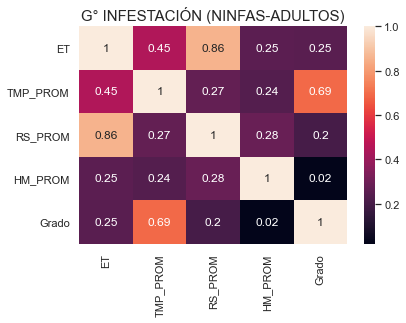

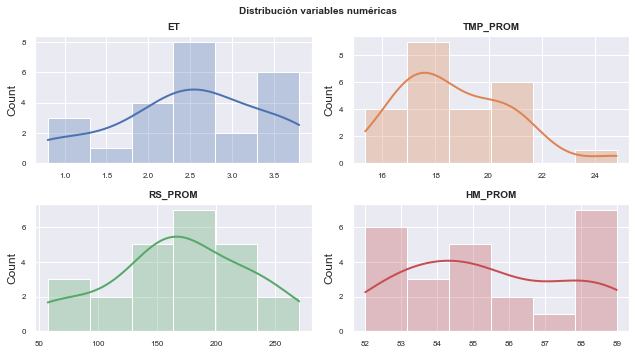

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3028
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


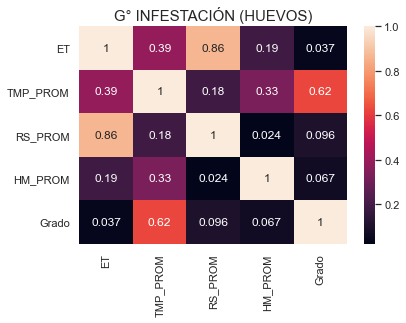

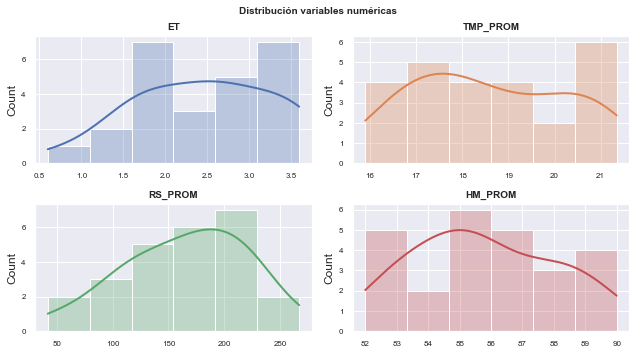

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3021
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


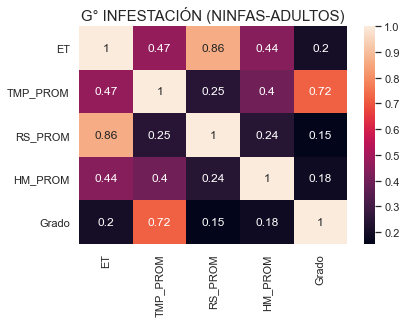

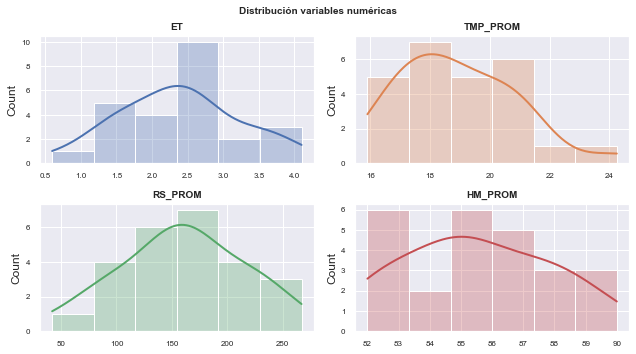

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3021
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


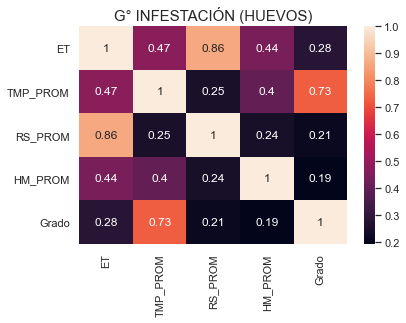

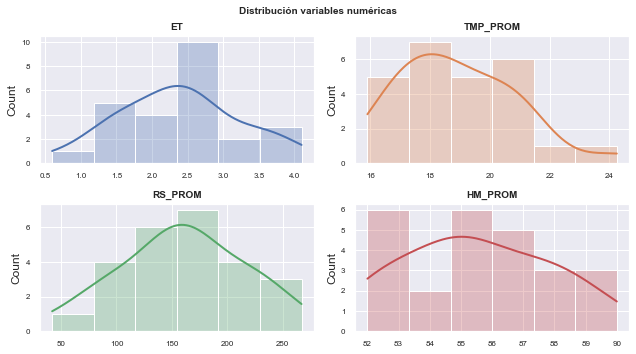

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3020
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


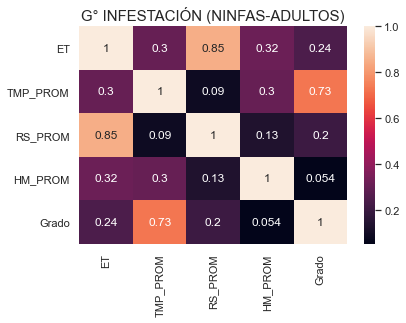

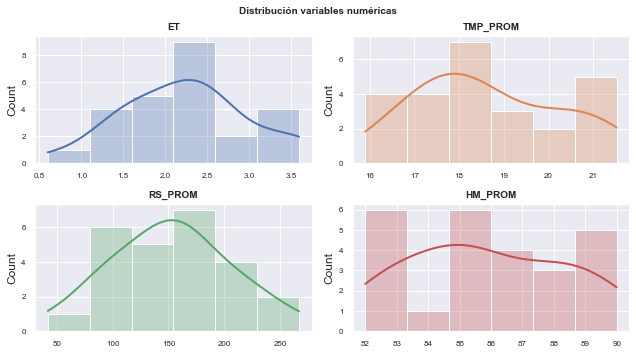

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3020
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


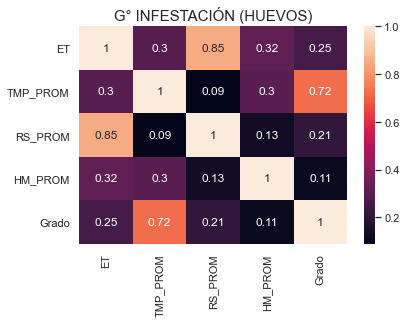

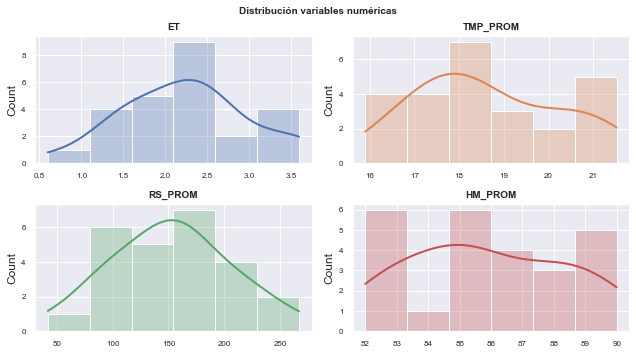

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3022
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


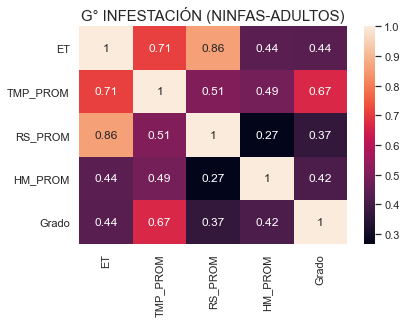

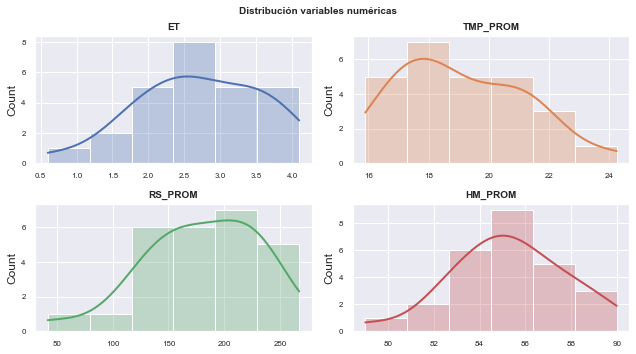

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3022
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


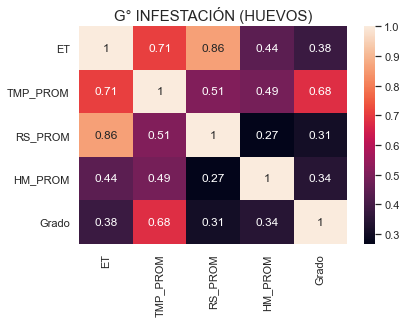

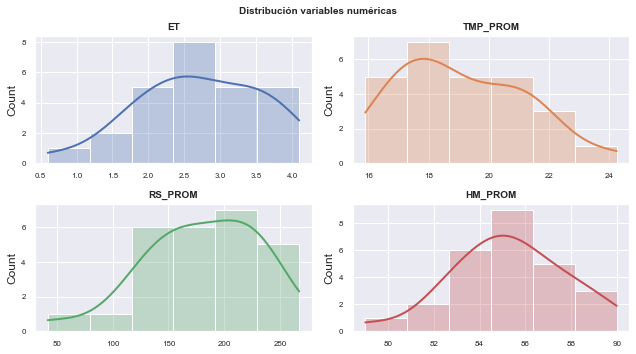

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3017
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


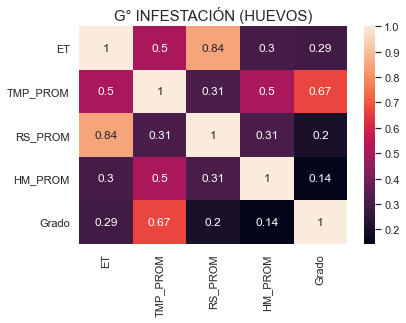

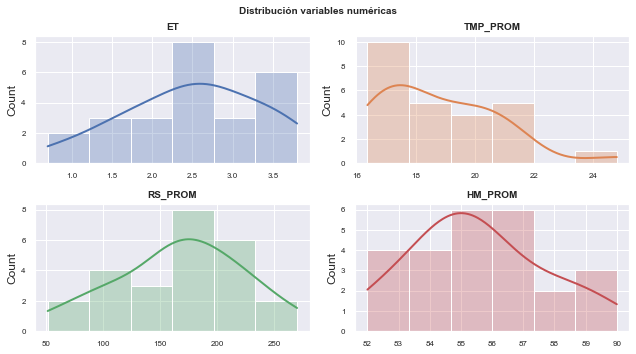

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3027
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


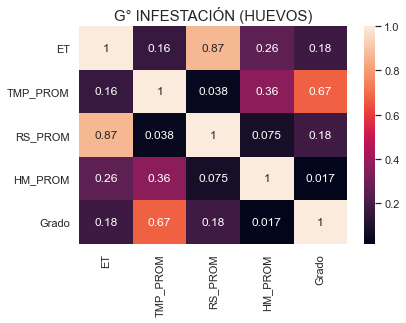

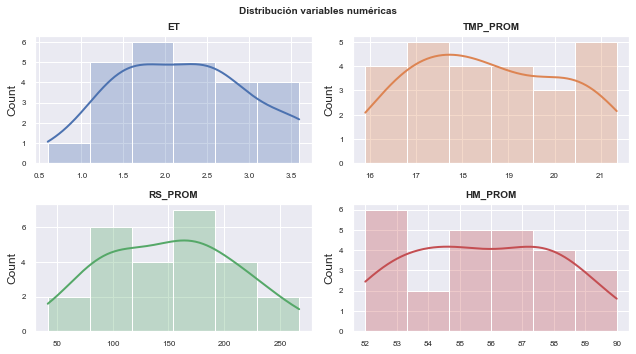

------------------------------------------------------------
Lugar: Filtrado 30 - Turno F30 - Lote 3027
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
------------------------------------------------------------


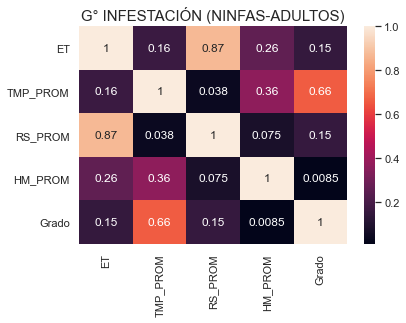

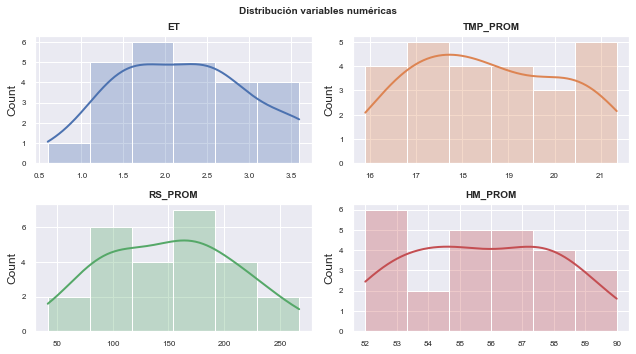

------------------------------------------------------------
Lugar: Filtrado 9N - Turno 11 - Lote 995
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
------------------------------------------------------------


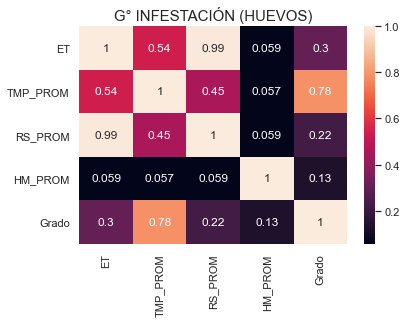

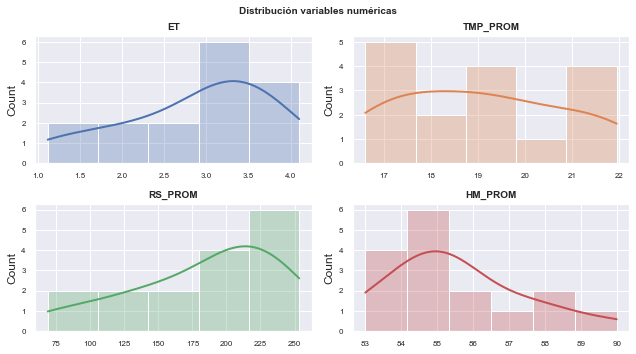

In [18]:
arrPlagas = []
dfFilter = df
dfCorrexLote = pd.DataFrame(columns=['Filtrado', 'Turno', 'Lote', 'Plaga','Caracteristica'])
iContador = 0
for filtrado in arrFiltrados:
    dfFiltrado = dfFilter[dfFilter['Filtrado'] == filtrado]
    arrTurno = dfFiltrado['Turno'].unique()
    for turno in arrTurno:
        dfTurno = dfFiltrado[dfFiltrado['Turno'] == turno]
        arrLote = dfTurno['Lote'].unique()
        for lote in arrLote:  
            dfLote = dfTurno[dfTurno['Lote'] == lote]
            arrPlagaxLote = dfLote['Plaga'].unique()
            for plaga in arrPlagaxLote:
                dfPlaga = dfLote[dfLote['Plaga'] == plaga]
                arrPlagaxCarac = dfPlaga['Caracteristica'].unique()
                for caracteristica in arrPlagaxCarac:
                    dfCarac = dfPlaga[dfPlaga['Caracteristica'] == caracteristica]
                    dfCarac = dfCarac.sort_values(by=['Fecha'])
         
                    dfCarac = dfCarac.groupby(['Fecha','Fundo','Filtrado','Turno','Plaga','Caracteristica'])['Grado'].sum().reset_index()
                    
                    fl_df_weather = df_weather[df_weather['Fecha'].isin(dfCarac['Fecha'])]
                    fl_df_weather = fl_df_weather.sort_values(by=['Fecha'])
                    fl_df_weather.reset_index(drop = True, inplace = True)
                    fl_df_weather = fl_df_weather.rename(columns = {'Fecha' : 'FechaClima'})
                    df_union = fl_df_weather.join(dfCarac)
                 
                    # Filtrar el dataset por las variables que se usarán
                    #df_union = df_union[['Fecha','ET','TMP_PROM','T_MIN','T_MAX','RS_PROM','HM_PROM','Grado']]        
                    df_union = df_union[['Fecha','ET','TMP_PROM','RS_PROM','HM_PROM','Grado']]   
                    
                    df_union[["Grado"]] = df_union[["Grado"]].apply(pd.to_numeric)
                    #print(df_union)
                
                    dfCorrelacion = df_union.corr().abs()
                    
                    dfCorrelacion_index = dfCorrelacion[dfCorrelacion['Grado'] > 0.60]

                    if dfCorrelacion_index.shape[0] > 1:   
                        
                        dfCorrexLote = dfCorrexLote.append({'Filtrado': filtrado,'Turno': turno,'Lote' : lote, 'Plaga': plaga,'Caracteristica': caracteristica},ignore_index=True)
                        arrPlagas.append(plaga + ' ' + caracteristica)
                        #Creando Mapa de Calor
                        sns.set()
                        
                        print('------------------------------------------------------------')
                        print('Lugar: Filtrado {} - Turno {} - Lote {}'.format(filtrado,turno, lote))
                        print('Plaga: ', plaga)
                        print('Caracteristica: ', caracteristica)      
                        
                        print('------------------------------------------------------------')
                        
                        ax = sns.heatmap(dfCorrelacion, annot = True)
                        iContador = iContador + 1
                        plt.title('{}'.format(caracteristica), fontdict = { 'fontsize' : '15'})
                        #plt.show()
                        
                        # Gráfico de distribución para cada variable numérica
                        # ==============================================================================
                        # Ajustar número de subplots en función del número de columnas

                        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(9, 5))
                        axes = axes.flat
                        columnas_numeric = df_union[['ET','TMP_PROM','RS_PROM','HM_PROM','Grado']].select_dtypes(include=['float64', 'int']).columns

                        for i, colum in enumerate(columnas_numeric):
                            sns.histplot(
                                data    = df_union[['ET','TMP_PROM','RS_PROM','HM_PROM','Grado']],
                                x       = colum,
                                stat    = "count",
                                kde     = True,
                                color   = (list(plt.rcParams['axes.prop_cycle'])*2)[i]["color"],
                                line_kws= {'linewidth': 2},
                                alpha   = 0.3,
                                ax      = axes[i]
                            )
                            axes[i].set_title(colum, fontsize = 10, fontweight = "bold")
                            axes[i].tick_params(labelsize = 8)
                            axes[i].set_xlabel("")



                        fig.tight_layout()
                        plt.subplots_adjust(top = 0.9)
                        fig.suptitle('Distribución variables numéricas', fontsize = 10, fontweight = "bold");

                        plt.show()
                        
                        
                        

In [16]:
arrPlagas

['OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI',
 'OLYGONICHUS PUNICAE, OLIGONYCHUS

## Ajuste del modelo

In [17]:
dfFilter = df

In [18]:
dfCorrexLote = pd.DataFrame(columns=['Filtrado', 'Turno', 'Lote', 'Plaga','Caracteristica'])

**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1030
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.451
Model:                            OLS   Adj. R-squared:                  0.428
Method:                 Least Squares   F-statistic:                     19.74
Date:                Mon, 26 Jul 2021   Prob (F-statistic):           0.000171
Time:                        22:36:55   Log-Likelihood:                -32.533
No. Observations:                  26   AIC:                             69.07
Df Residuals:                      24   BIC:                             71.58
Df Model:                           1                          

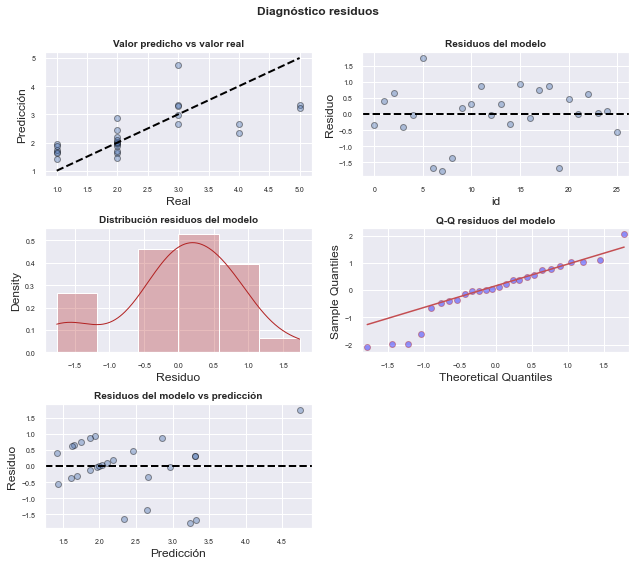


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.669875  0.187359       2.283184       3.056566      0.812626   
14  1.414266  0.271636       0.853638       1.974895     -0.486825   
13  1.650761  0.233005       1.169863       2.131659     -0.228363   
18  1.612484  0.238877       1.119467       2.105501     -0.269777   

    obs_ci_upper  
27      4.527123  
14      3.315357  
13      3.529884  
18      3.494746  

El error (rmse) de test es: 0.9821380140421684



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1030
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  33
Variables X: ['ET', 'TMP_PROM']



                            OLS Regression Result

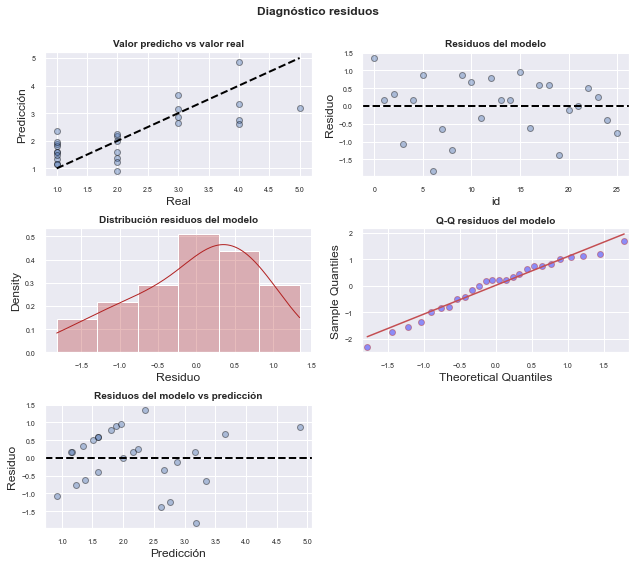


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.349286  0.216497       1.901427       2.797144      0.553046   
14  1.164023  0.260046       0.626078       1.701969     -0.656769   
13  1.343103  0.225358       0.876914       1.809292     -0.457794   
18  0.917436  0.343397       0.207065       1.627807     -0.961533   

    obs_ci_upper  
27      4.145525  
14      2.984816  
13      3.144001  
18      2.796406  

El error (rmse) de test es: 0.8681485248852729



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1006
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results             

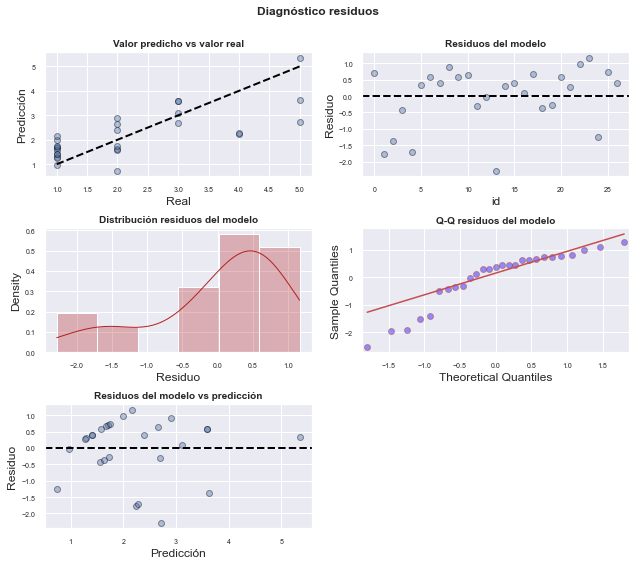


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.704772  0.204321       1.283965       2.125579     -0.278694   
7   2.242783  0.181161       1.869675       2.615892      0.268886   
3   3.617807  0.312806       2.973571       4.262044      1.575235   
10  1.565746  0.217250       1.118312       2.013180     -0.423540   

    obs_ci_upper  
18      3.688238  
7       4.216680  
3       5.660379  
10      3.555031  

El error (rmse) de test es: 0.9816570785508286



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1006
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results     

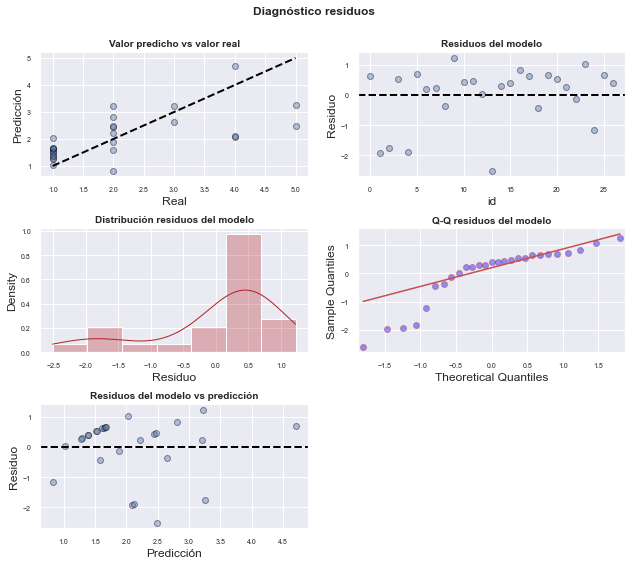


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.639505  0.217728       1.191087       2.087923     -0.474107   
7   2.091342  0.193048       1.693751       2.488932     -0.012073   
3   3.246125  0.333331       2.559616       3.932634      1.069529   
10  1.522747  0.231504       1.045955       1.999540     -0.597066   

    obs_ci_upper  
18      3.753117  
7       4.194757  
3       5.422721  
10      3.642560  

El error (rmse) de test es: 1.1034228721904



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  32
Variables X: ['TMP_PROM']



                            OLS Regression Results        

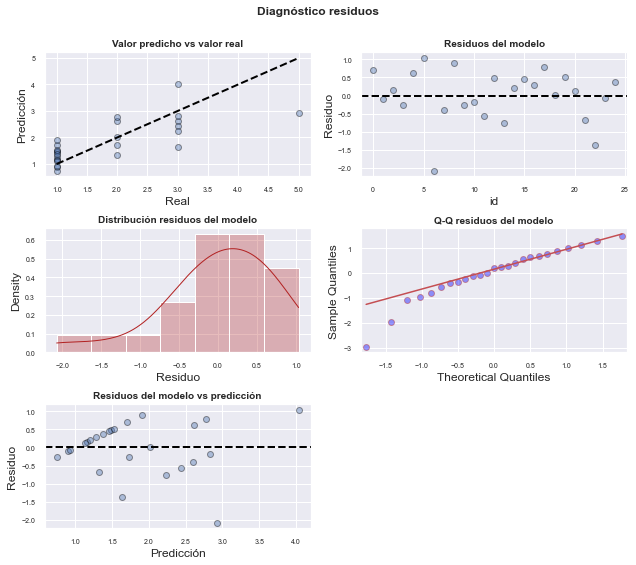


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  1.702313  0.148344       1.395440       2.009186      0.160639   
14  0.905231  0.228514       0.432514       1.377948     -0.677820   
13  1.156177  0.194584       0.753650       1.558705     -0.407349   
18  0.747120  0.252090       0.225632       1.268608     -0.851172   

    obs_ci_upper  
23      3.243987  
14      2.488281  
13      2.719704  
18      2.345412  

El error (rmse) de test es: 0.8783196281155147



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1010
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  31
Variables X: ['TMP_PROM']



                            OLS Regression Results             

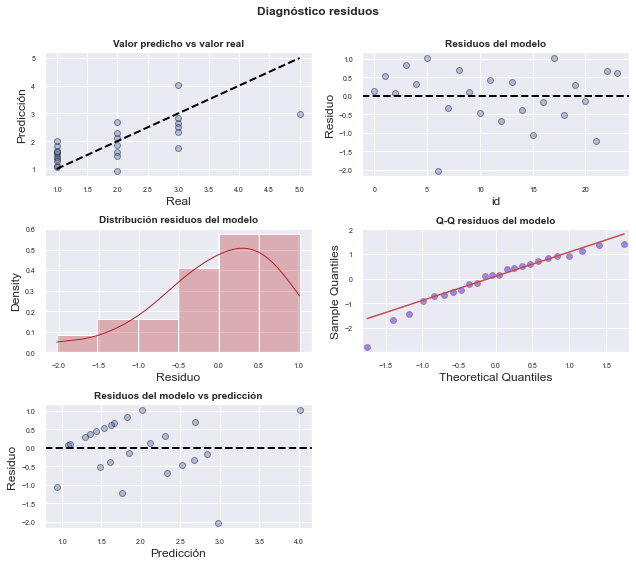


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  2.117121  0.160170       1.784949       2.449293      0.494798   
14  1.528427  0.182794       1.149337       1.907518     -0.104149   
13  1.081481  0.248609       0.565897       1.597066     -0.588076   
22  1.826844  0.158963       1.497175       2.156512      0.205031   

    obs_ci_upper  
23      3.739445  
14      3.161003  
13      2.751039  
22      3.448656  

El error (rmse) de test es: 0.8957608081204306



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  31
Variables X: ['TMP_PROM']



                            OLS Regression Results     

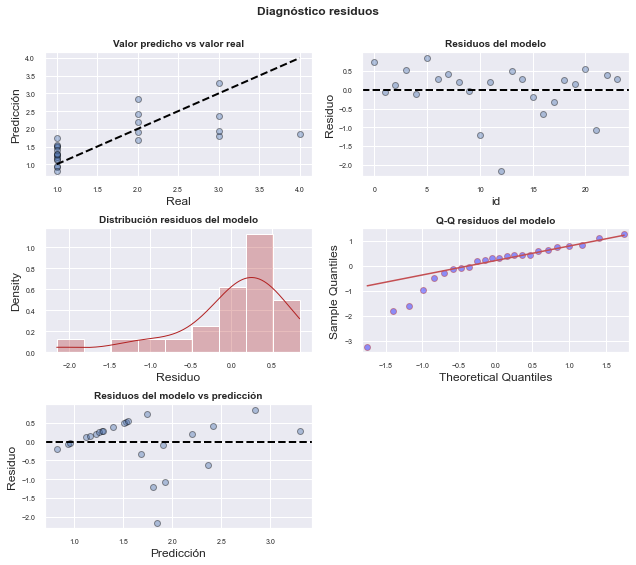


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  1.736395  0.142877       1.440087       2.032703      0.264300   
14  0.935376  0.223314       0.472252       1.398499     -0.579138   
13  1.120638  0.191613       0.723257       1.518020     -0.375082   
22  1.523825  0.145868       1.221312       1.826338      0.050468   

    obs_ci_upper  
23      3.208491  
14      2.449889  
13      2.616358  
22      2.997182  

El error (rmse) de test es: 1.0486788575790913



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1012
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  31
Variables X: ['TMP_PROM']



                            OLS Regression Results             

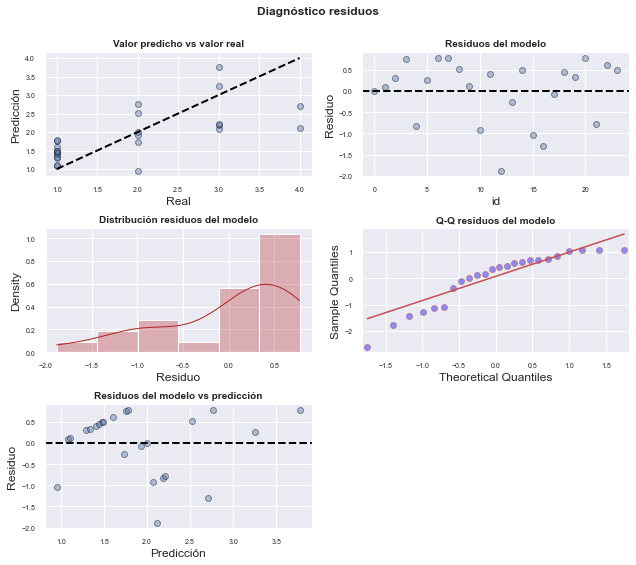


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  1.995763  0.155769       1.672719       2.318808      0.390838   
14  1.087126  0.243463       0.582214       1.592039     -0.564044   
13  1.297279  0.208903       0.864041       1.730517     -0.333403   
22  1.754634  0.159030       1.424825       2.084443      0.148334   

    obs_ci_upper  
23      3.600688  
14      2.738297  
13      2.927960  
22      3.360935  

El error (rmse) de test es: 1.2083358047156951



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results     

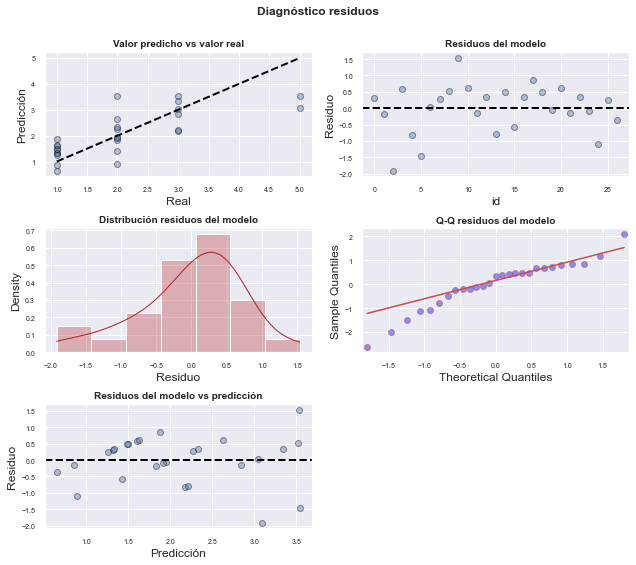


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.318482  0.196145       0.914513       1.722450     -0.299431   
7   1.824920  0.152592       1.510651       2.139190      0.227042   
3   3.088128  0.228310       2.617914       3.558341      1.452417   
10  1.597697  0.167944       1.251809       1.943584     -0.006700   

    obs_ci_upper  
18      2.936394  
7       3.422798  
3       4.723839  
10      3.202093  

El error (rmse) de test es: 1.4502673268298314



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1009
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results             

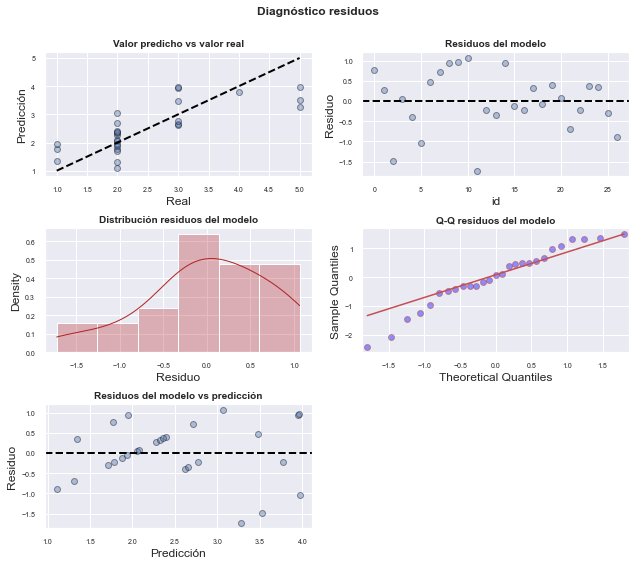


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.771345  0.191469       1.377007       2.165683      0.192004   
7   2.272141  0.148954       1.965363       2.578918      0.712356   
3   3.521274  0.222867       3.062270       3.980277      1.924559   
10  2.047449  0.163940       1.709807       2.385090      0.481302   

    obs_ci_upper  
18      3.350685  
7       3.831925  
3       5.117989  
10      3.613596  

El error (rmse) de test es: 1.3713392092296812



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1029
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results     

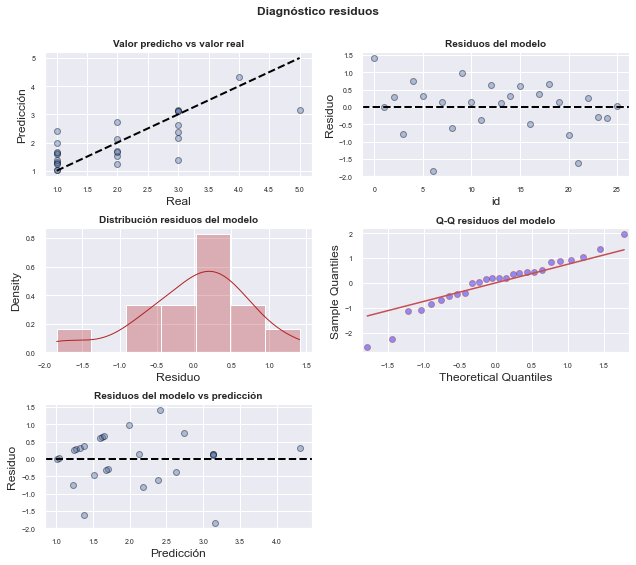


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.414627  0.161695       2.080904       2.748350      0.832347   
14  1.010012  0.235746       0.523456       1.496569     -0.611400   
13  1.274572  0.200859       0.860019       1.689125     -0.326707   
18  1.231753  0.206167       0.806246       1.657260     -0.372396   

    obs_ci_upper  
27      3.996908  
14      2.631424  
13      2.875851  
18      2.835903  

El error (rmse) de test es: 0.8898475201399775



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1029
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results             

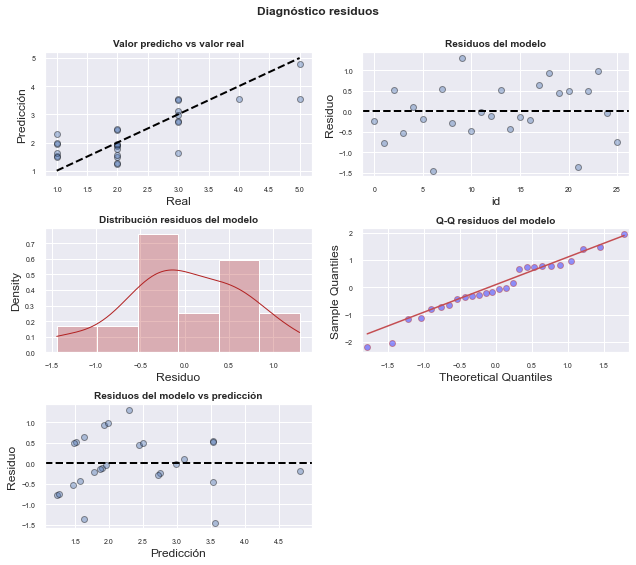


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.752964  0.148948       2.445551       3.060377      1.295429   
14  1.233922  0.217160       0.785725       1.682119     -0.259660   
13  1.520034  0.185024       1.138164       1.901905      0.044998   
18  1.473727  0.189913       1.081767       1.865688     -0.003953   

    obs_ci_upper  
27      4.210499  
14      2.727504  
13      2.995071  
18      2.951408  

El error (rmse) de test es: 0.9628825644778483



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results     

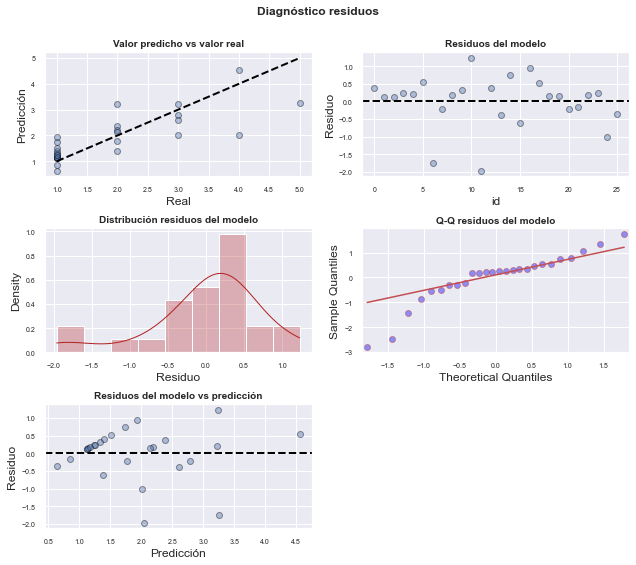


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.380137  0.161312       2.047205       2.713069      0.831115   
14  1.122548  0.192609       0.725023       1.520074     -0.441630   
13  1.118227  0.193070       0.719749       1.516704     -0.446194   
18  1.237503  0.180880       0.864186       1.610820     -0.320698   

    obs_ci_upper  
27      3.929160  
14      2.686726  
13      2.682647  
18      2.795705  

El error (rmse) de test es: 1.3492835366299942



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1007
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results             

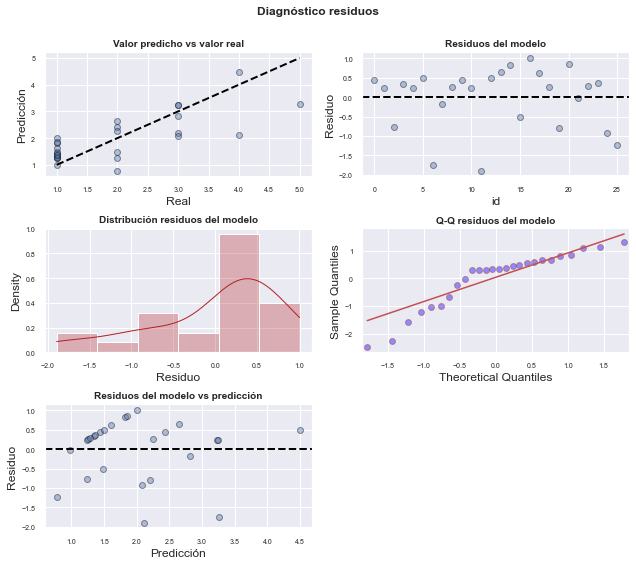


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.433126  0.175055       2.071830       2.794422      0.752135   
14  1.241392  0.209018       0.809999       1.672785     -0.456046   
13  1.237297  0.209519       0.804871       1.669723     -0.460404   
18  1.350327  0.196290       0.945206       1.755449     -0.340625   

    obs_ci_upper  
27      4.114117  
14      2.938830  
13      2.934998  
18      3.041280  

El error (rmse) de test es: 1.3718607311507334



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1028
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results     

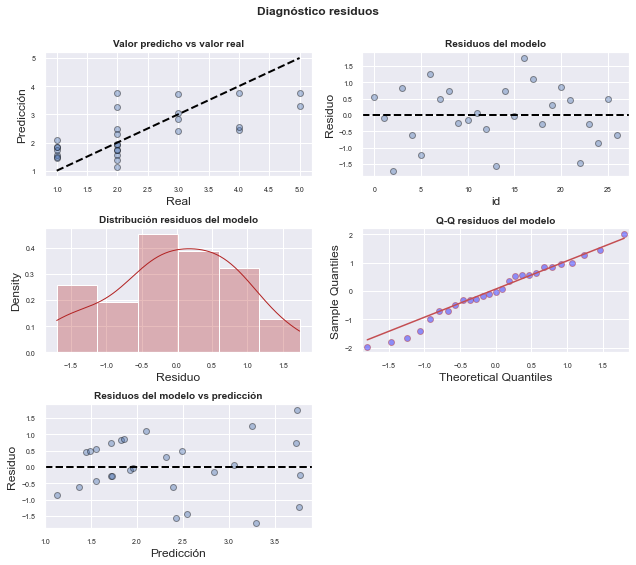


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.552300  0.241070       1.055808       2.048792     -0.369389   
7   1.920598  0.194725       1.519554       2.321642      0.021329   
3   3.296968  0.269720       2.741469       3.852468      1.359195   
10  1.827574  0.204555       1.406285       2.248864     -0.076072   

    obs_ci_upper  
18      3.473990  
7       3.819867  
3       5.234742  
10      3.731221  

El error (rmse) de test es: 1.198151132007171



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1028
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results              

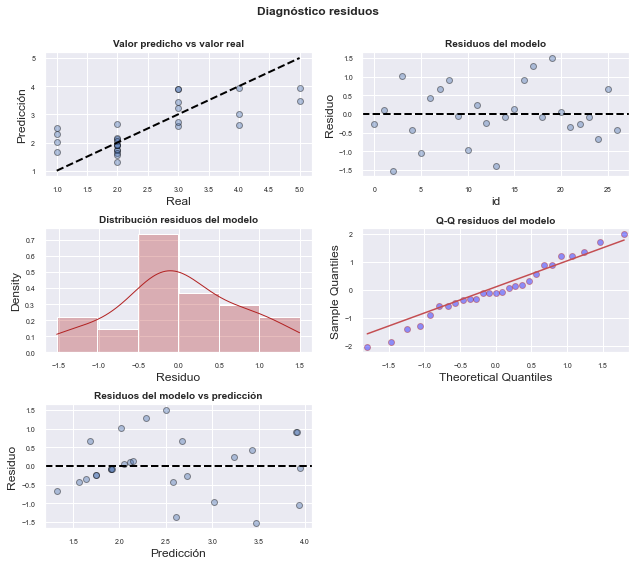


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.742602  0.209114       1.311924       2.173280      0.075649   
7   2.108487  0.168913       1.760605       2.456370      0.460982   
3   3.475841  0.233967       2.993978       3.957704      1.794936   
10  2.016073  0.177440       1.650629       2.381517      0.364771   

    obs_ci_upper  
18      3.409555  
7       3.755992  
3       5.156746  
10      3.667375  

El error (rmse) de test es: 1.0750420883292173



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results     

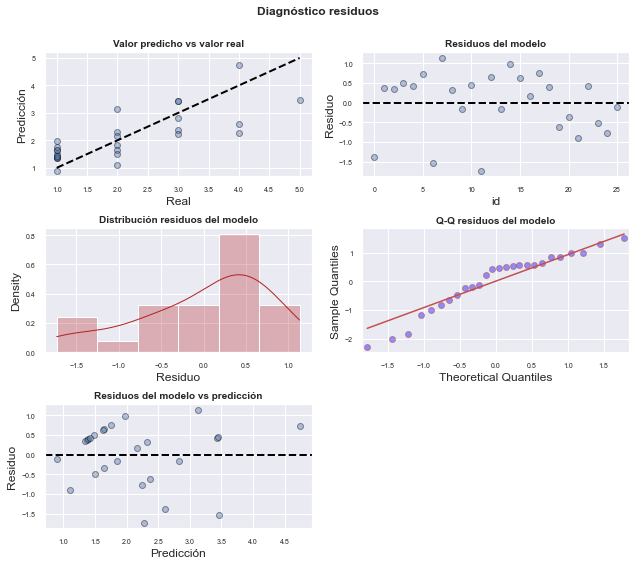


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.605512  0.174194       2.245993       2.965031      0.933569   
14  1.372718  0.206949       0.945597       1.799840     -0.315053   
13  1.343063  0.210425       0.908766       1.777360     -0.346538   
18  1.485406  0.194440       1.084102       1.886711     -0.196017   

    obs_ci_upper  
27      4.277455  
14      3.060490  
13      3.032665  
18      3.166830  

El error (rmse) de test es: 1.2555722739625994



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1014
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  33
Variables X: ['TMP_PROM']



                            OLS Regression Results             

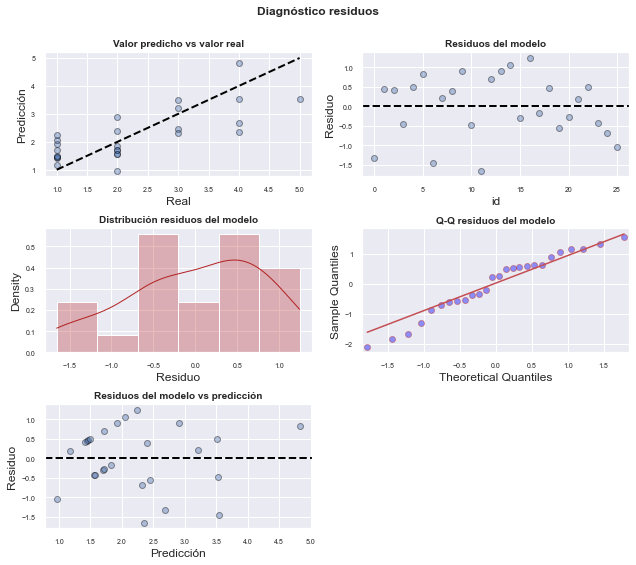


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
27  2.684393  0.180201       2.312476       3.056310      0.954793   
14  1.446256  0.214085       1.004405       1.888106     -0.299718   
13  1.416473  0.217682       0.967199       1.865746     -0.331394   
18  1.559433  0.201145       1.144289       1.974576     -0.179974   

    obs_ci_upper  
27      4.413992  
14      3.192229  
13      3.164339  
18      3.298839  

El error (rmse) de test es: 1.282031606799942



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results      

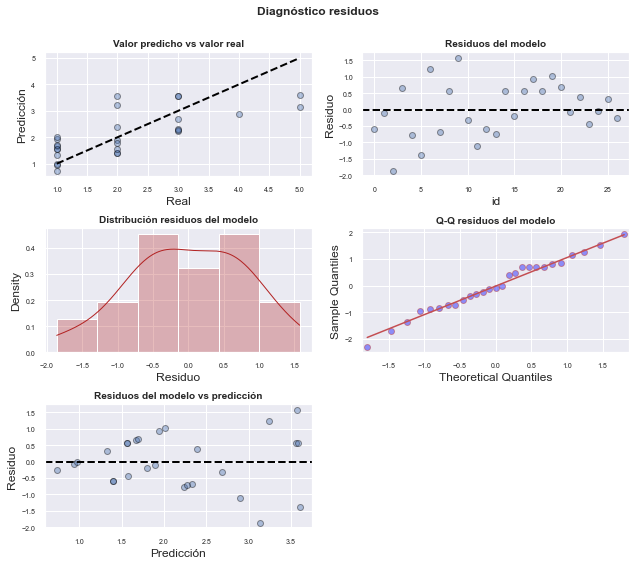


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.395307  0.216449       0.949523       1.841091     -0.397496   
7   1.893715  0.169332       1.544969       2.242461      0.122545   
3   3.136893  0.248445       2.625210       3.648575      1.326578   
10  1.670095  0.186021       1.286977       2.053213     -0.108162   

    obs_ci_upper  
18      3.188110  
7       3.664885  
3       4.947207  
10      3.448352  

El error (rmse) de test es: 1.1644593082682493



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1015
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results             

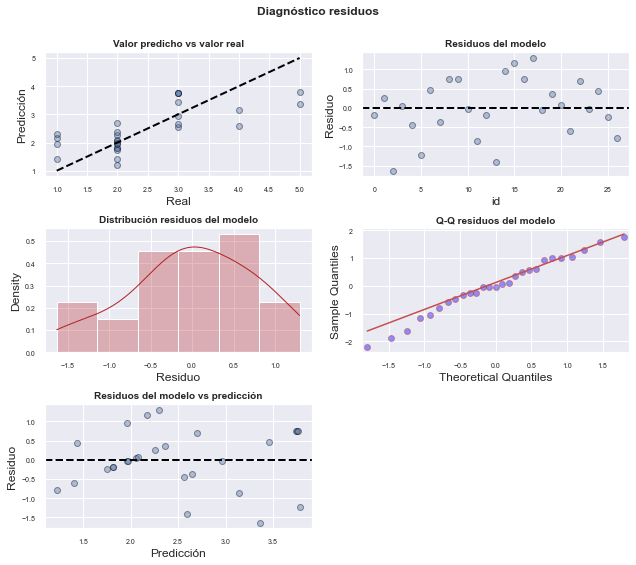


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.808774  0.199269       1.398371       2.219177      0.158263   
7   2.254131  0.155893       1.933064       2.575197      0.623536   
3   3.364983  0.228726       2.893912       3.836054      1.698350   
10  2.054313  0.171257       1.701602       2.407023      0.417193   

    obs_ci_upper  
18      3.459285  
7       3.884726  
3       5.031615  
10      3.691432  

El error (rmse) de test es: 0.9969055074337912



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results             

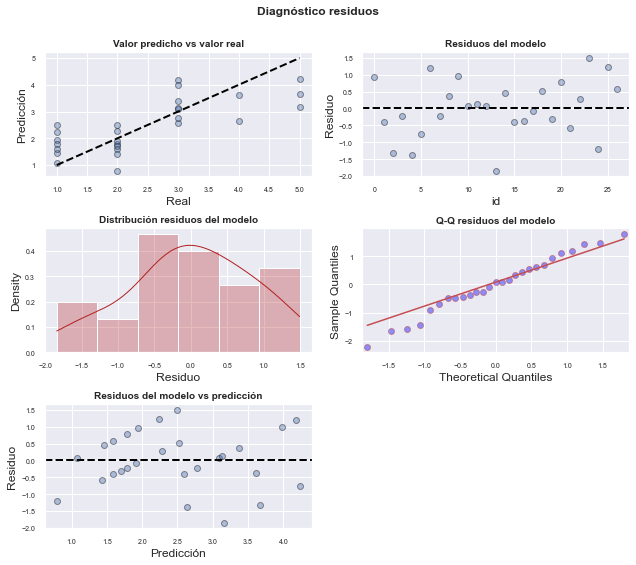


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.946373  0.191966       1.551012       2.341735      0.117050   
7   2.588528  0.167973       2.242581       2.934475      0.769245   
3   3.670532  0.268838       3.116850       4.224213      1.800591   
10  1.780436  0.208075       1.351896       2.208975     -0.056344   

    obs_ci_upper  
18      3.775696  
7       4.407812  
3       5.540472  
10      3.617215  

El error (rmse) de test es: 1.248570841800437



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1008
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  34
Variables X: ['TMP_PROM']



                            OLS Regression Results      

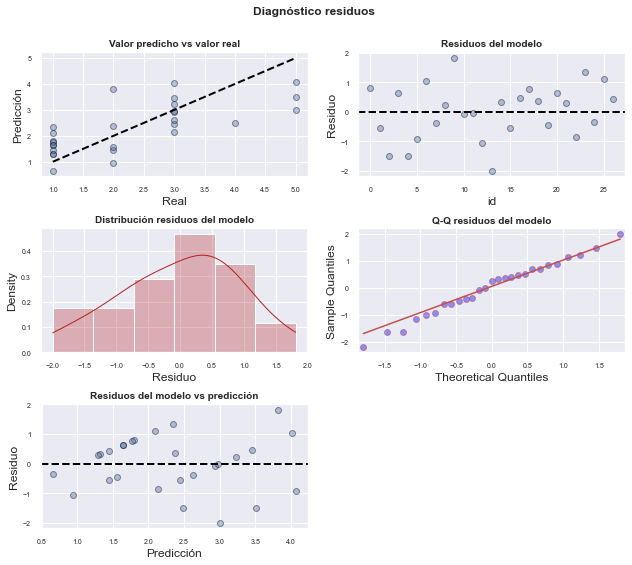


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
18  1.803046  0.209953       1.370638       2.235453     -0.197687   
7   2.439416  0.183712       2.061053       2.817779      0.449664   
3   3.511672  0.294028       2.906110       4.117234      1.466517   
10  1.638603  0.227572       1.169909       2.107297     -0.370284   

    obs_ci_upper  
18      3.803778  
7       4.429168  
3       5.556827  
10      3.647490  

El error (rmse) de test es: 1.0593628693023893



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1016
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (HUEVOS)
Número de datos:  32
Variables X: ['TMP_PROM']



                            OLS Regression Results             

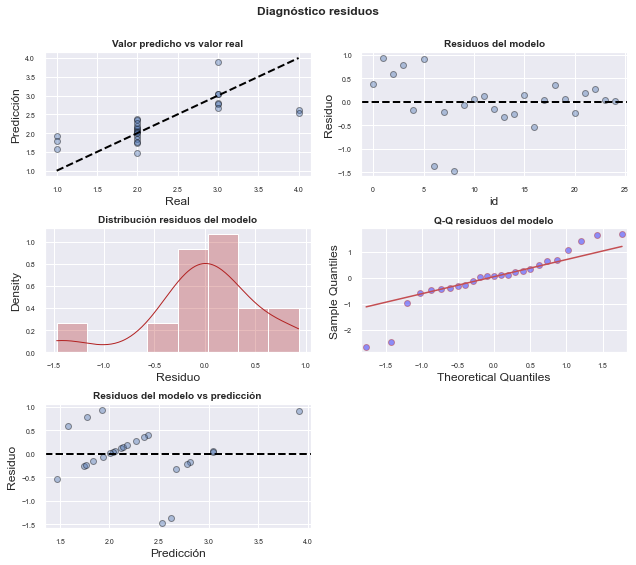


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  2.386880  0.118175       2.142417       2.631344      1.163090   
14  1.930722  0.138009       1.645228       2.216216      0.698080   
13  1.584399  0.188881       1.193669       1.975128      0.323221   
18  1.779370  0.157981       1.452561       2.106178      0.536509   

    obs_ci_upper  
23      3.610670  
14      3.163364  
13      2.845576  
18      3.022231  

El error (rmse) de test es: 1.0149260995692408



**********************************************************************************************************************
**********************************************************************************************************************
Lugar: Filtrado 10N - Turno F10N - Lote 1011
Plaga:  OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI
Caracteristica:  G° INFESTACIÓN (NINFAS-ADULTOS)
Número de datos:  32
Variables X: ['TMP_PROM']



                            OLS Regression Results     

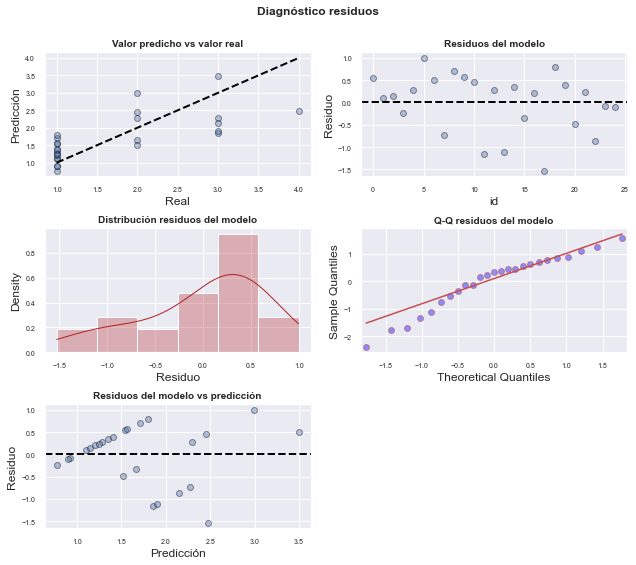


 Predicciones:
        mean   mean_se  mean_ci_lower  mean_ci_upper  obs_ci_lower  \
23  1.545064  0.138740       1.258060       1.832069      0.129308   
14  1.102052  0.184334       0.720728       1.483376     -0.335795   
13  1.140881  0.178969       0.770657       1.511106     -0.294061   
18  0.770234  0.236208       0.281601       1.258866     -0.699717   

    obs_ci_upper  
23      2.960821  
14      2.539898  
13      2.575824  
18      2.240185  

El error (rmse) de test es: 1.1208041936005715



**********************************************************************************************************************


In [19]:
for filtrado in arrFiltrados:
    dfFiltrado = dfFilter[dfFilter['Filtrado'] == filtrado]
    arrTurno = dfFiltrado['Turno'].unique()
    for turno in arrTurno:
        dfTurno = dfFiltrado[dfFiltrado['Turno'] == turno]
        arrLote = dfTurno['Lote'].unique()
        for lote in arrLote:  
            dfLote = dfTurno[dfTurno['Lote'] == lote]
            arrPlagaxLote = dfLote['Plaga'].unique()
            for plaga in arrPlagaxLote:
                dfPlaga = dfLote[dfLote['Plaga'] == plaga]
                arrPlagaxCarac = dfPlaga['Caracteristica'].unique()
                for caracteristica in arrPlagaxCarac:
                    dfCarac = dfPlaga[dfPlaga['Caracteristica'] == caracteristica]
                    dfCarac = dfCarac.sort_values(by=['Fecha'])
         
                    dfCarac = dfCarac.groupby(['Fecha','Fundo','Filtrado','Turno','Plaga','Caracteristica'])['Grado'].sum().reset_index()
                    
                    fl_df_weather = df_weather[df_weather['Fecha'].isin(dfCarac['Fecha'])]
                    fl_df_weather = fl_df_weather.sort_values(by=['Fecha'])
                    fl_df_weather.reset_index(drop = True, inplace = True)
                    fl_df_weather = fl_df_weather.rename(columns = {'Fecha' : 'FechaClima'})
                    df_union = fl_df_weather.join(dfCarac)
                 
                    #df_union = df_union[['Fecha','ET','TMP_PROM','T_MIN','T_MAX','RS_PROM','HM_PROM','Grado']]        
                    df_union = df_union[['Fecha','ET','TMP_PROM','RS_PROM','HM_PROM','Grado']]        
                                   
                    df_union[["Grado"]] = df_union[["Grado"]].apply(pd.to_numeric)
                
                    dfCorrelacion = df_union.corr().abs()
                    
                    dfCorrelacion_index = dfCorrelacion[dfCorrelacion['Grado'] > 0.60]

                    if dfCorrelacion_index.shape[0] > 1:   
                        
                        arrColumns = dfCorrelacion_index.columns
                        arrColumnsUnion = []
                        ###########################################
                        for column in arrColumns:
                            if (dfCorrelacion_index[column]['Grado'] > 0.60) & (column != 'Grado'):
                                    arrColumnsUnion.append(column)
                        ############################################  
                        
                         #Creando regresión lineal
                        df_union = df_union.drop('Fecha' ,axis=1)
                        df_union = df_union.fillna(df_union.mean())
                        
                        if df_union[arrColumnsUnion].shape[0] > 30:   
                            print('**********************************************************************************************************************')
                            # División de los datos en train y test
                            # ==============================================================================
                            print('Lugar: Filtrado {} - Turno {} - Lote {}'.format(filtrado,turno, lote))
                            print('Plaga: ', plaga)
                            print('Caracteristica: ', caracteristica)
                            print('Número de datos: ',  df_union[arrColumnsUnion].shape[0])
                            print('Variables X:', arrColumnsUnion)
                            print("\n"*2)
                            
                            X = df_union[arrColumnsUnion]
                            y = df_union['Grado']

                            X_train, X_test, y_train, y_test = train_test_split(
                                                                    X,
                                                                    y.values.reshape(-1,1),
                                                                    train_size   = 0.8,
                                                                    random_state = 1234,
                                                                    shuffle      = True
                                                                )
                            # Creación del modelo utilizando matrices como en scikitlearn
                            # ==============================================================================
                            # A la matriz de predictores se le tiene que añadir una columna de 1s para el intercept del modelo
                            X_train = sm.add_constant(X_train, prepend=True)
                            modelo = sm.OLS(endog=y_train, exog=X_train,)
                            modelo = modelo.fit()
                            print(modelo.summary())
                            
                            print('\n Coeficientes')
                            print(modelo.params)
                            
                            # Intervalos de confianza para los coeficientes del modelo
                            # ==============================================================================
                            intervalos_ci = modelo.conf_int(alpha=0.05)
                            intervalos_ci.columns = ['2.5%', '97.5%']
                            
                            print('\nIntervalos de confianza: ')
                            print(intervalos_ci)
                            
                            
                            print('\n Diagnostico de residuos:')
                            # Diagnóstico errores (residuos) de las predicciones de entrenamiento
                            # ==============================================================================
                            y_train = y_train.flatten()
                            prediccion_train = modelo.predict(exog = X_train)
                            residuos_train   = prediccion_train - y_train
                            
                            # Gráficos
                            # ==============================================================================
                            fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(9, 8))

                            axes[0, 0].scatter(y_train, prediccion_train, edgecolors=(0, 0, 0), alpha = 0.4)
                            axes[0, 0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()],
                                            'k--', color = 'black', lw=2)
                            axes[0, 0].set_title('Valor predicho vs valor real', fontsize = 10, fontweight = "bold")
                            axes[0, 0].set_xlabel('Real')
                            axes[0, 0].set_ylabel('Predicción')
                            axes[0, 0].tick_params(labelsize = 7)

                            axes[0, 1].scatter(list(range(len(y_train))), residuos_train,
                                               edgecolors=(0, 0, 0), alpha = 0.4)
                            axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
                            axes[0, 1].set_title('Residuos del modelo', fontsize = 10, fontweight = "bold")
                            axes[0, 1].set_xlabel('id')
                            axes[0, 1].set_ylabel('Residuo')
                            axes[0, 1].tick_params(labelsize = 7)

                            sns.histplot(
                                data    = residuos_train,
                                stat    = "density",
                                kde     = True,
                                line_kws= {'linewidth': 1},
                                color   = "firebrick",
                                alpha   = 0.3,
                                ax      = axes[1, 0]
                            )

                            axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 10,
                                                 fontweight = "bold")
                            axes[1, 0].set_xlabel("Residuo")
                            axes[1, 0].tick_params(labelsize = 7)


                            sm.qqplot(
                                residuos_train,
                                fit   = True,
                                line  = 'q',
                                ax    = axes[1, 1], 
                                color = 'firebrick',
                                alpha = 0.4,
                                lw    = 2
                            )
                            axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 10, fontweight = "bold")
                            axes[1, 1].tick_params(labelsize = 7)

                            axes[2, 0].scatter(prediccion_train, residuos_train,
                                               edgecolors=(0, 0, 0), alpha = 0.4)
                            axes[2, 0].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
                            axes[2, 0].set_title('Residuos del modelo vs predicción', fontsize = 10, fontweight = "bold")
                            axes[2, 0].set_xlabel('Predicción')
                            axes[2, 0].set_ylabel('Residuo')
                            axes[2, 0].tick_params(labelsize = 7)

                            # Se eliminan los axes vacíos
                            fig.delaxes(axes[2,1])

                            fig.tight_layout()
                            plt.subplots_adjust(top=0.9)
                            fig.suptitle('Diagnóstico residuos', fontsize = 12, fontweight = "bold");
                            plt.show()
                            
                            # Predicciones con intervalo de confianza 
                            # ==============================================================================
                            predicciones = modelo.get_prediction(exog = X_train).summary_frame(alpha=0.05)
                            print('\n Predicciones:')
                            print(predicciones.head(4))
                            
                            # Error de test del modelo 
                            # ==============================================================================
                            X_test = sm.add_constant(X_test, prepend=True)
                            predicciones = modelo.predict(exog = X_test)
                            rmse = mean_squared_error(
                                    y_true  = y_test,
                                    y_pred  = predicciones,
                                    squared = False
                                   )
                            print("")
                            print(f"El error (rmse) de test es: {rmse}")
                            
                            print("\n"*2)
                            print('**********************************************************************************************************************')
                            

In [15]:
arrPlagas = np.array(arrPlagas)

In [16]:
pd.unique(arrPlagas)

array(['OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI G° INFESTACIÓN (HUEVOS)',
       'OLYGONICHUS PUNICAE, OLIGONYCHUS YOTHERSI G° INFESTACIÓN (NINFAS-ADULTOS)',
       'BEMISIA TABACI G° INFESTACIÓN (NINFAS-ADULTOS)'], dtype='<U73')